<a href="https://colab.research.google.com/github/akshat2635/auto-eval/blob/main/final_rotate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 19.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manyl

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# required modules
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os
import shutil
import PIL.Image
from PIL import Image


Detected rotation: -0.13367850190235767 degrees


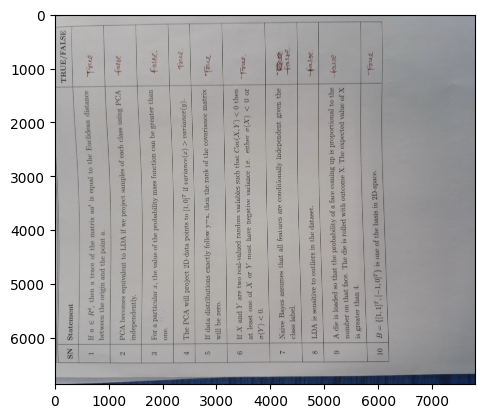

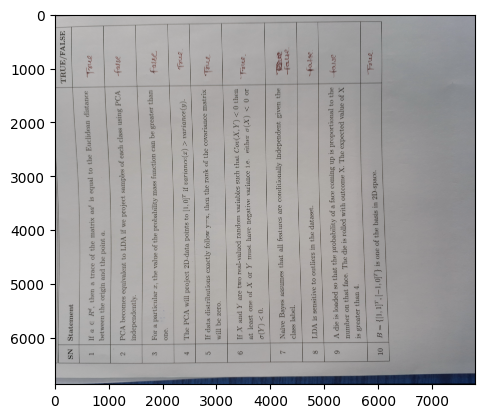

The corrected image has been saved as 'corrected_image.jpg'.
The document image was rotated by -0.13367850190235767 degrees and has been corrected.


In [ ]:
import cv2
import easyocr
import numpy as np

def detect_and_correct_rotation(image_path, corrected_image_path):
    # Initialize the EasyOCR reader
    reader = easyocr.Reader(['en'])

    # Load the image using OpenCV
    image = cv2.imread(image_path)

    # Detect text and its bounding boxes using EasyOCR
    result = reader.readtext(image)

    if not result:
        print("No text detected in the image.")
        return False, 0

    angles = []

    for detection in result:
        bbox = detection[0]
        # Get the angle of the text line
        (top_left, top_right, bottom_right, bottom_left) = bbox
        angle = np.degrees(np.arctan2(bottom_right[1] - bottom_left[1], bottom_right[0] - bottom_left[0]))
        angles.append(angle)

    # Calculate the median angle of all detected text lines
    median_angle = np.mean(angles)
    print(f"Detected rotation: {median_angle} degrees")

    # Correct the rotation based on detected median angle
    if median_angle != 0:
        (h, w) = image.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, -median_angle, 1.0)
        corrected_image = cv2.warpAffine(image, M, (w, h))

        # Save the corrected image
        cv2.imwrite(corrected_image_path, corrected_image)

        plt.imshow(image,cmap='gray')
        plt.show()
        plt.imshow(corrected_image,cmap='gray')
        plt.show()

        print(f"The corrected image has been saved as '{corrected_image_path}'.")

        return True, median_angle
    else:
        print("The document image is not rotated.")
        return False, 0

# Example usage:
image_path = '/content/drive/MyDrive/anand_mishra/data/Sample_Data/20240328_150223.jpg'
corrected_image_path = 'corrected_image.jpg'
is_rotated, rotation_angle = detect_and_correct_rotation(image_path, corrected_image_path)

if is_rotated:
    print(f"The document image was rotated by {rotation_angle} degrees and has been corrected.")
else:
    print("The document image was not rotated or no text was detected.")


In [23]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,768 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [24]:
!pip install pytesseract

-180
Image saved at corrected_image.jpg


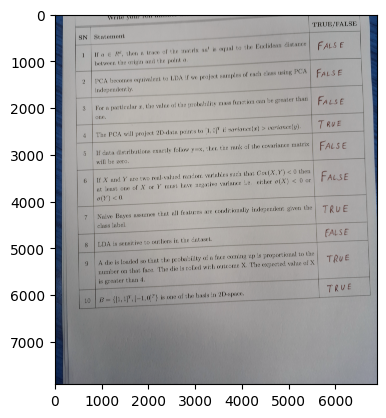

In [75]:
dir="/content/drive/MyDrive/Sample_Data"
arr=[]
imgs=[]
for root,dirs,files in os.walk(dir):
    for file in files:
        path=dir+"/"+file
        arr.append(path)
        img=cv2.imread(path)
        # img=cv2.resize(img,(1700,2000))
        img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # plt.imshow(img,cmap='gray')
        # print(img.shape)
        # break;
        imgs.append(img)

In [41]:
import cv2
import pytesseract
from pytesseract import Output

def get_image_orientation(image_path):
    """
    Detect the orientation of the text in the image and return the angle.
    """
    image = cv2.imread(image_path)

    # Use Tesseract to detect text orientation
    osd = pytesseract.image_to_osd(image, output_type=Output.DICT)

    angle = osd['rotate']
    angle=-angle

    return angle

def correct_image_orientation(image_path,path):
    """
    Correct the orientation of the image and save it.
    """
    image = cv2.imread(image_path)

    # Get the rotation angle
    angle = get_image_orientation(image_path)

    # Rotate the image to correct orientation
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    # Calculate the new bounding dimensions of the image
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])

    # New bounding dimensions
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))

    # Adjust the rotation matrix to the center of rotation
    M[0, 2] += (new_w / 2) - center[0]
    M[1, 2] += (new_h / 2) - center[1]

    # Perform the actual rotation and store the image
    rotated = cv2.warpAffine(image, M, (new_w, new_h))
    cv2.imwrite(path,rotated)

    # Save the corrected image

    # plt.imshow(rotated)
    return path


# Example usage
for i in range(len(arr)):
  if arr[i]=="/content/drive/MyDrive/Sample_Data/20240328_150223.jpg" or arr[i]=="/content/drive/MyDrive/Sample_Data/20240328_152325.jpg" or arr[i]=="/content/drive/MyDrive/Sample_Data/20240328_153807.jpg":
      angle=get_image_orientation(arr[i])
      if(angle!=0):
        path="output"+str(i)+".jpg"
        correct_image_orientation(arr[i],path)
        arr[i]=path



In [37]:
i=45;
path="output"+str(i)
path

'output45'

In [7]:
def preprocess_image(img):

    # Apply thresholding to binarize the image
    if len(img.shape) == 3:  # Check if the image has 3 channels (color image)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, binary_img = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)

    # Apply morphological operations to enhance the text
    kernel = np.ones((3, 3), np.uint8)
    morphed_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel)

    return morphed_img

In [8]:
import easyocr
from pylab import rcParams
from IPython.display import Image

In [9]:
reader = easyocr.Reader(['en'],gpu = True)

In [10]:
def get_bound(image1,path):
    image=image1.copy()
    # image=preprocess_image(image)
    res = reader.readtext(path)
    height,width=image.shape[:2]
    bound=width
    cur=1
    texts=[]
    cropped_images = []
    for (bbox, text, prob) in res:
        # cur+=1
        # print(text)
    # unpack the bounding box
        (tl, tr, br, bl) = bbox
        tl = (int(tl[0]), int(tl[1]))
        tr = (int(tr[0]), int(tr[1]))
        br = (int(br[0]), int(br[1]))
        bl = (int(bl[0]), int(bl[1]))
        #   print(tl,bound)
        if(cur==1 and ('/' in text)):
            bound=tl[0]-50
            cur=0
            break
    return bound

def crop_image(image,path):
    bound=get_bound(image,path)
    cropped_image=image[:,bound:]
    return cropped_image


In [11]:
def blur_text_regions(image_path):
    # Read the image
    image = cv2.imread(image_path)
    cropped=crop_image(image,image_path)
    image=cropped.copy()
    # Perform OCR to detect text regions
    results = reader.readtext(image)

    # Loop through the detected text regions
    for (bbox, text, prob) in results:
        # Extract the bounding box coordinates
        (top_left, top_right, bottom_right, bottom_left) = bbox
        top_left = tuple(map(int, top_left))
        bottom_right = tuple(map(int, bottom_right))

        # Extract the region of interest (ROI)
        roi = image[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
        roi_height = bottom_right[1] - top_left[1]
        roi_width = bottom_right[0] - top_left[0]
        kernel_size = (max(1, roi_width // 3) | 1, max(1, roi_height // 3) | 1)
        # Apply Gaussian blur to the ROI
        blurred_roi = cv2.GaussianBlur(roi, kernel_size, 0)

        # Replace the original ROI with the blurred ROI
        image[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]] = blurred_roi

    # Save the output image
    # cv2.imwrite(output_path, image)
    # plt.imshow(image)
    # plt.show()
    return image,cropped

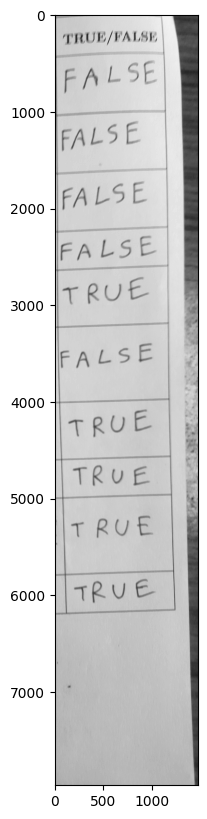

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(crop_image(imgs[0],arr[0]),cmap='gray')

688 354 807 354
929 958 1125 958
883 1564 989 1564
650 2170 759 2170
771 2570 978 2570
892 3168 1116 3168
934 3965 1038 3965
832 4565 929 4565
951 4966 1117 4966
1007 5766 1125 5764
832 6173 989 6171
Detected Lines: [array([[688, 354, 807, 354]], dtype=int32), array([[ 929,  958, 1125,  958]], dtype=int32), array([[ 883, 1564,  989, 1564]], dtype=int32), array([[ 650, 2170,  759, 2170]], dtype=int32), array([[ 771, 2570,  978, 2570]], dtype=int32), array([[ 892, 3168, 1116, 3168]], dtype=int32), array([[ 934, 3965, 1038, 3965]], dtype=int32), array([[ 832, 4565,  929, 4565]], dtype=int32), array([[ 951, 4966, 1117, 4966]], dtype=int32), array([[1007, 5766, 1125, 5764]], dtype=int32), array([[ 832, 6173,  989, 6171]], dtype=int32)]


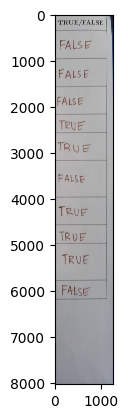

In [108]:
def detect_lines(image_path):
    """
    Detect lines in an image using Hough Line Transform.

    Args:
    - image_path: Path to the input image.

    Returns:
    - image_with_lines: The image annotated with detected lines.
    - lines: The list of detected lines.
    """
    # # Load the image
    # image = cv2.imread(image_path)
    image,org_image = blur_text_regions(image_path);

    # Check if the image is loaded properly
    if image is None:
        raise ValueError(f"Image not found or could not be loaded from {image_path}")

    # Convert the image to grayscale if it's not already
    if len(image.shape) == 3:  # Check if the image has 3 channels (color image)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image  # Image is already grayscale

    # Apply Canny edge detection
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)

    # Detect lines using Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=90, minLineLength=90, maxLineGap=10)

    # Copy the original image to draw lines on it
    image_with_lines = image.copy()

    # Draw the lines on the image
    horizontal_lines = []
    if lines is not None:
        for line in lines:

            x1, y1, x2, y2 = line[0]
            if x1>image.shape[1]//2:
                    angle = np.arctan2(y2 - y1, x2 - x1) * 180.0 / np.pi
                    # Consider lines with an angle close to 0 or 180 degrees as horizontal
                    if abs(angle) < 60 or abs(angle - 180) < 60:


                            horizontal_lines.append(line)

    horizontal_lines.sort(key=lambda line: line[0][1])

    # Filter out lines that are too close to each other
    filtered_horizontal_lines = []
    for i in range(len(horizontal_lines)):
        if i == 0:
            filtered_horizontal_lines.append(horizontal_lines[i])
        else:
            _, y1_prev, _, y2_prev = horizontal_lines[i - 1][0]
            _, y1_curr, _, y2_curr = horizontal_lines[i][0]
            if abs(y1_curr - y1_prev) >=200 and abs(y2_curr - y2_prev) >= 200:
                filtered_horizontal_lines.append(horizontal_lines[i])
    filtered_horizontal_lines=[i for i in filtered_horizontal_lines if (i[0][1]>100 and i[0][1]<7000)]
    # filtered_horizontal_lines=[i for i in filtered_horizontal_lines if i[0][1]>100]
    # Draw the filtered horizontal lines on the image
    for line in filtered_horizontal_lines:
        x1, y1, x2, y2 = line[0]
        print(x1,y1,x2,y2)
        cv2.line(image_with_lines, (x1, y1), (x2, y2), (0, 255, 0), 3)
    # plt.figure(figsize=(10,10))
    # plt.imshow(image_with_lines)
    # plt.show()

    return org_image, filtered_horizontal_lines



image_with_lines, lines = detect_lines(arr[23])

# Display the image with lines


plt.imshow( image_with_lines)


print(f"Detected Lines: {lines}")

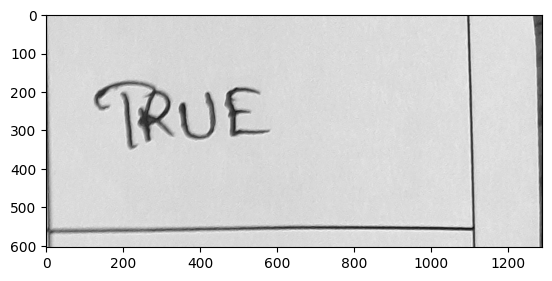

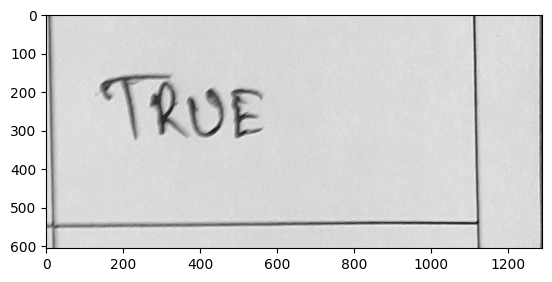

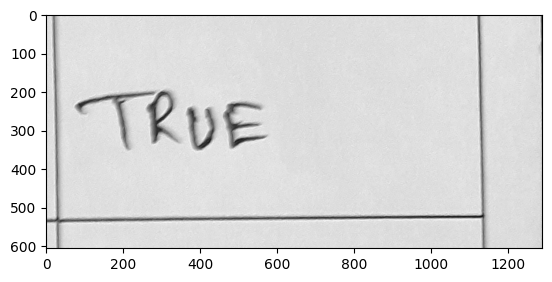

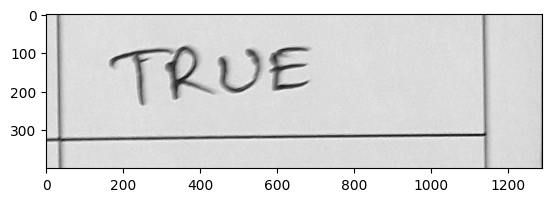

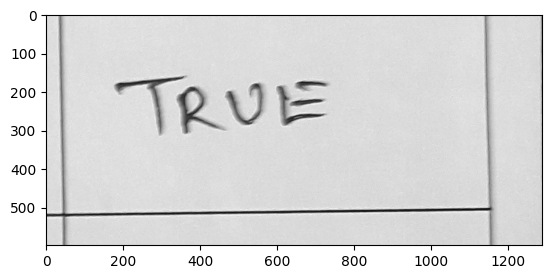

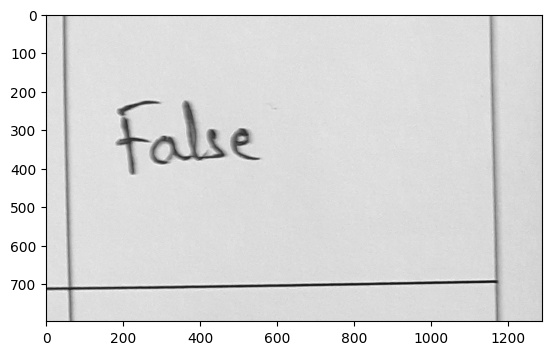

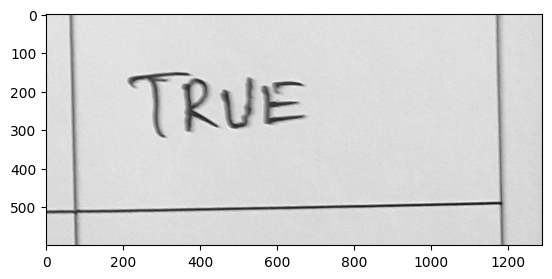

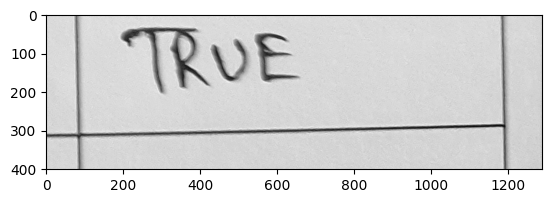

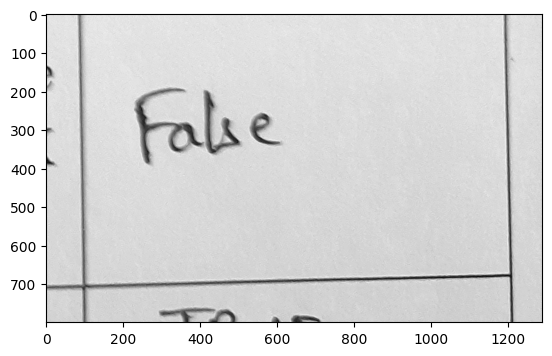

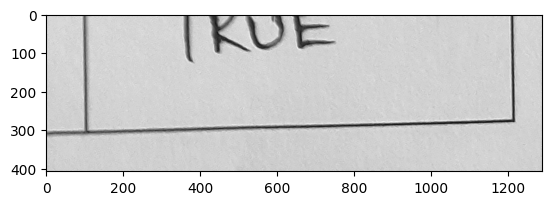

Detected Lines: [array([[688, 354, 807, 354]], dtype=int32), array([[ 929,  958, 1125,  958]], dtype=int32), array([[ 883, 1564,  989, 1564]], dtype=int32), array([[ 650, 2170,  759, 2170]], dtype=int32), array([[ 771, 2570,  978, 2570]], dtype=int32), array([[ 892, 3168, 1116, 3168]], dtype=int32), array([[ 934, 3965, 1038, 3965]], dtype=int32), array([[ 832, 4565,  929, 4565]], dtype=int32), array([[ 951, 4966, 1117, 4966]], dtype=int32), array([[1007, 5766, 1125, 5764]], dtype=int32), array([[ 832, 6173,  989, 6171]], dtype=int32)]


In [43]:
def divide_image_into_parts(image, lines):
    """
    Divide the image into 10 parts using the provided lines.

    Args:
    - image: The input image.
    - lines: The list of line coordinates.

    Returns:
    - divided_images: List of 10 image parts.
    """
    lines.sort(key=lambda line: line[0][1])  # Ensure lines are sorted by their y-coordinates

    divided_images = []
    height, width = image.shape[:2]

    # Add the top and bottom boundaries of the image to the lines
    all_y_coords =  [line[0][1] for line in lines]

    # Extract 10 parts of the image based on the y-coordinates
    for i in range(len(all_y_coords) - 1):
        y1 = all_y_coords[i]
        y2 = all_y_coords[i + 1]
        part = image[y1:y2, :]
        divided_images.append(part)

    return divided_images



# # Detect lines and get the annotated image with lines
# image_with_lines, lines = detect_lines()

# Divide the image into 10 parts
divided_images = divide_image_into_parts(crop_image(imgs[1],arr[1]), lines)

# Display the divided parts
for i, part in enumerate(divided_images):
    plt.figure()
    plt.imshow(part,cmap='gray')
    # plt.title(f"Part {i+1}")
    plt.show()

print(f"Detected Lines: {lines}")

In [51]:

def get_cropped_images(image_path):
    org_image,lines=detect_lines(image_path)
    org_image=preprocess_image(org_image.copy())
    divided_images=divide_image_into_parts(org_image,lines)
    texts=[]
    for img in divided_images:
        results = reader.readtext(img)
        i=0;
        for bbox,text,score in results:
            if(len(text)==0):
              continue
            if(i!=0):
                break
            if text[0]=='T' or text[0]=='t':
                i+=1;
                texts.append('True')
            elif text[0]=='F' or text[0]=='f':
                i+=1;
                texts.append('False')
        if(i==0):
            texts.append("nan")
    texts=np.array(texts)
    for i, part in enumerate(divided_images):
        plt.figure()
        plt.imshow(part,cmap='gray')
        plt.title(f"{texts[i]}")
        plt.show()
    return divided_images,texts




630 471 735 473
836 1104 948 1104
811 2401 907 2399
904 2834 1054 2834
1015 3482 1135 3480
629 4349 816 4349
405 4993 500 4994
493 5433 660 5436
426 6284 558 6286
454 6721 603 6723


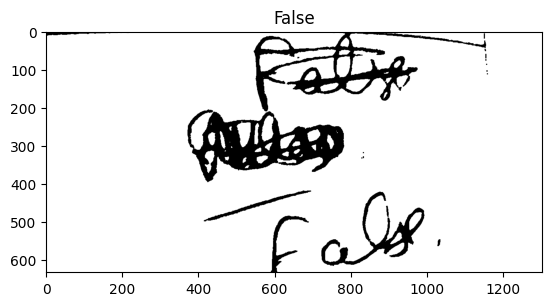

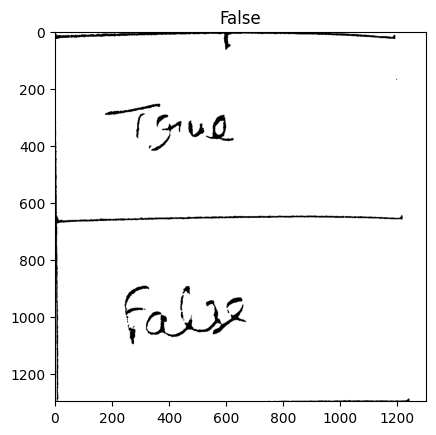

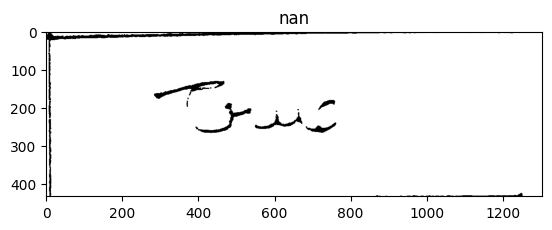

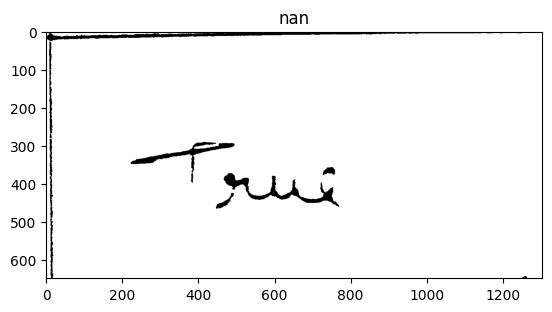

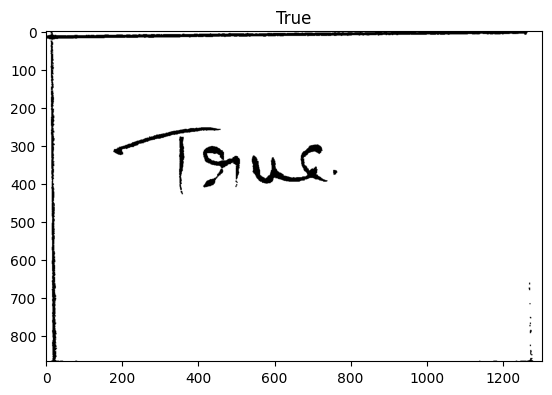

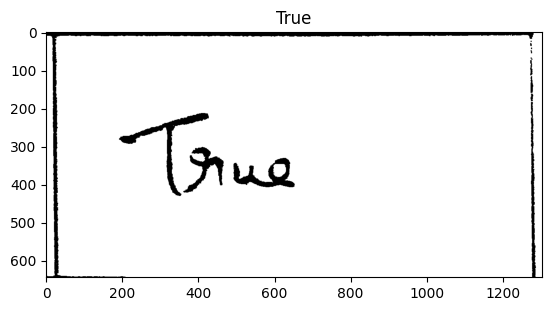

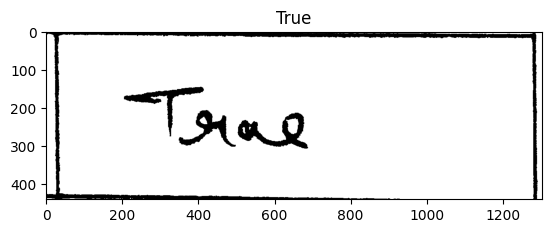

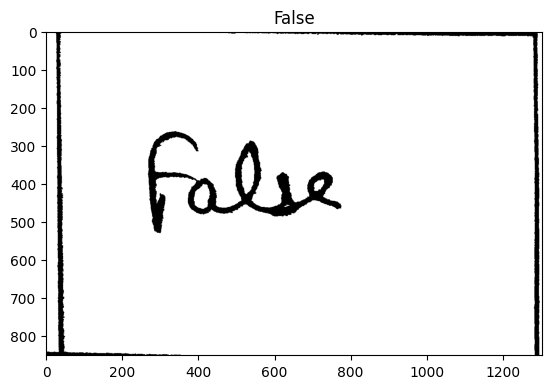

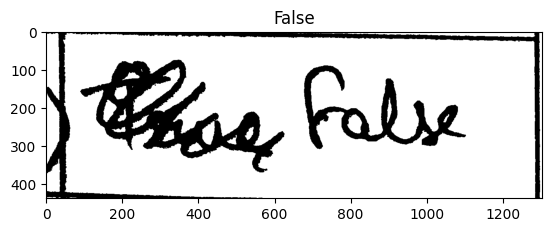

([array([[255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         [  0,   0,   0, ..., 255, 255, 255],
         ...,
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
  array([[255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         ...,
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
  array([[255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         ...,
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
  array([[255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255,

In [54]:
get_cropped_images("/content/drive/MyDrive/Sample_Data/20240328_151342.jpg")

/content/drive/MyDrive/Sample_Data/20240328_145219.jpg
667 366 791 366
683 968 780 966
652 1586 750 1582
1077 2172 1196 2168
1030 2579 1167 2575
966 3187 1186 3180
1151 3987 1249 3984
834 4597 947 4596
765 4997 886 4997
416 5791 507 5791
466 6184 657 6187


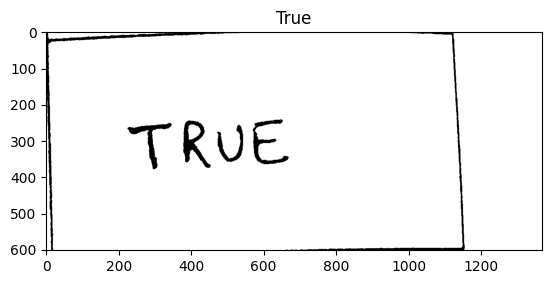

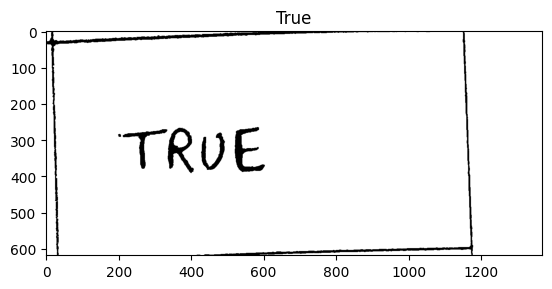

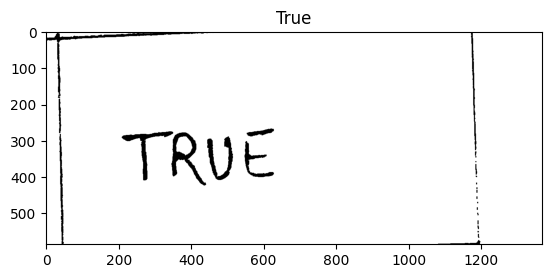

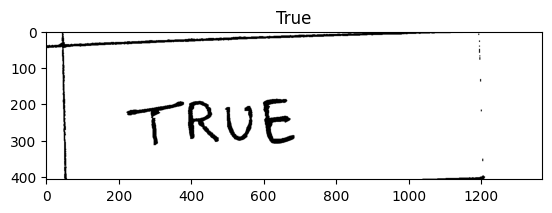

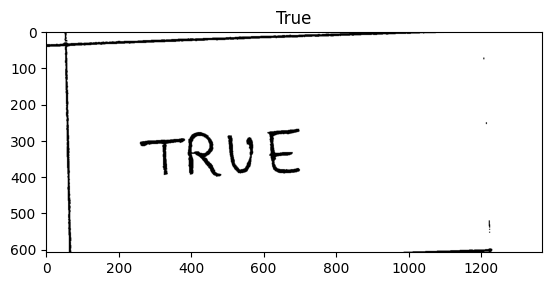

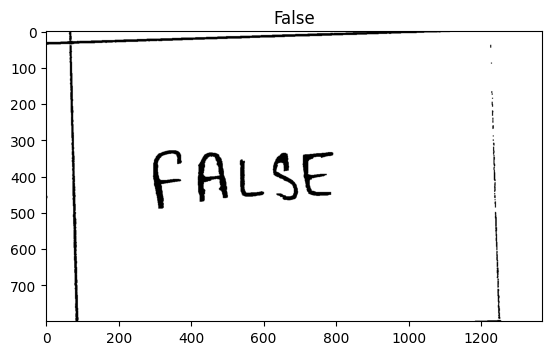

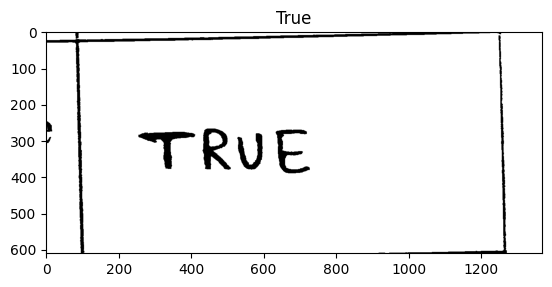

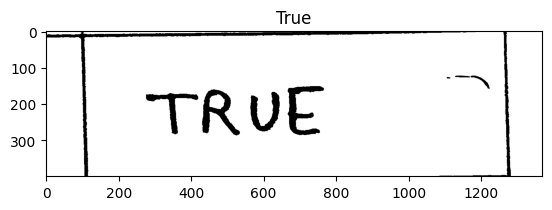

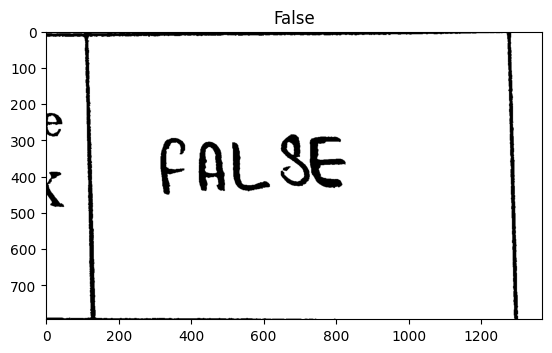

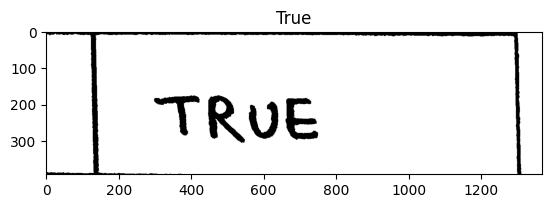

/content/drive/MyDrive/Sample_Data/20240328_152349.jpg
689 315 812 315
698 904 914 904
739 1494 830 1493
701 2090 803 2088
797 2484 934 2482
807 3077 940 3075
920 3863 1100 3860
974 4463 1110 4461
930 4855 1059 4853
903 5649 1050 5644
851 6050 943 6047


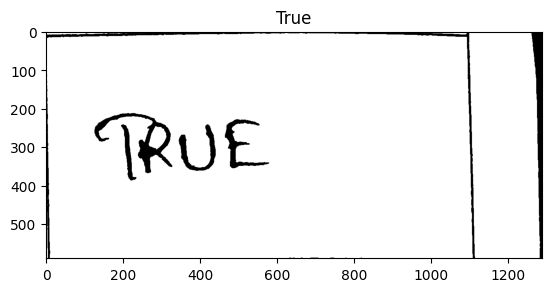

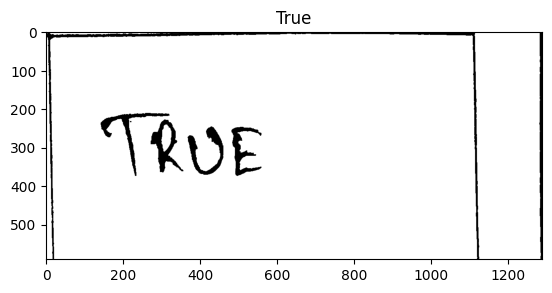

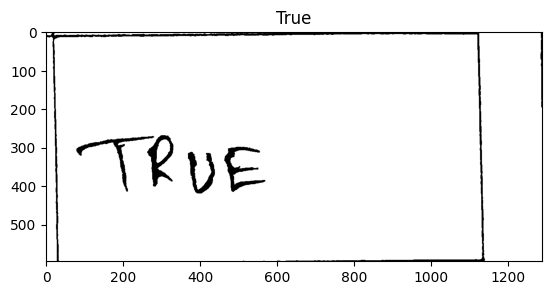

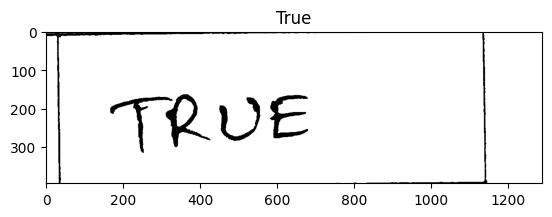

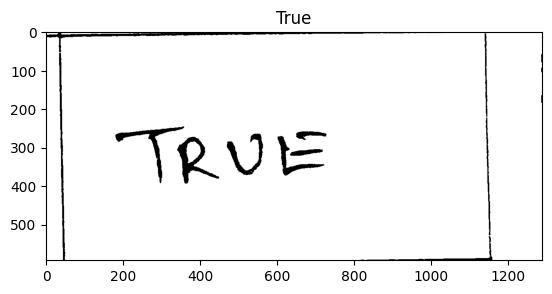

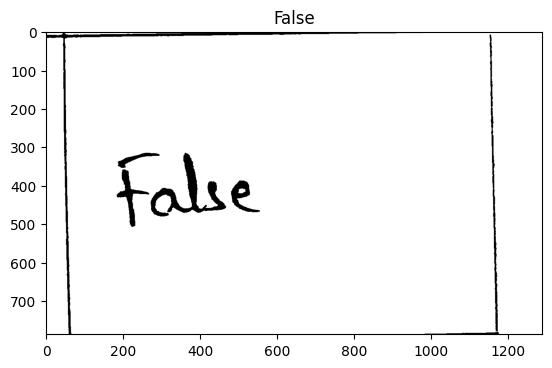

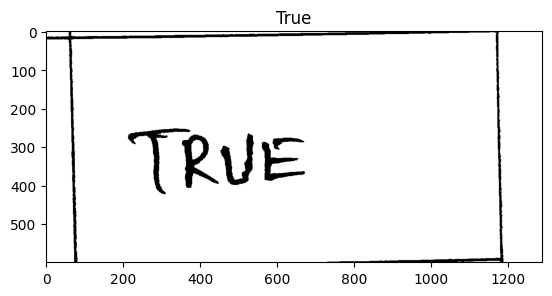

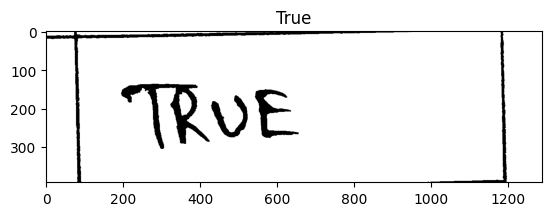

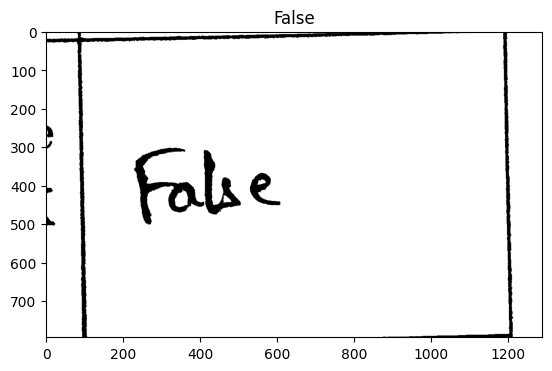

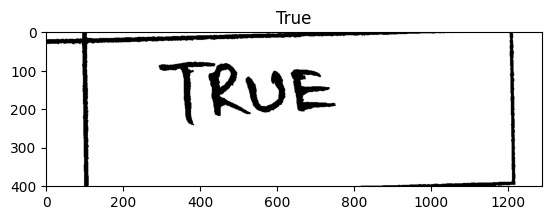

/content/drive/MyDrive/Sample_Data/20240328_151046.jpg
1019 420 1131 420
862 1045 996 1043
1039 1663 1138 1663
677 2283 779 2282
688 2690 785 2690
897 3306 988 3306
714 4123 855 4123
959 4735 1140 4735
771 5145 883 5145
717 5958 830 5958
859 6370 989 6370


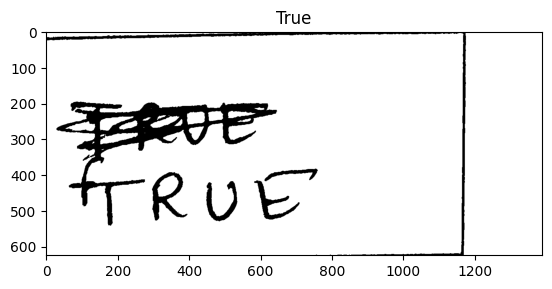

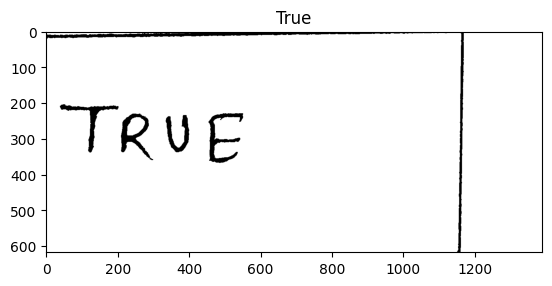

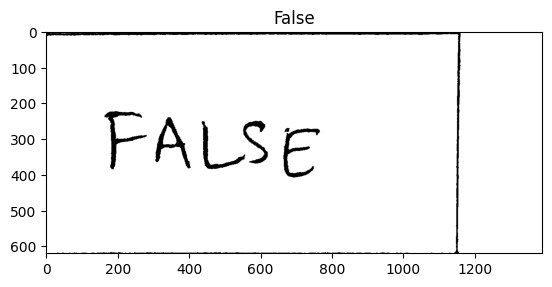

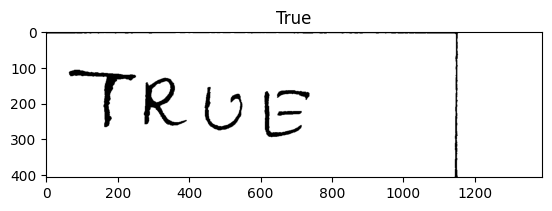

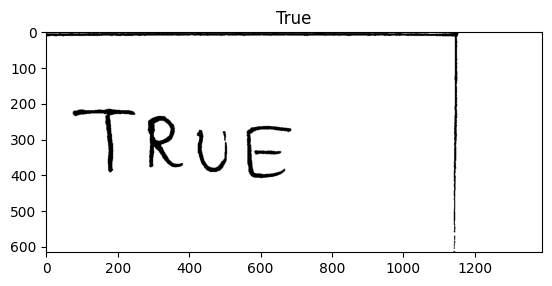

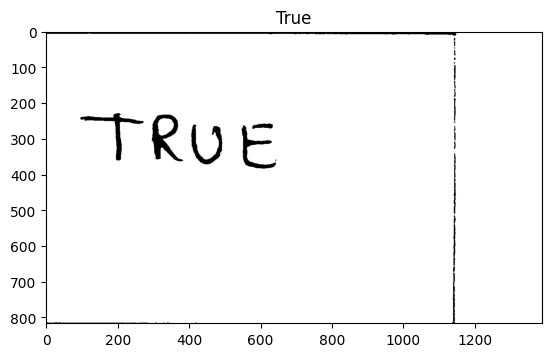

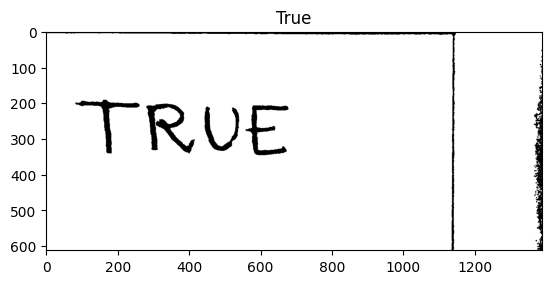

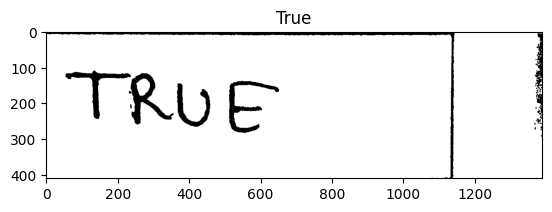

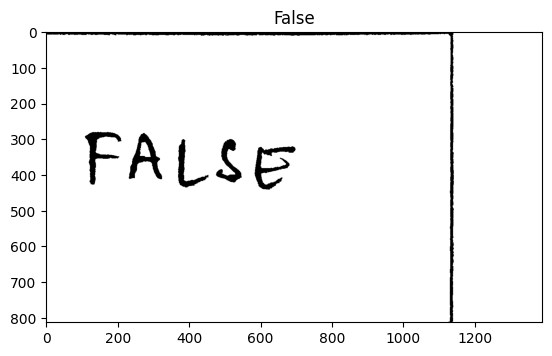

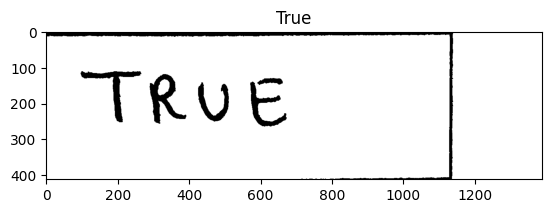

/content/drive/MyDrive/Sample_Data/20240328_155745.jpg
3916 341 4019 351
3817 986 3978 984
3705 1641 3809 1636
3939 2276 4087 2271
3884 2704 4033 2699
4096 3328 4209 3325
4015 4156 4158 4154
3334 4782 3553 4782
2187 5195 2283 5195
863 6014 963 6014
1095 6415 1190 6417


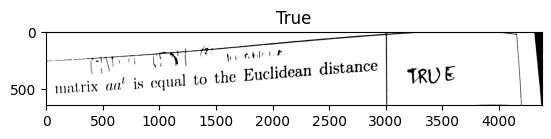

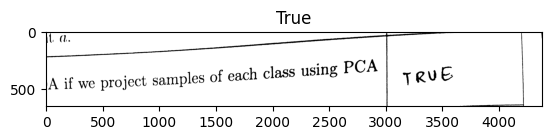

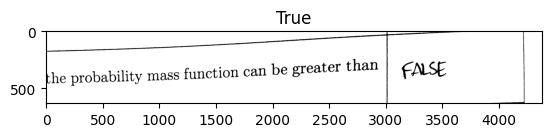

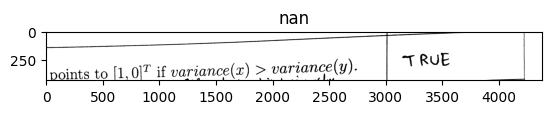

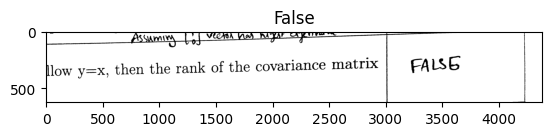

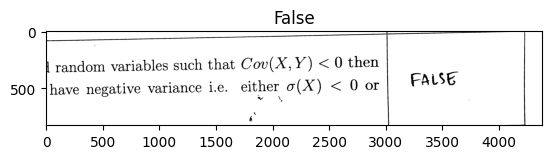

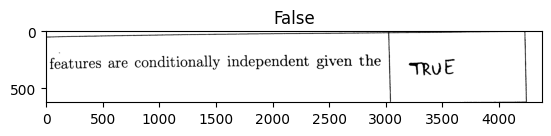

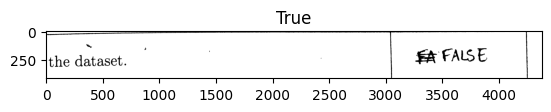

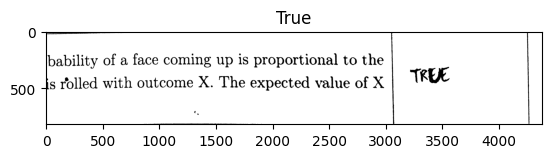

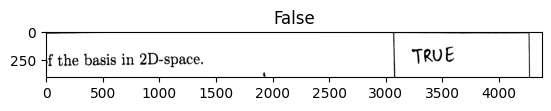

/content/drive/MyDrive/Sample_Data/20240328_153456.jpg
901 366 1029 359
1047 964 1143 959
1055 1572 1148 1571
1012 2164 1138 2164
1014 2564 1132 2564
820 3162 915 3162
980 3955 1072 3953
949 4552 1066 4550
642 4803 766 4794
998 5749 1115 5747
800 6152 891 6151


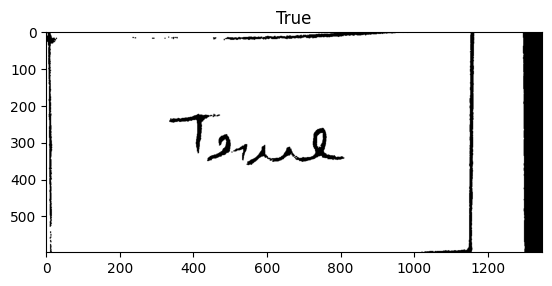

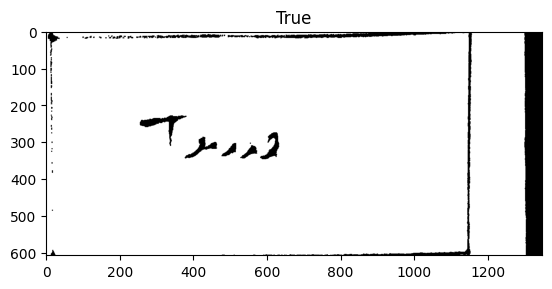

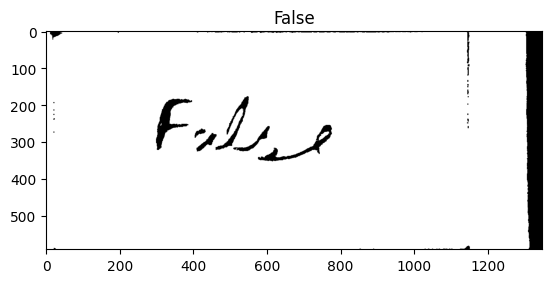

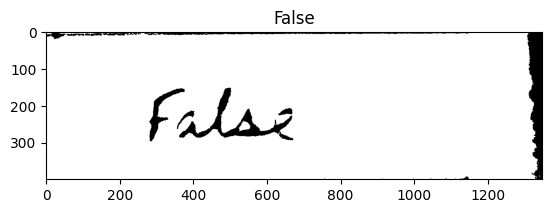

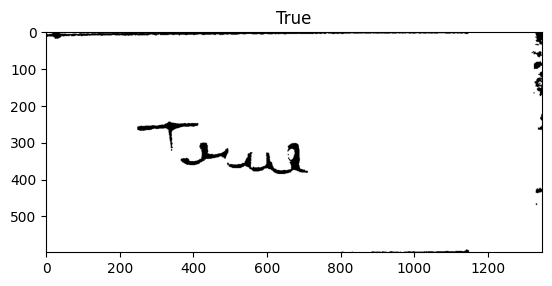

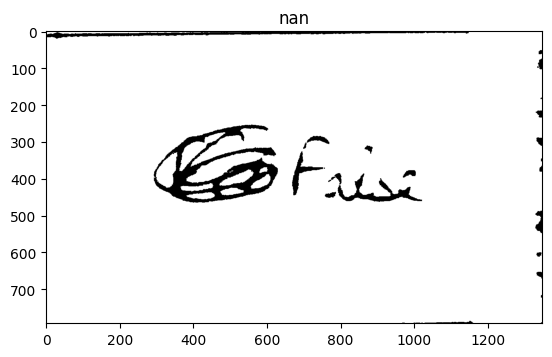

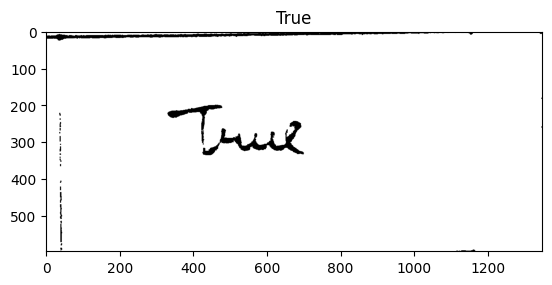

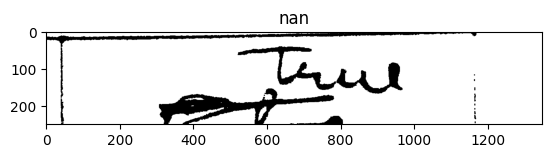

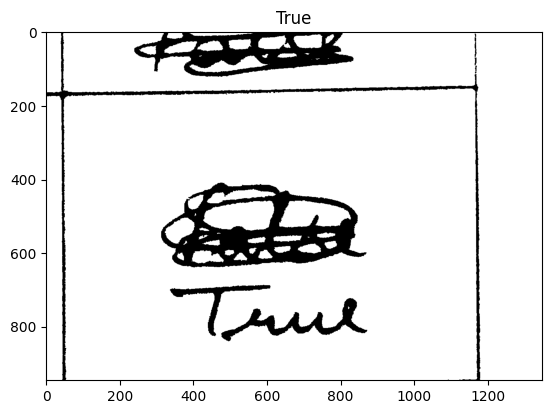

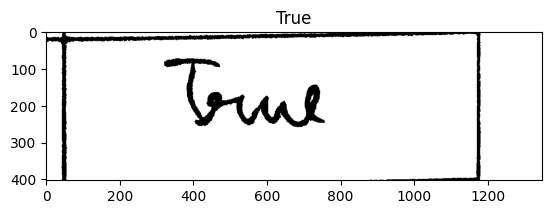

/content/drive/MyDrive/Sample_Data/20240328_153252.jpg
540 2609 687 2609
/content/drive/MyDrive/Sample_Data/20240328_151122.jpg
951 404 1064 403
546 992 672 992
744 1588 846 1588
419 2179 518 2180
607 2575 886 2575
853 3169 1139 3169
493 3960 701 3960
884 4558 1138 4558
789 4959 927 4959
652 5752 750 5752
947 6152 1055 6152


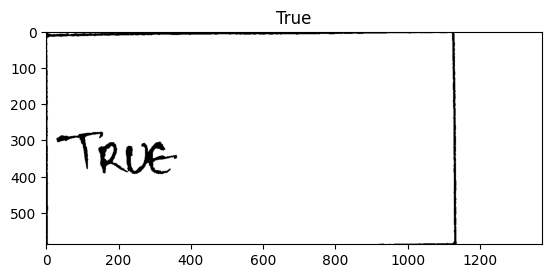

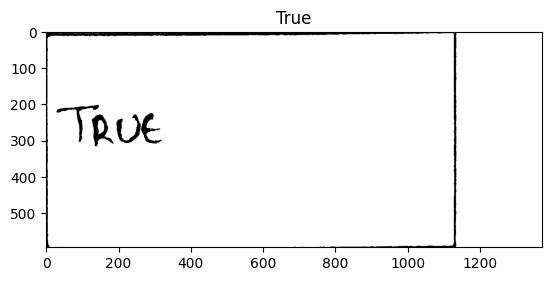

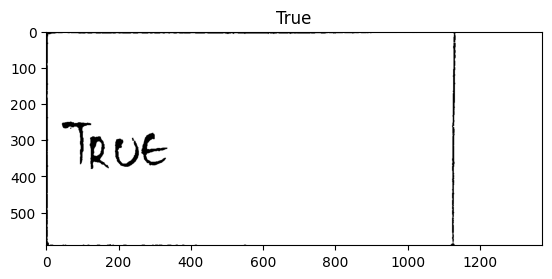

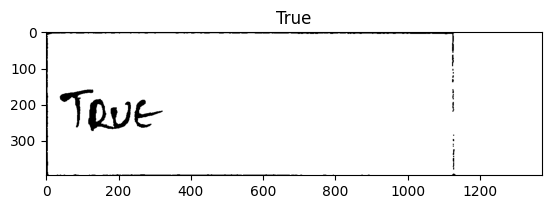

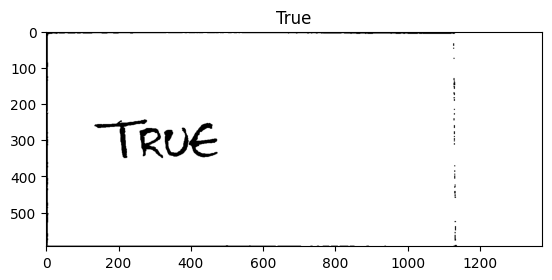

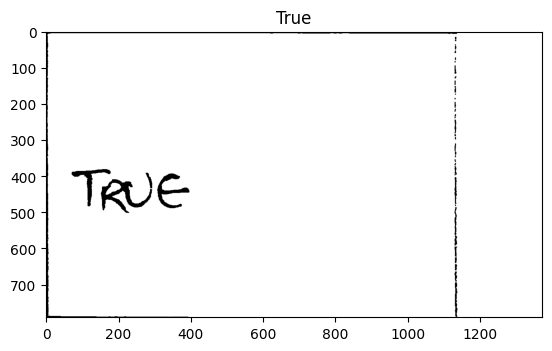

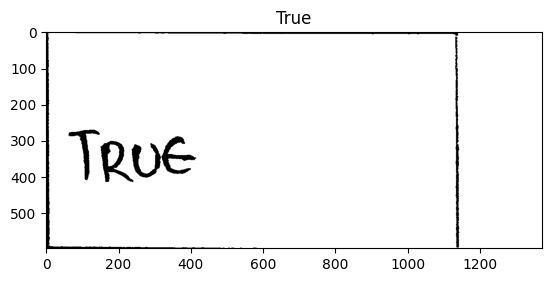

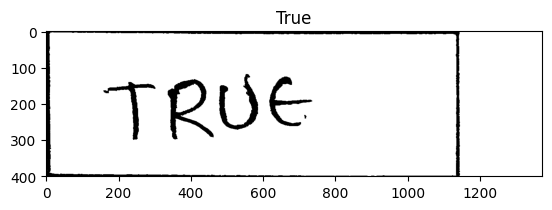

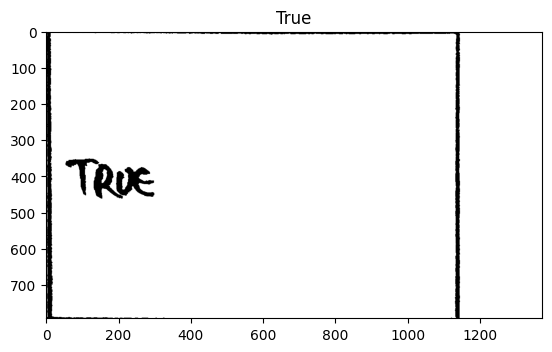

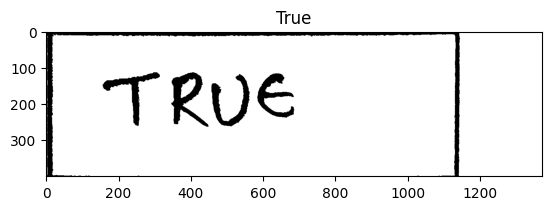

/content/drive/MyDrive/Sample_Data/20240328_153522.jpg
996 355 1105 353
951 936 1063 932
1012 1526 1135 1524
566 2119 666 2117
878 2503 968 2500
852 3094 949 3090
1008 3884 1104 3882
745 4475 998 4467
1076 4866 1166 4862
578 5644 845 5644
1103 6046 1244 6041


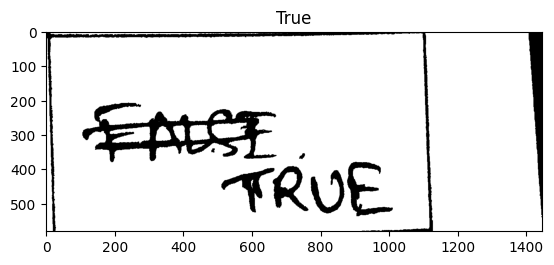

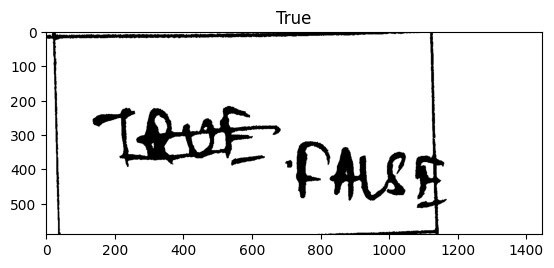

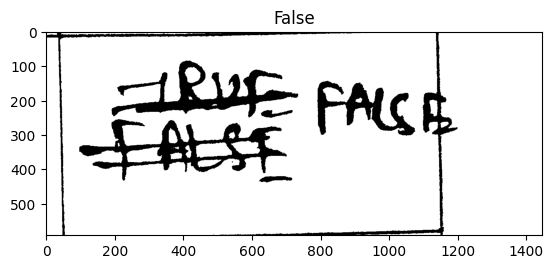

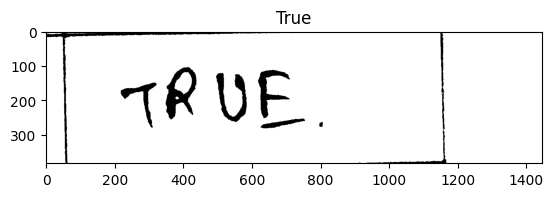

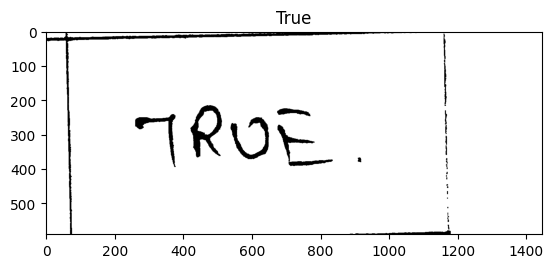

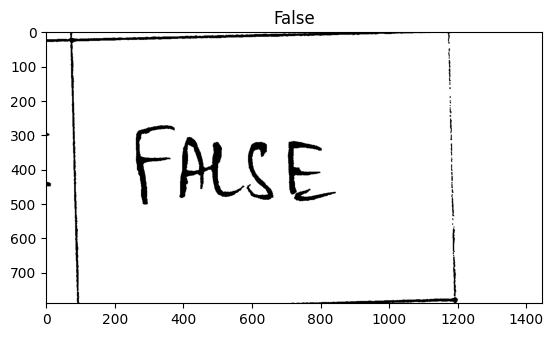

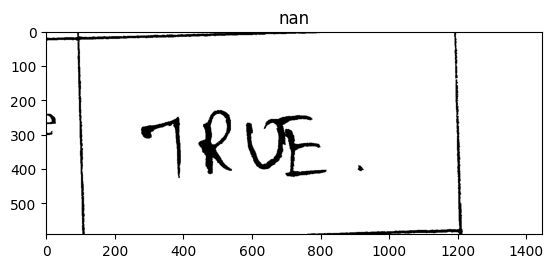

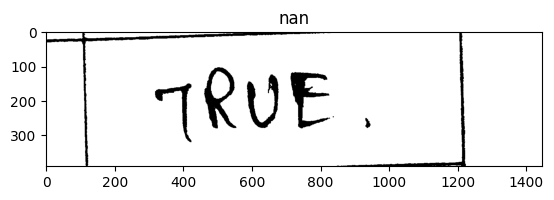

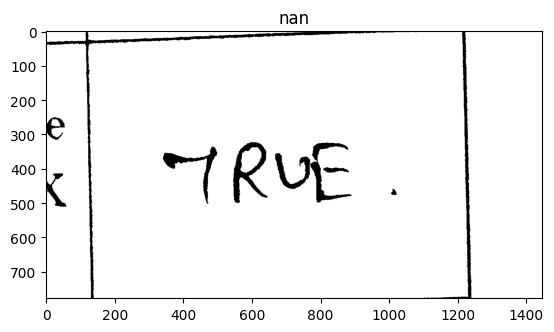

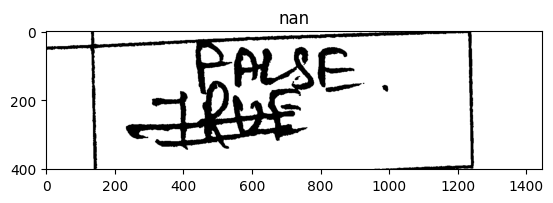

/content/drive/MyDrive/Sample_Data/20240328_150204.jpg
669 385 855 378
776 919 889 917
904 1991 1053 1991
827 2355 927 2354
925 2892 1054 2890
809 3619 938 3617
869 4164 982 4163
912 4529 1005 4528
754 5264 980 5260
946 5629 1106 5626


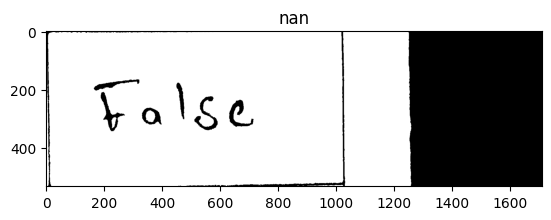

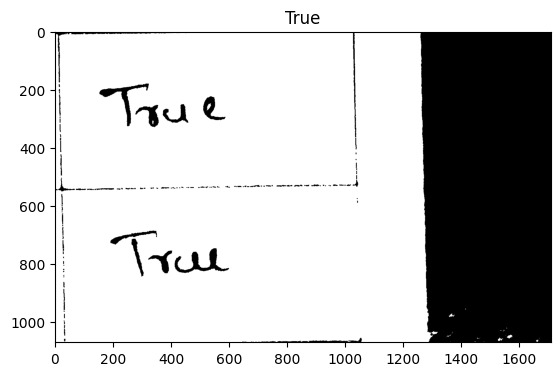

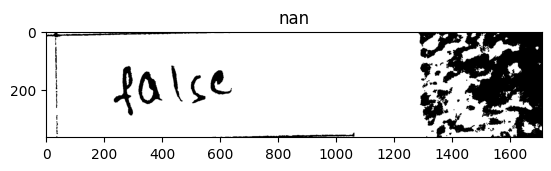

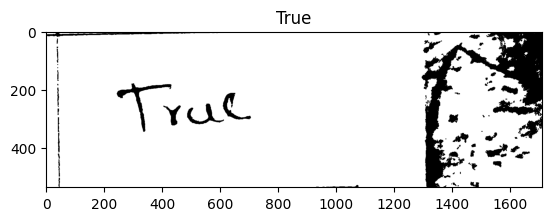

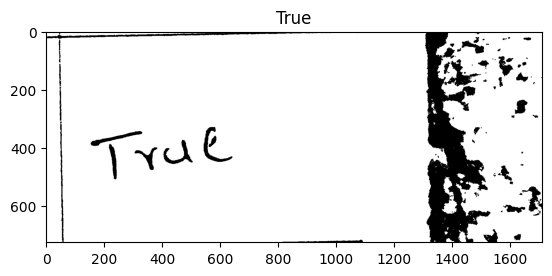

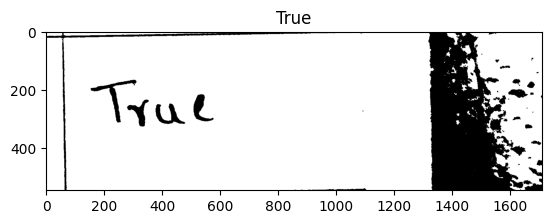

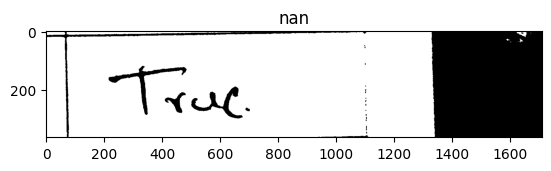

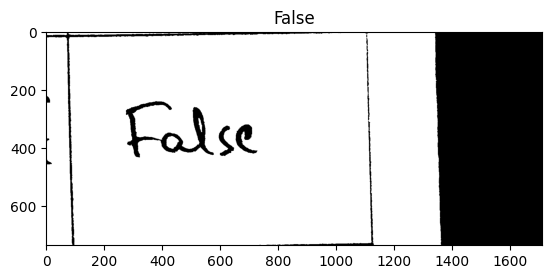

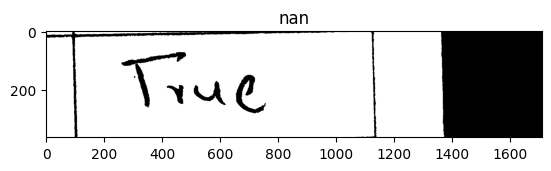

/content/drive/MyDrive/Sample_Data/20240328_152515.jpg
699 474 808 486
567 1081 665 1081
517 1704 629 1706
571 2319 683 2321
630 2726 727 2728
498 3328 688 3331
765 4116 952 4119
430 4706 525 4708
663 5107 758 5108
778 5904 890 5905
437 6300 578 6300


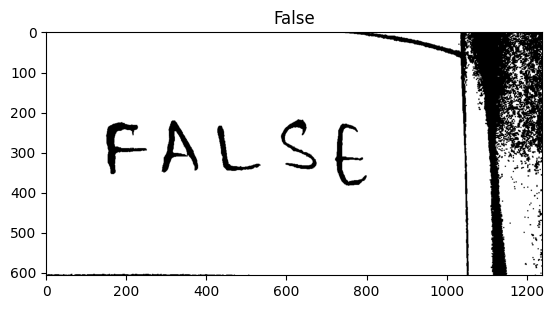

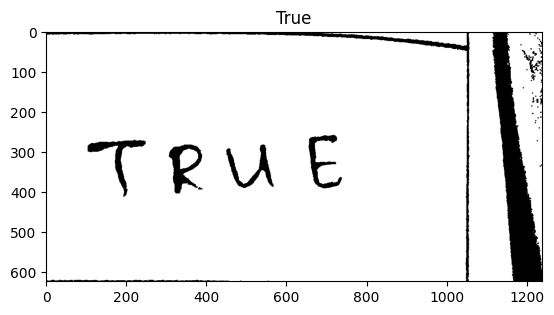

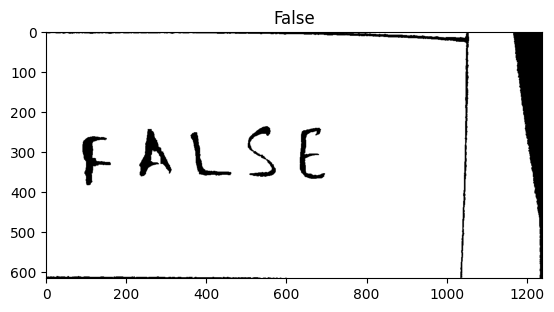

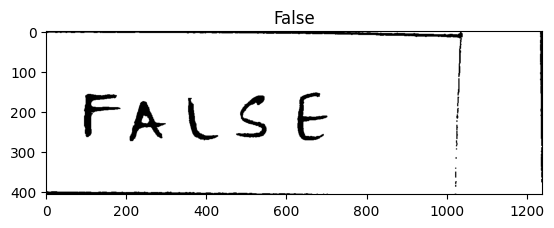

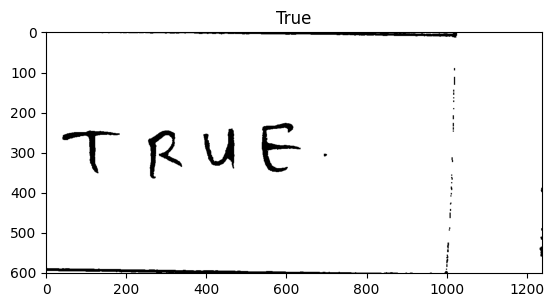

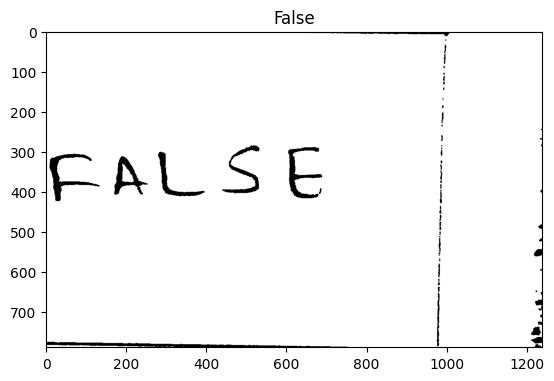

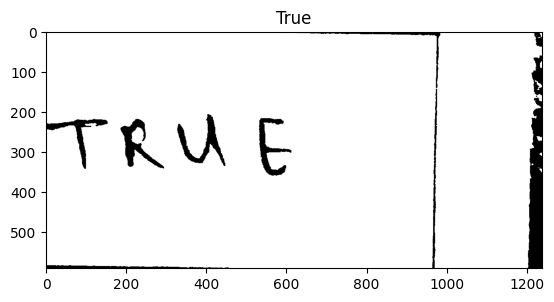

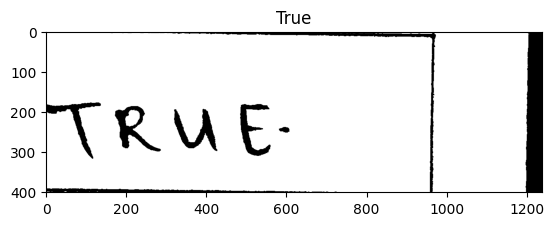

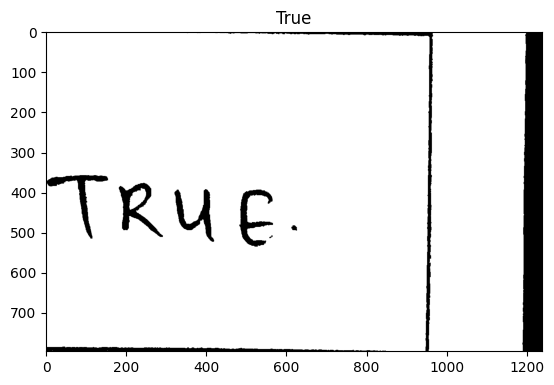

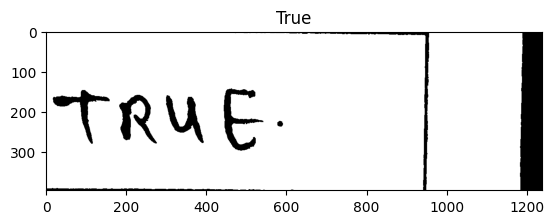

/content/drive/MyDrive/Sample_Data/20240328_154601.jpg
975 337 1106 330
954 918 1071 912
975 1493 1098 1489
852 2067 1010 2064
849 2444 960 2443
828 3007 954 3007
928 3752 1078 3752
746 4318 955 4318
411 4686 502 4686
898 5425 1005 5423
927 5799 1073 5796


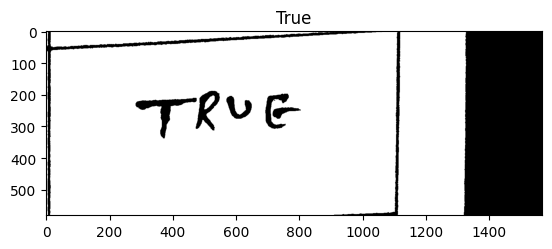

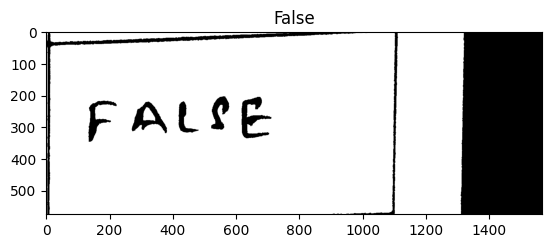

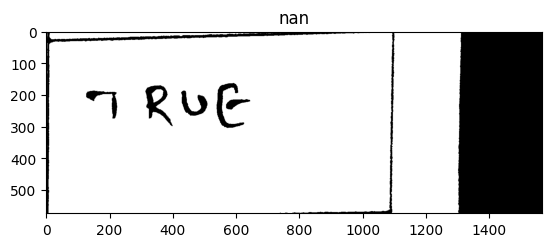

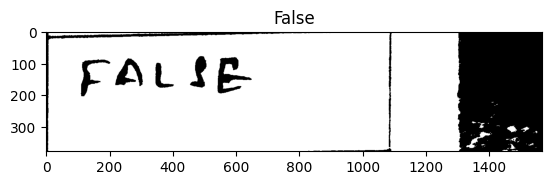

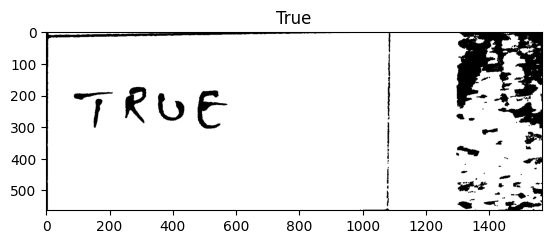

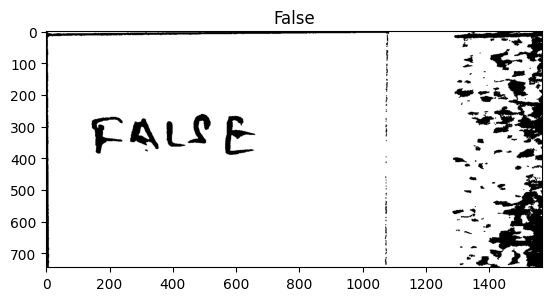

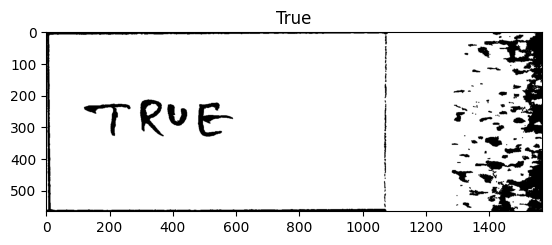

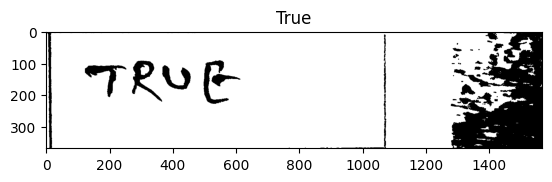

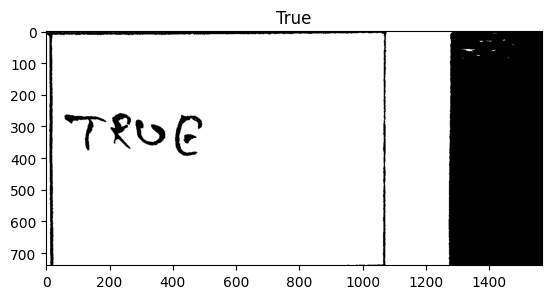

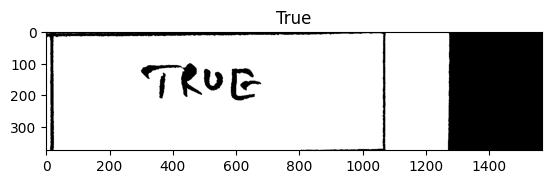

/content/drive/MyDrive/Sample_Data/20240328_150414.jpg
767 376 907 376
844 953 944 952
856 1535 950 1533
783 2112 983 2112
528 2499 628 2497
869 3067 967 3067
737 3826 949 3826
444 4399 649 4399
730 4778 858 4778
758 5539 867 5535
798 5926 891 5923


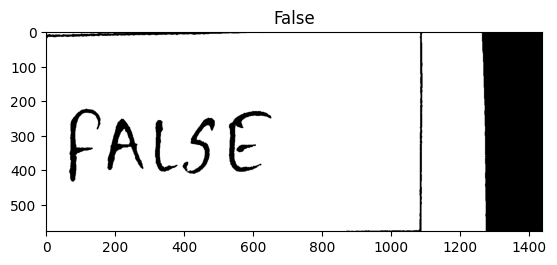

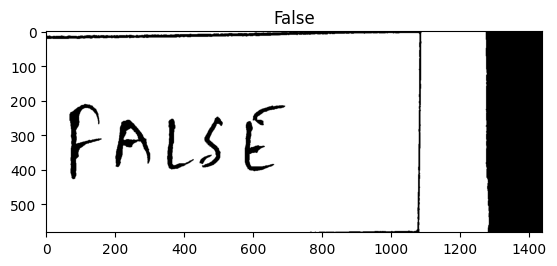

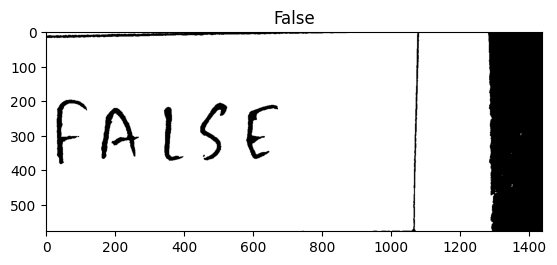

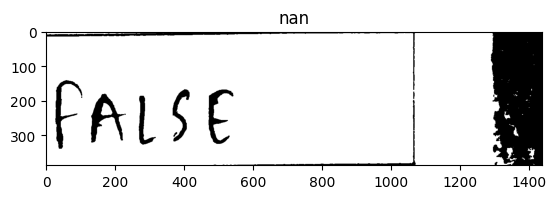

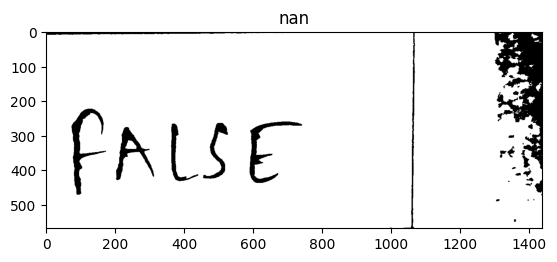

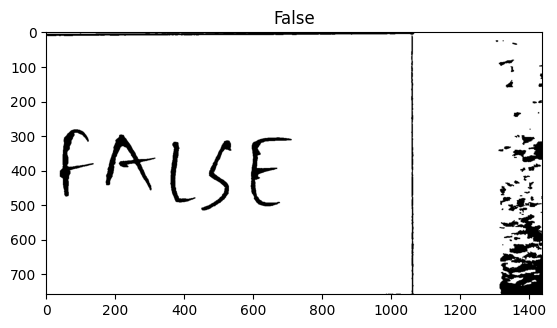

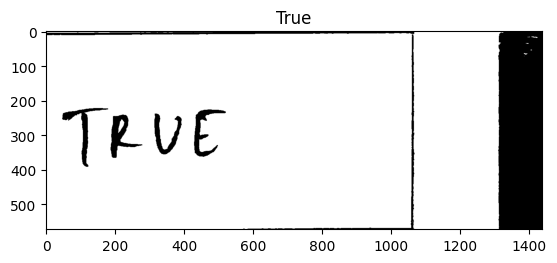

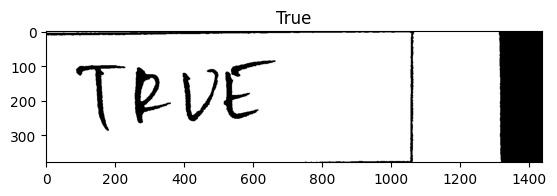

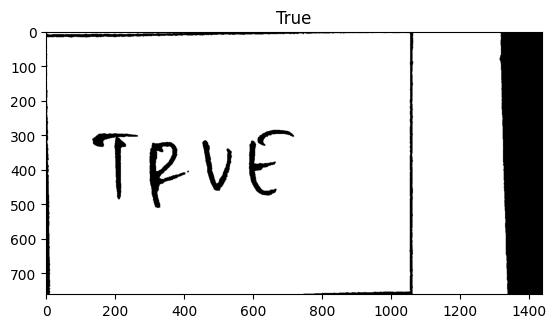

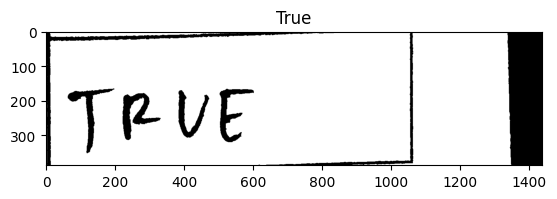

output12.jpg
1010 366 1102 363
968 949 1121 947
889 1537 991 1534
886 2118 1112 2110
1089 2503 1180 2499
970 3090 1164 3083
1102 3860 1199 3857
888 4450 981 4447
925 4848 1218 4837
1086 5625 1300 5618
1149 6012 1262 6006


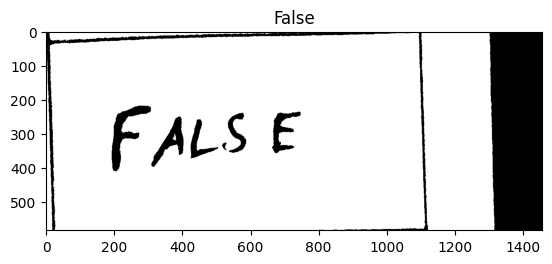

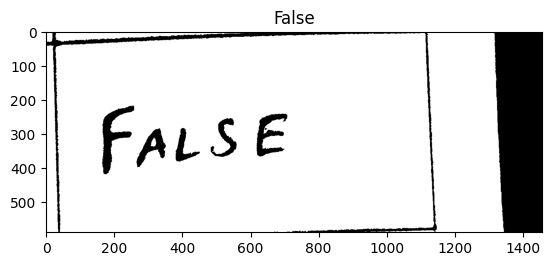

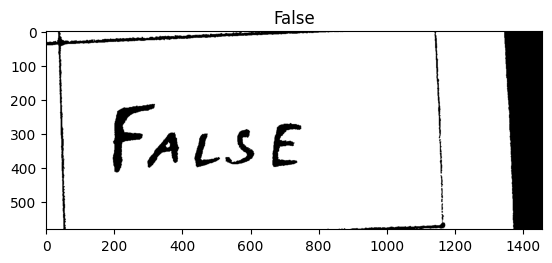

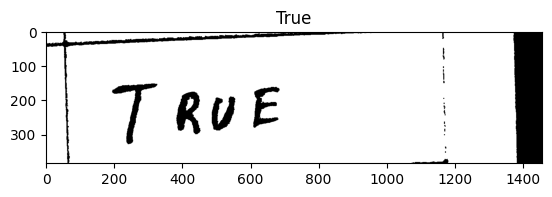

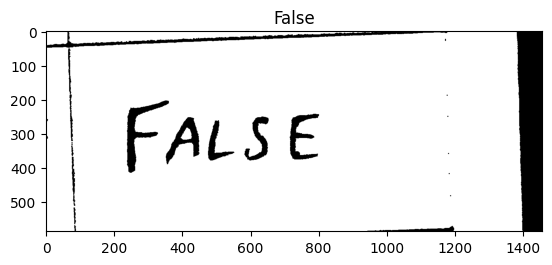

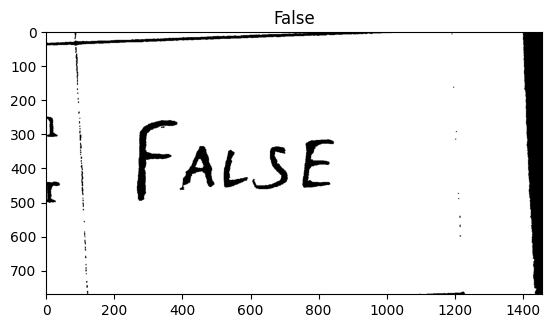

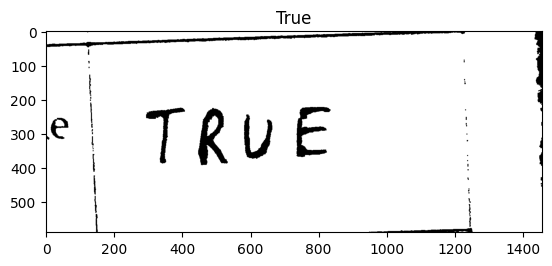

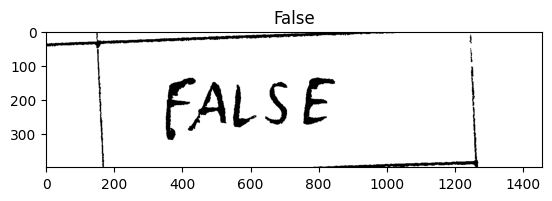

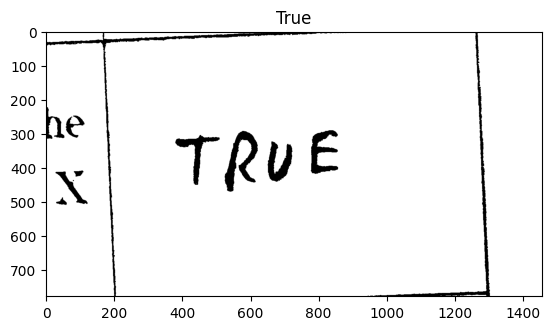

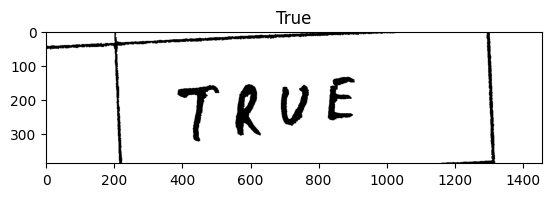

/content/drive/MyDrive/Sample_Data/20240328_151020.jpg
991 363 1087 360
908 1010 1126 1002
807 1645 964 1643
926 2264 1116 2261
942 2675 1114 2672
648 3286 781 3284
475 4090 573 4090
508 4695 607 4695
882 5099 1003 5097
473 5910 650 5907
1050 6309 1153 6307


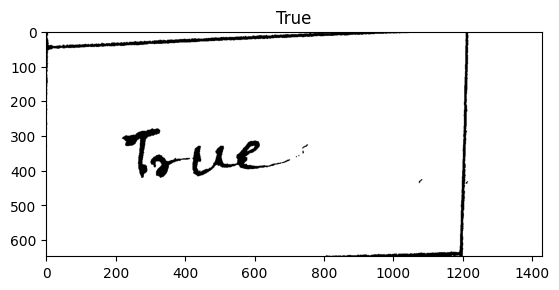

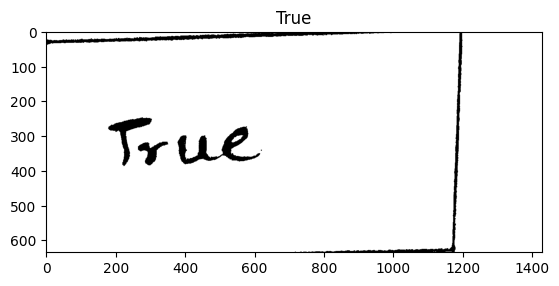

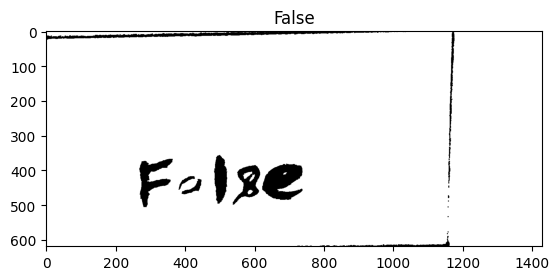

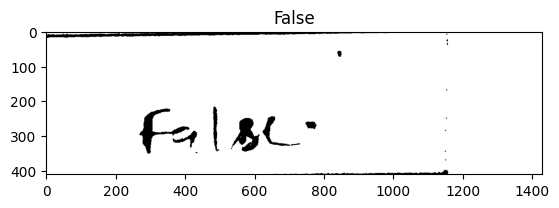

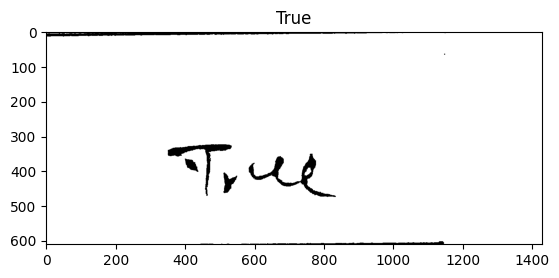

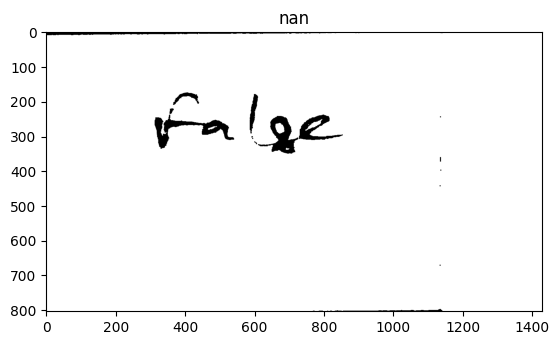

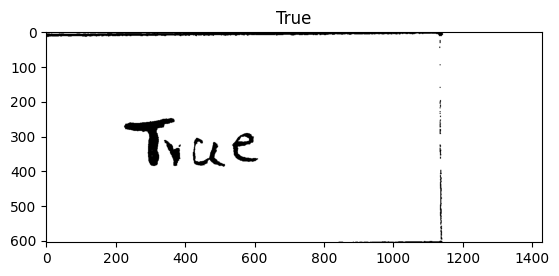

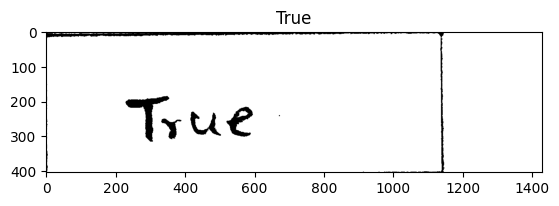

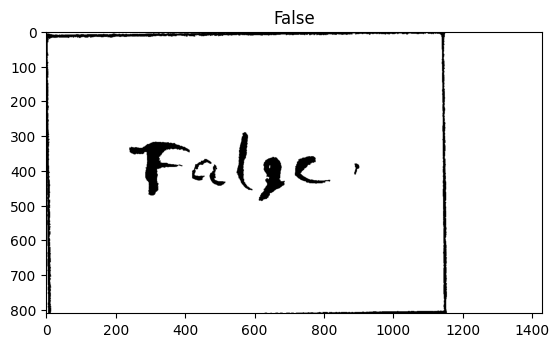

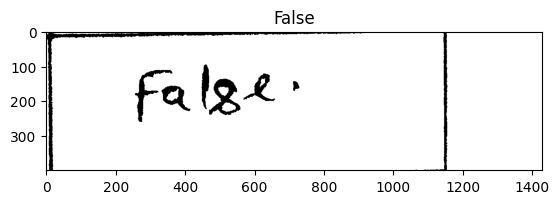

/content/drive/MyDrive/Sample_Data/20240328_155246.jpg
859 247 966 243
612 833 717 828
655 1402 760 1397
950 1963 1062 1959
976 2349 1075 2346
946 2925 1068 2923
762 3680 987 3676
929 4253 1044 4251
750 4633 901 4630
660 5401 906 5397
755 5793 857 5791


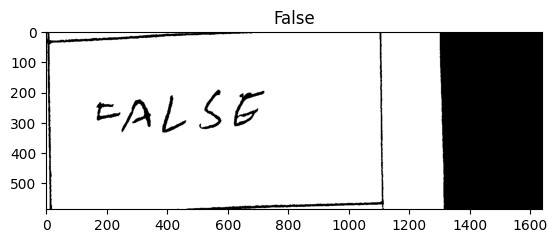

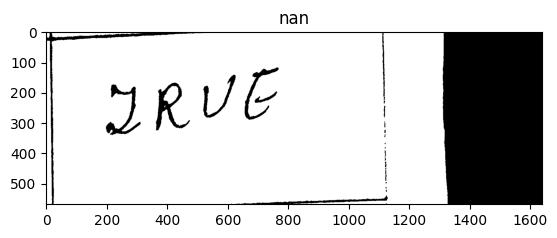

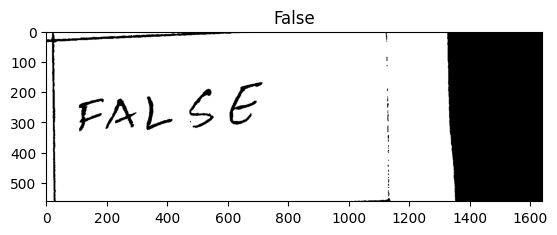

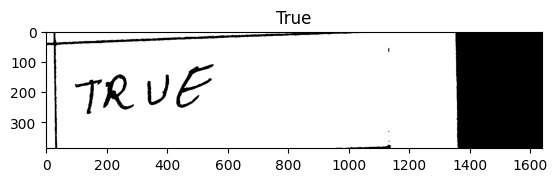

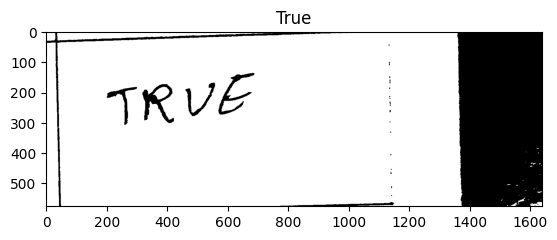

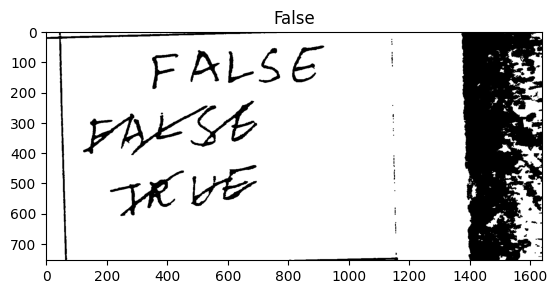

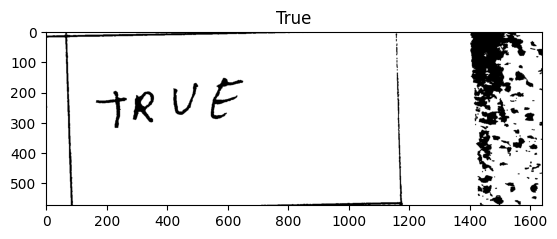

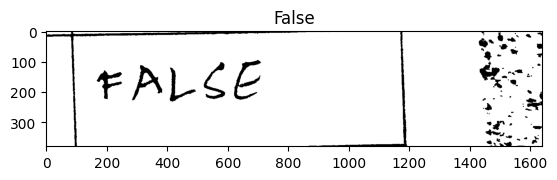

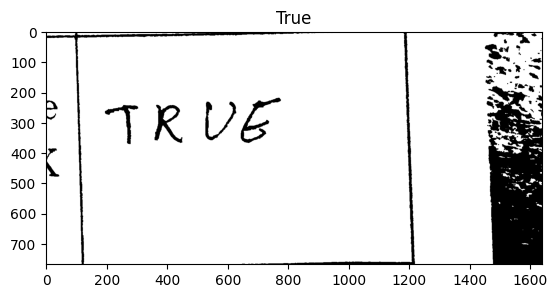

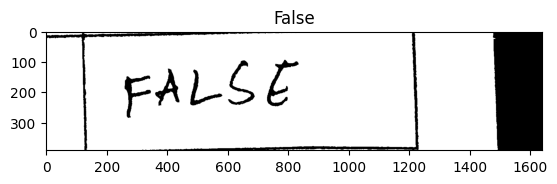

/content/drive/MyDrive/Sample_Data/20240328_151342.jpg
630 471 735 473
836 1104 948 1104
811 2401 907 2399
904 2834 1054 2834
1015 3482 1135 3480
629 4349 816 4349
405 4993 500 4994
493 5433 660 5436
426 6284 558 6286
454 6721 603 6723


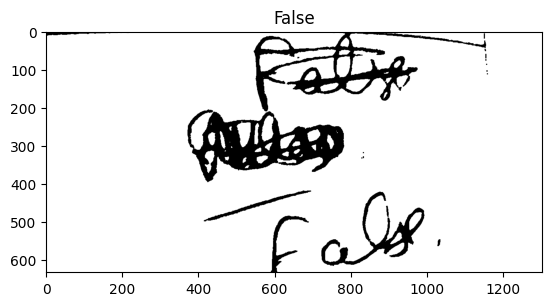

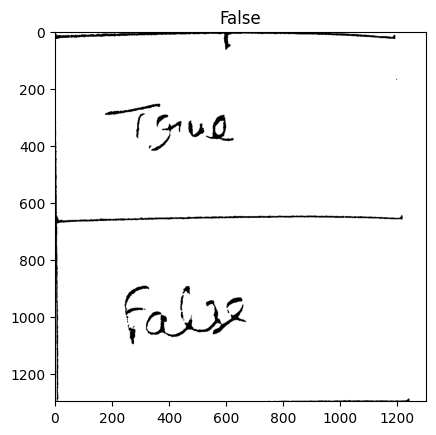

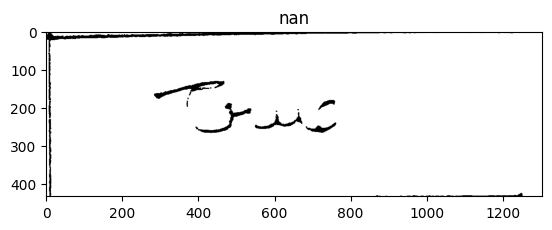

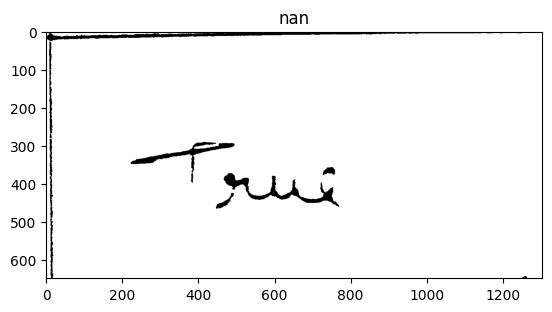

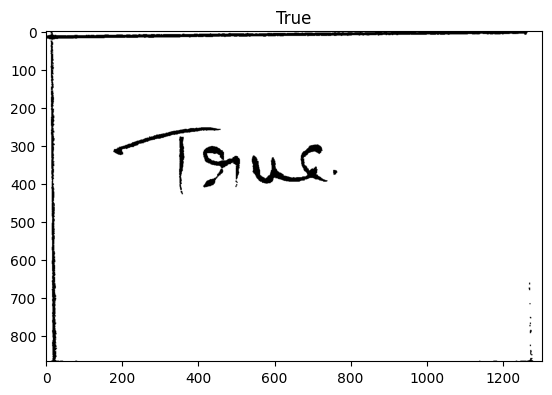

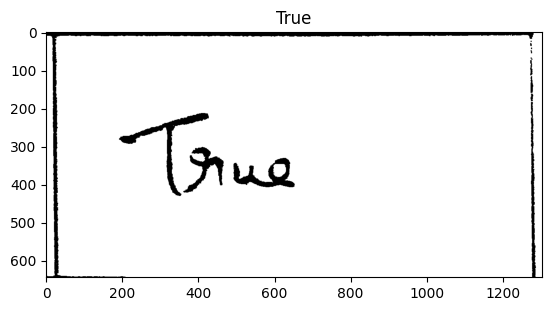

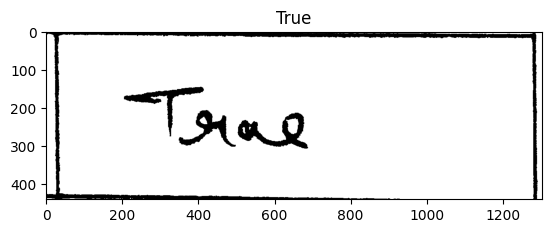

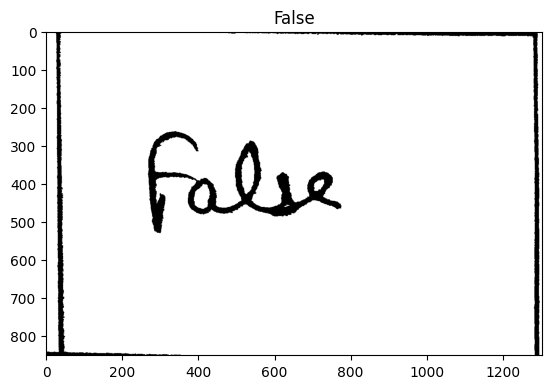

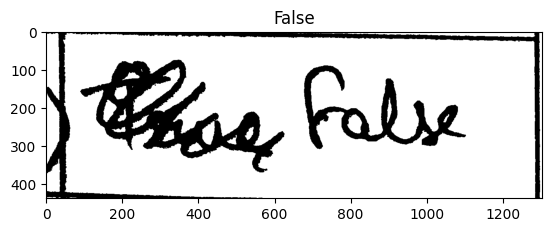

/content/drive/MyDrive/Sample_Data/20240328_154830.jpg
890 421 1046 416
901 1031 993 1029
1020 1642 1118 1641
902 2256 1020 2256
469 2668 562 2666
859 3274 965 3272
622 4072 743 4070
913 4662 1004 4661
712 5071 857 5069
963 5849 1060 5848
816 6255 912 6253


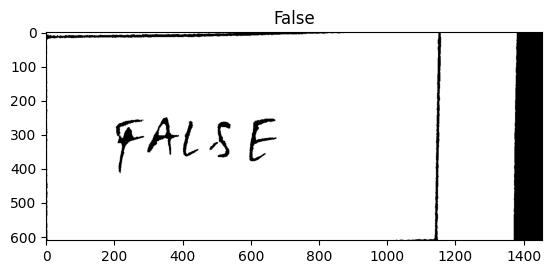

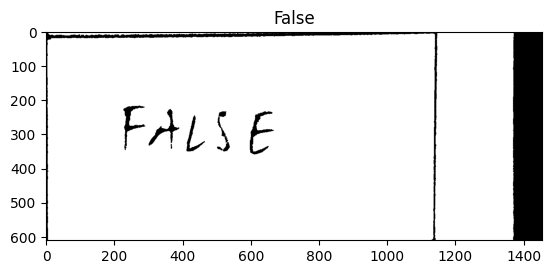

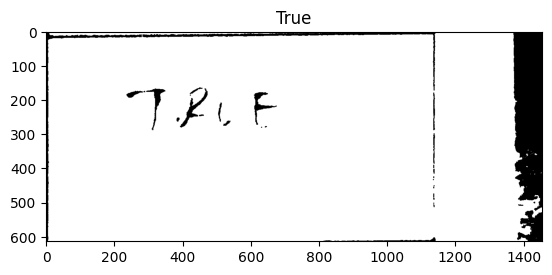

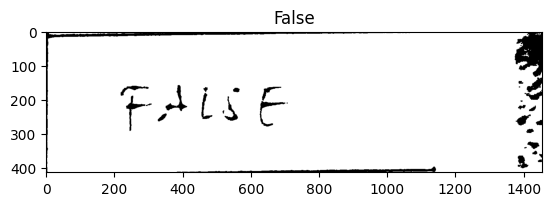

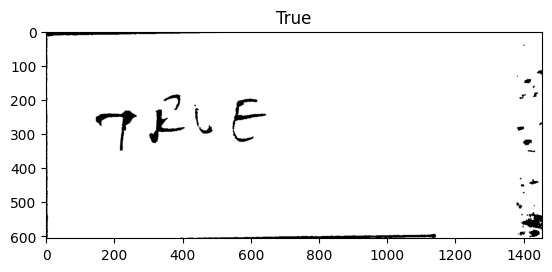

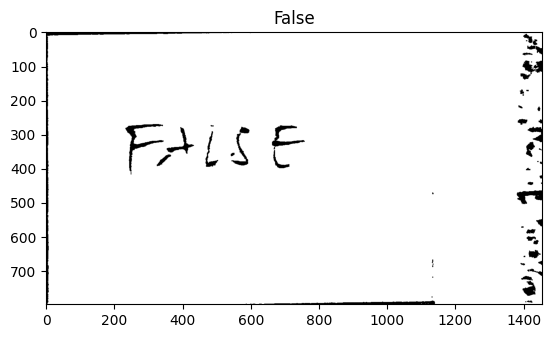

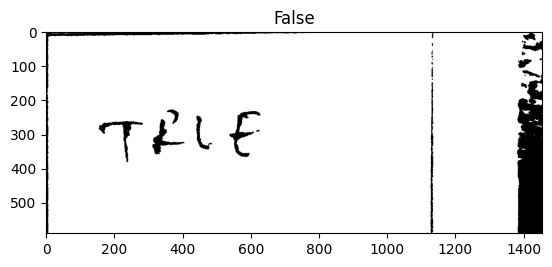

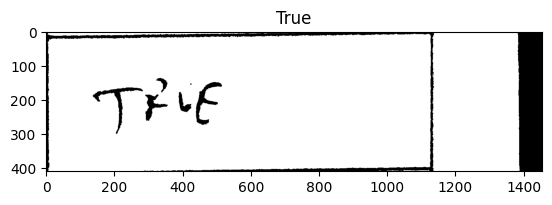

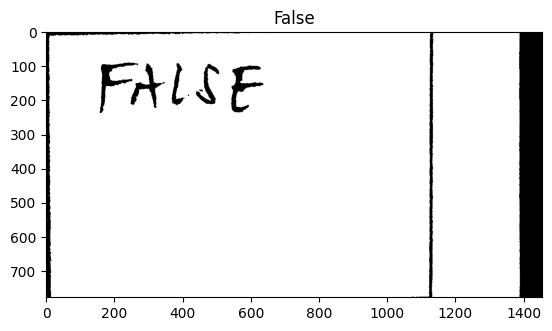

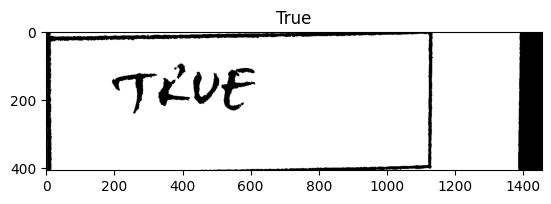

/content/drive/MyDrive/Sample_Data/20240328_145719.jpg
485 410 577 415
454 1019 552 1023
1029 1630 1129 1630
949 2240 1151 2240
805 2646 904 2646
1046 3259 1163 3257
820 4084 921 4083
1034 4689 1136 4687
859 5106 964 5104
830 5927 1012 5921
825 6338 923 6333


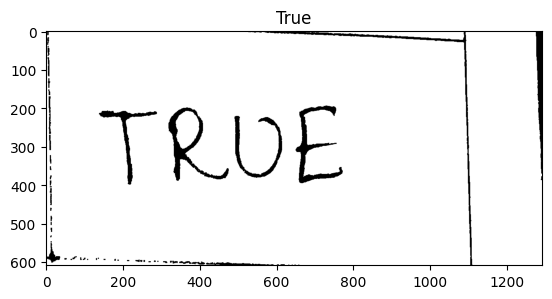

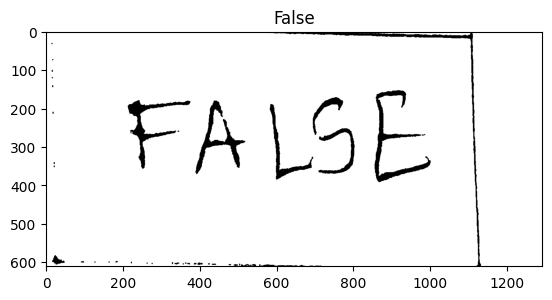

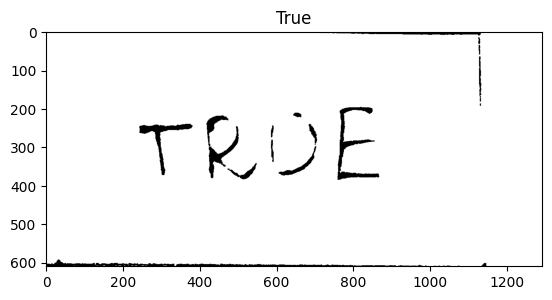

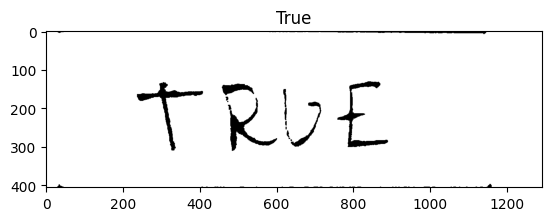

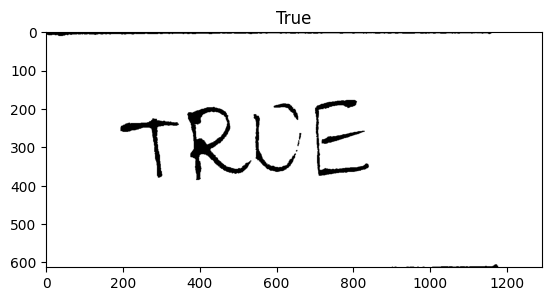

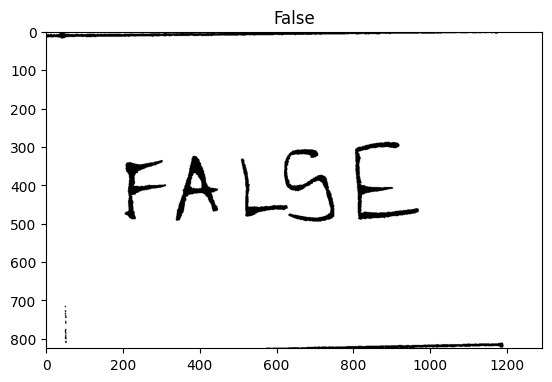

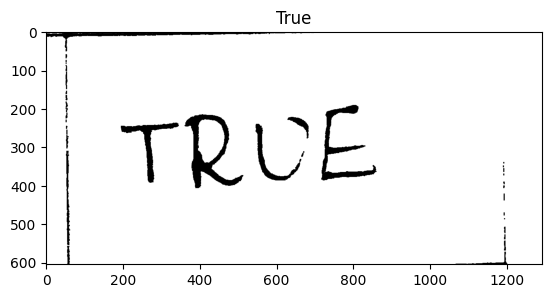

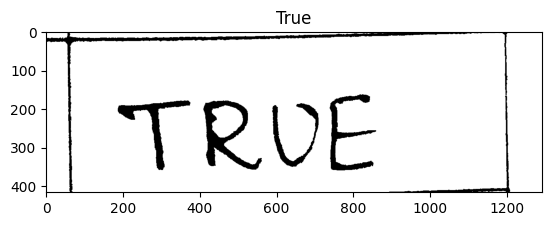

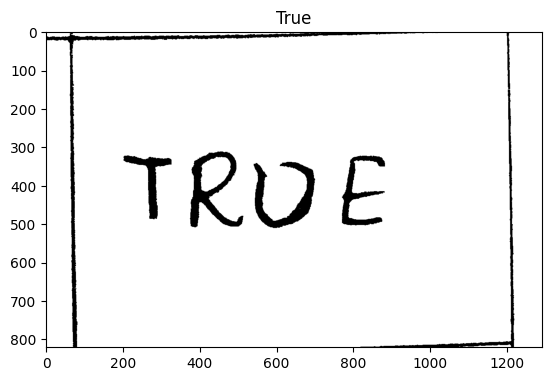

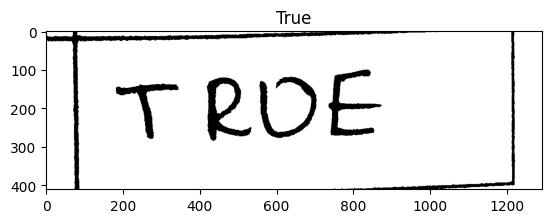

/content/drive/MyDrive/Sample_Data/20240328_153543.jpg
691 325 825 325
689 1554 816 1550
522 2162 624 2160
934 2552 1048 2550
433 3155 1062 3145
882 3933 1059 3930
800 4521 897 4519
856 4919 953 4918
805 5698 906 5697
939 6091 1099 6088


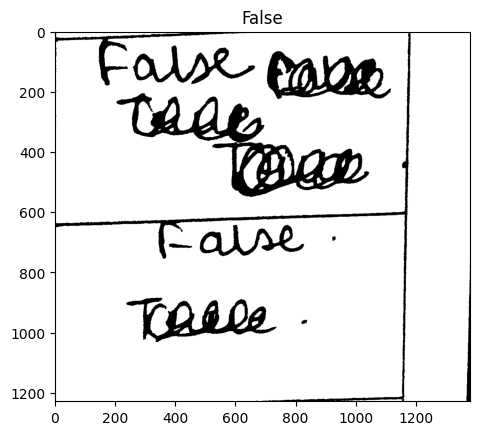

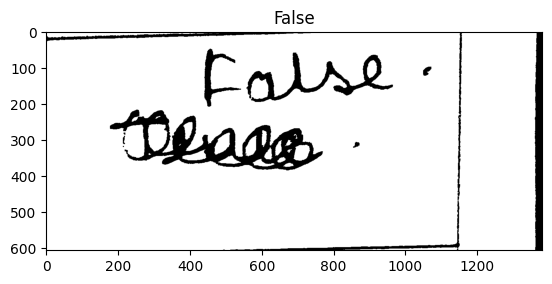

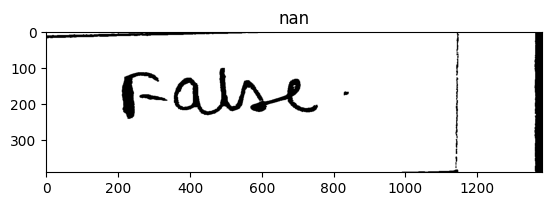

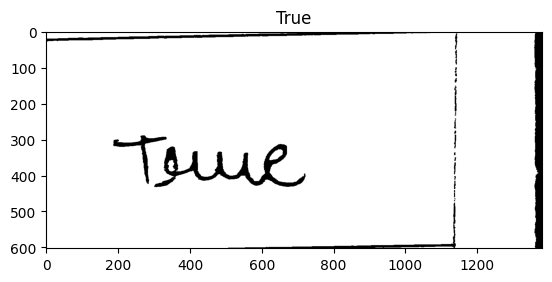

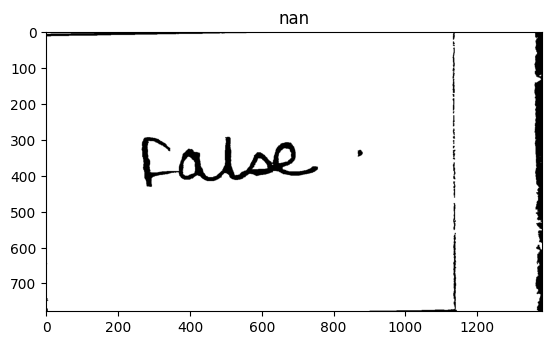

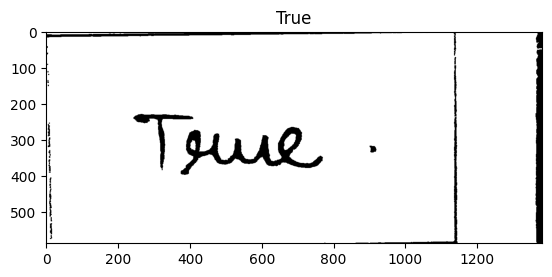

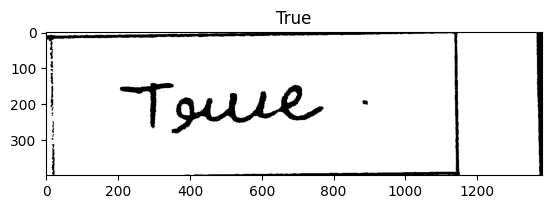

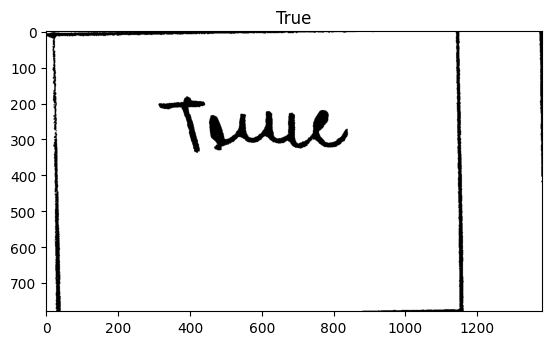

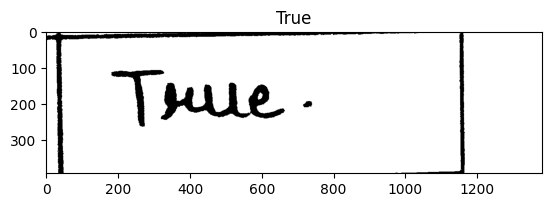

/content/drive/MyDrive/Sample_Data/20240328_154610.jpg
927 394 1069 387
712 999 817 997
947 1586 1103 1581
939 2177 1034 2176
740 2575 1155 2568
708 3166 882 3163
998 3941 1126 3939
1011 4532 1131 4530
952 4922 1084 4919
891 5695 1178 5690
1038 6080 1153 6078


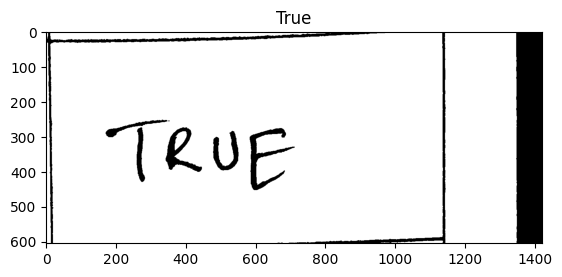

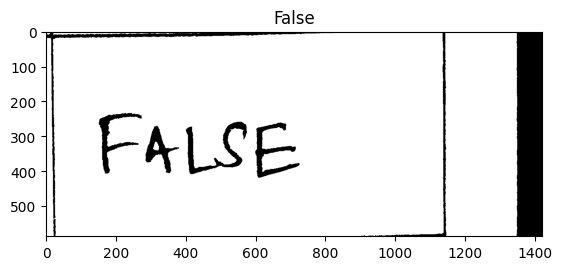

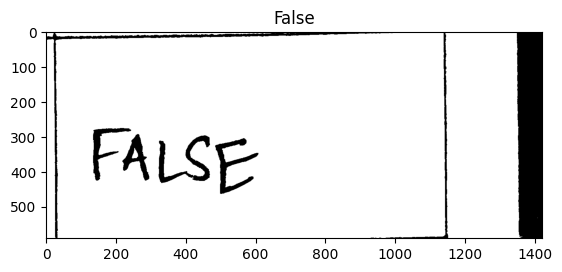

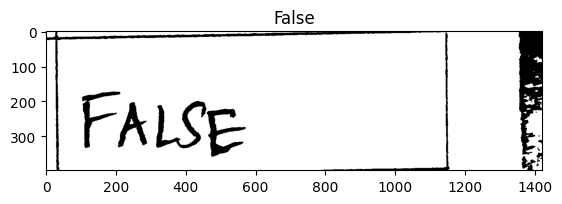

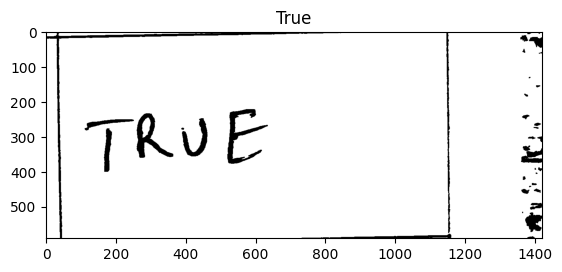

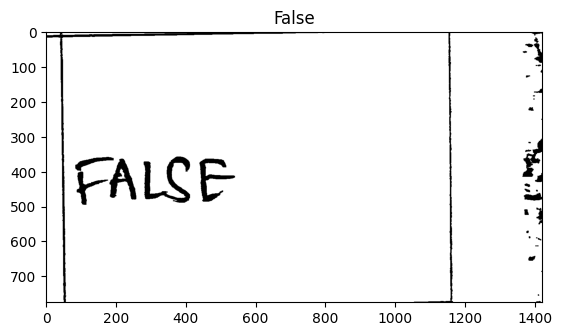

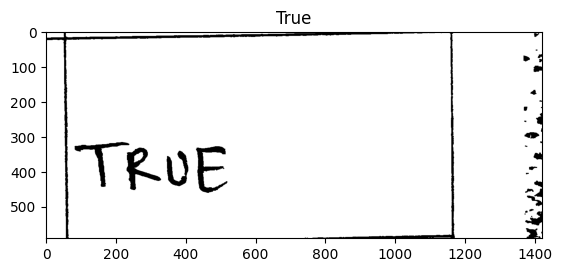

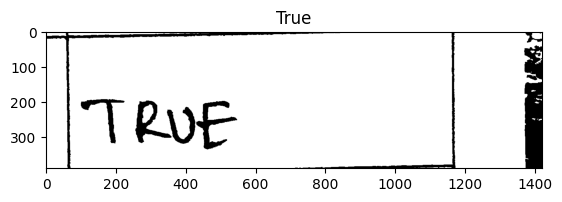

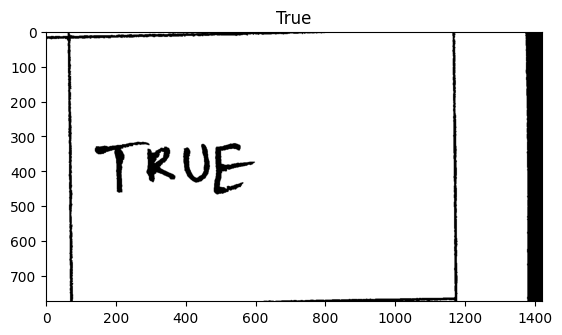

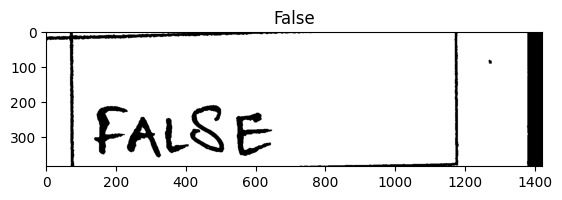

/content/drive/MyDrive/Sample_Data/20240328_151033.jpg
976 372 1104 372
536 967 635 967
724 1558 826 1558
795 2158 888 2158
602 2539 773 2539
879 3127 1017 3127
494 3907 595 3907
634 4489 735 4489
882 4881 1014 4881
862 5658 955 5658
788 6047 965 6047


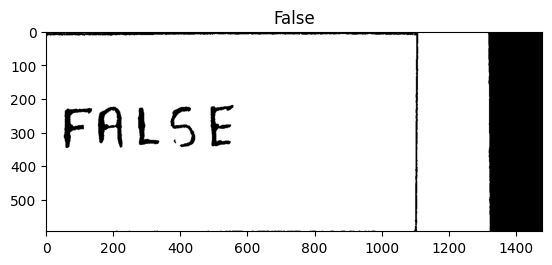

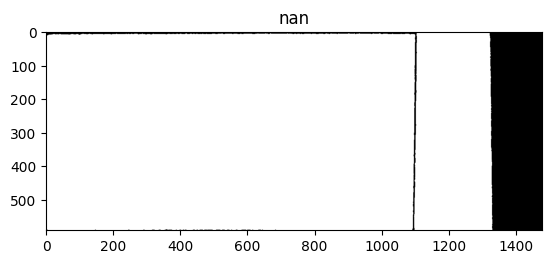

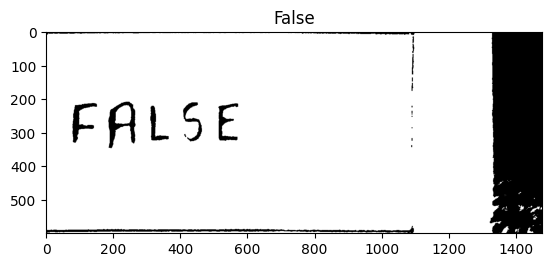

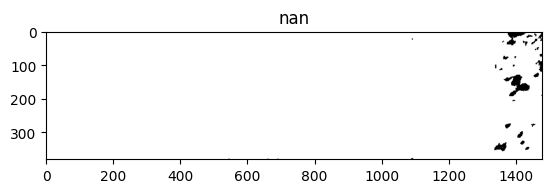

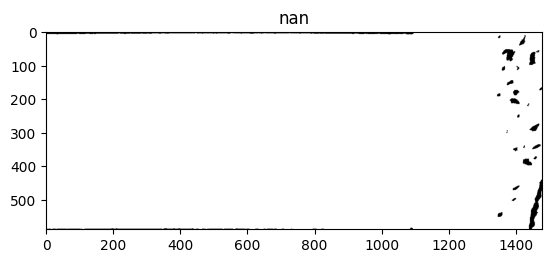

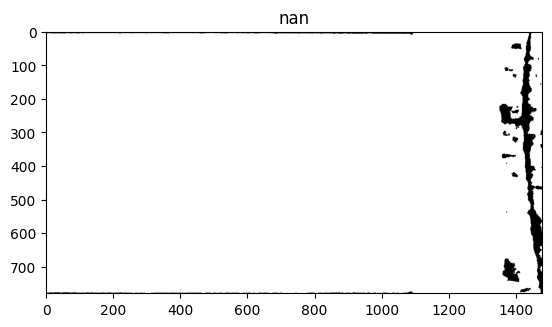

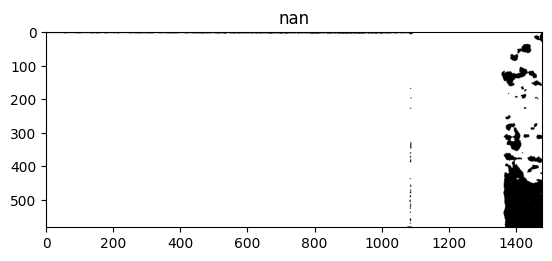

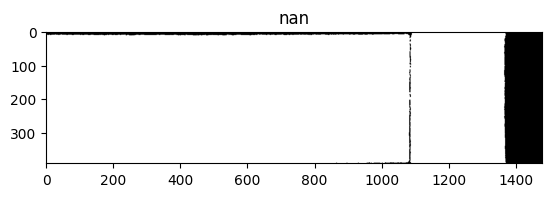

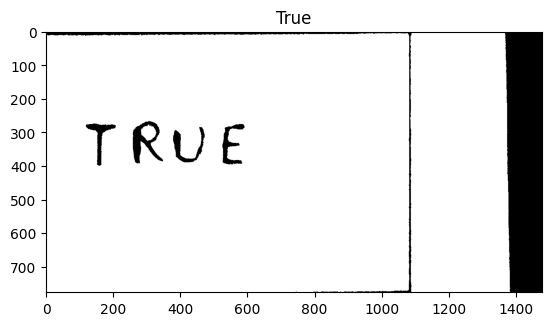

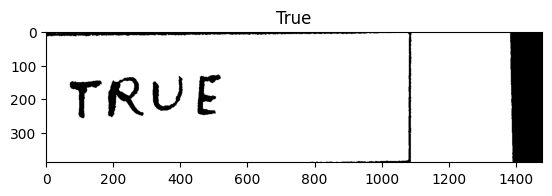

/content/drive/MyDrive/Sample_Data/20240328_145247.jpg
600 304 697 302
759 825 892 823
869 1356 963 1354
882 1897 977 1897
920 2250 1018 2250
717 2792 821 2792
841 3521 1025 3521
735 4067 825 4067
936 4435 1095 4435
433 5176 527 5176
913 5547 1012 5547


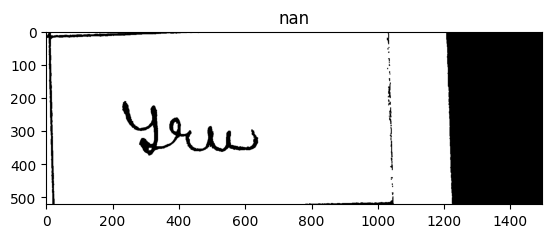

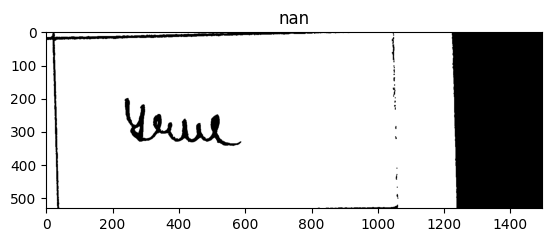

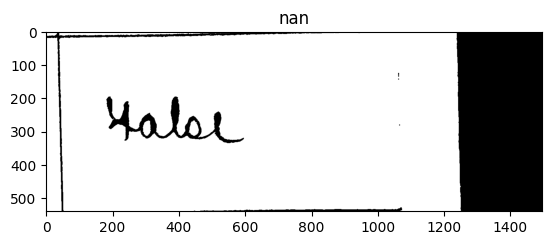

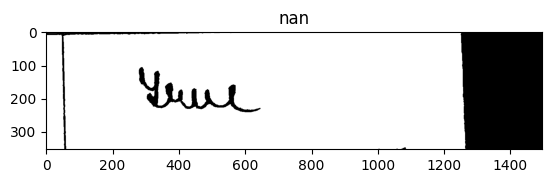

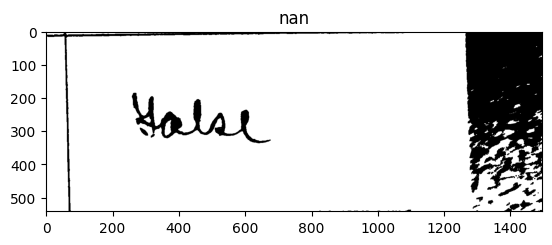

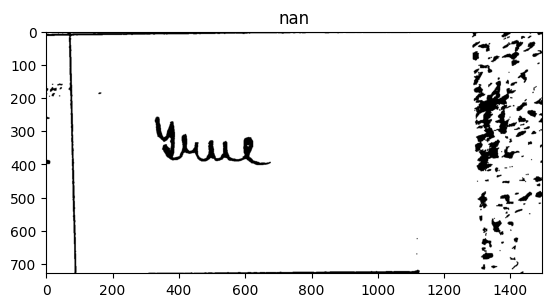

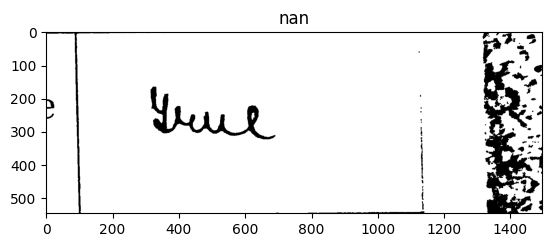

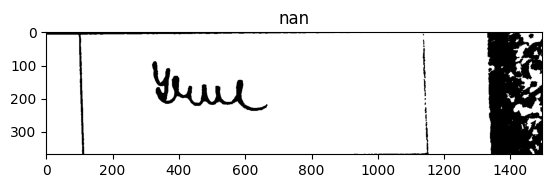

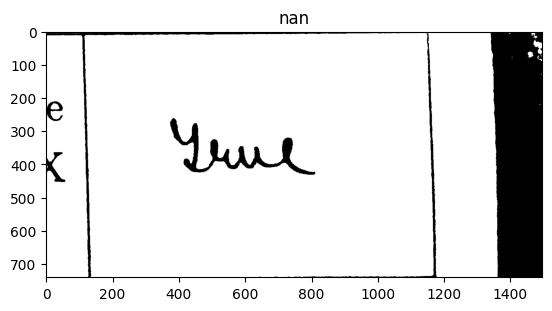

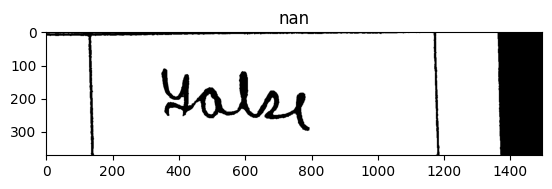

output22.jpg
464 439 554 434
935 1029 1046 1024
1030 1626 1176 1619
685 2248 780 2243
1000 2634 1115 2630
870 3239 993 3234
1076 4024 1173 4021
1012 4626 1161 4621
1078 5024 1171 5021
875 5827 1007 5824
1151 6226 1304 6224


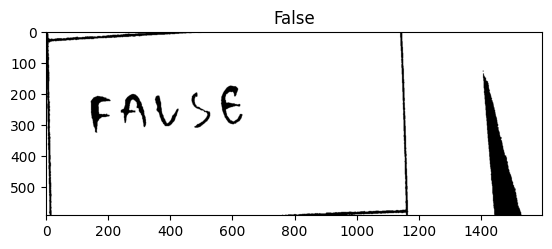

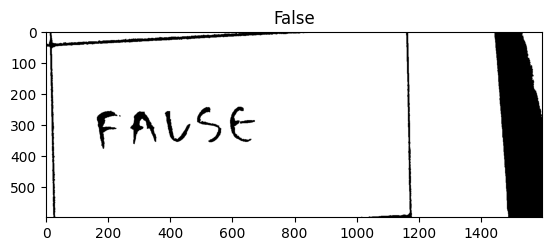

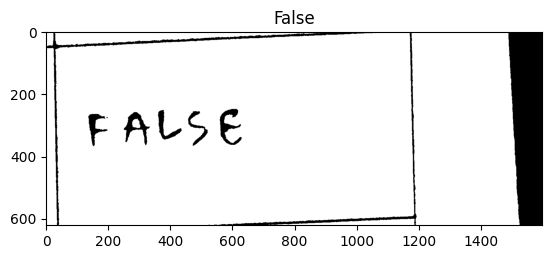

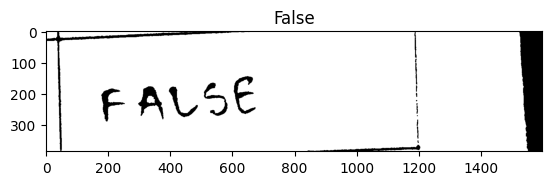

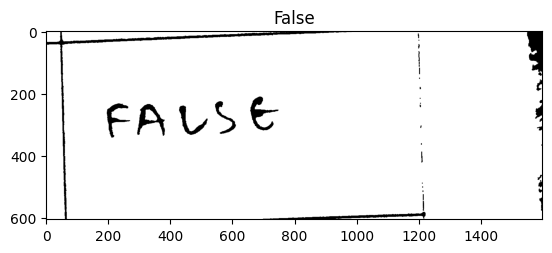

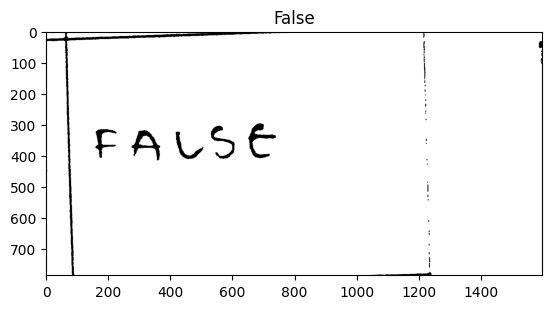

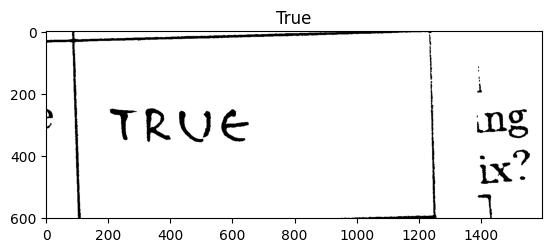

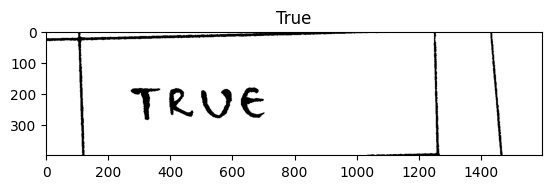

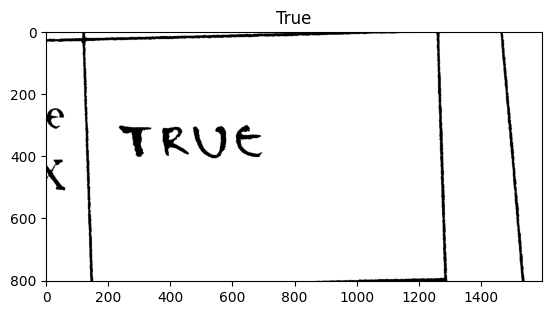

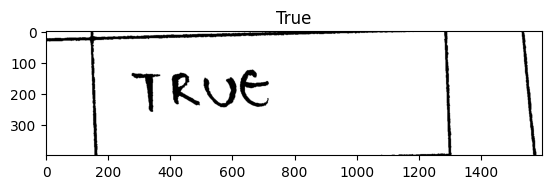

/content/drive/MyDrive/Sample_Data/20240328_152314.jpg
493 349 652 349
929 958 1125 958
883 1564 989 1564
650 2170 759 2170
771 2570 978 2570
892 3168 1116 3168
934 3965 1038 3965
832 4565 929 4565
951 4966 1117 4966
1007 5766 1125 5764
832 6173 989 6171


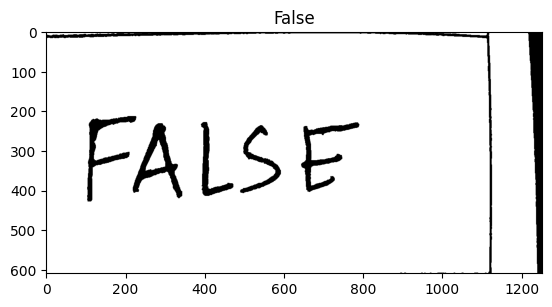

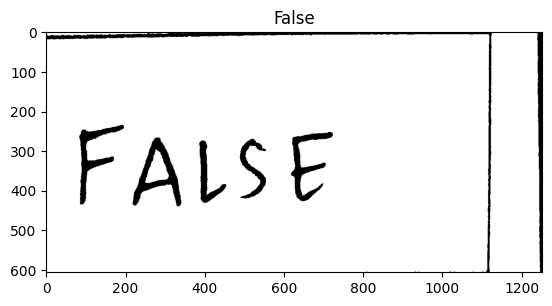

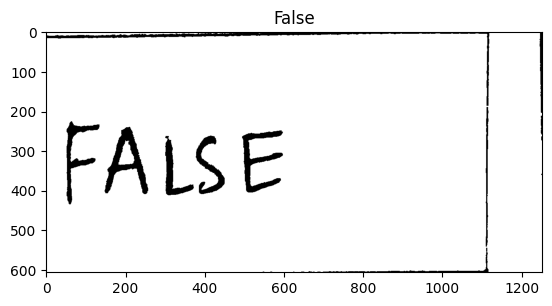

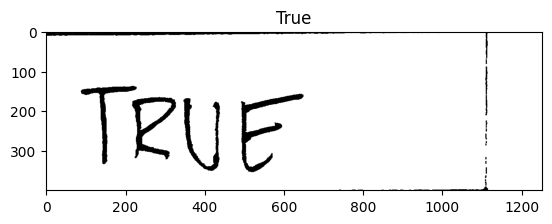

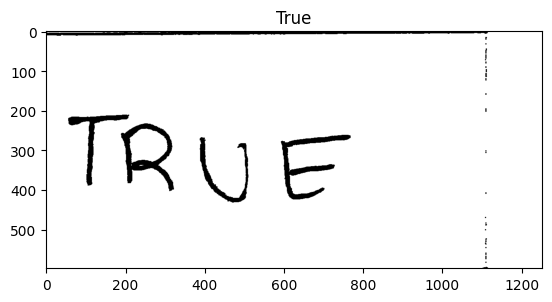

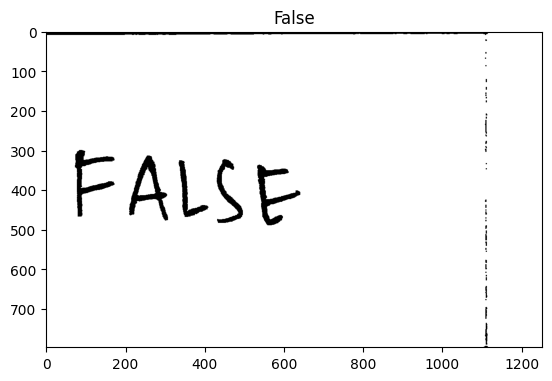

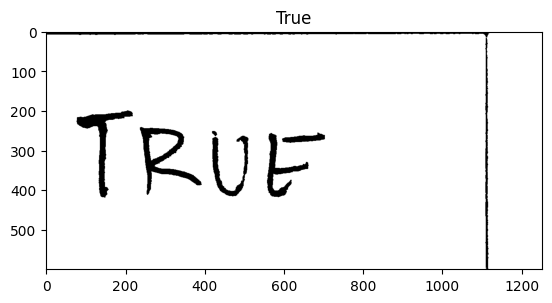

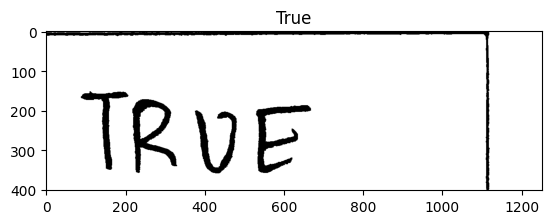

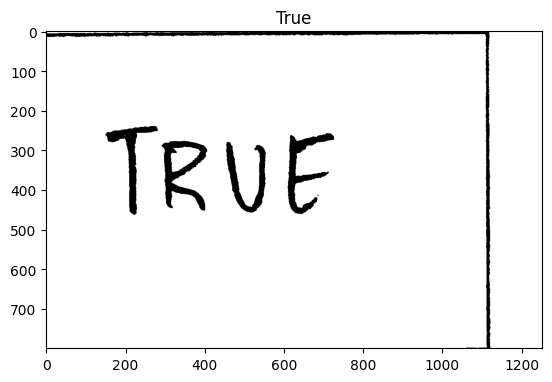

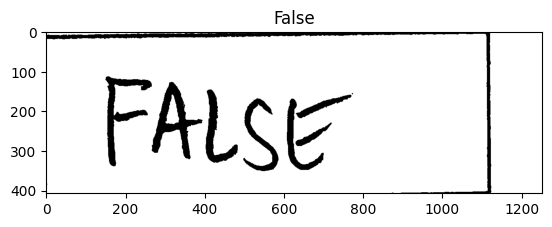

/content/drive/MyDrive/Sample_Data/20240328_155852.jpg
743 257 844 257
829 863 945 863
768 1462 867 1461
786 2063 896 2062
893 2462 983 2462
616 3059 725 3059
567 3848 660 3848
435 4424 537 4425
551 4814 661 4816
641 5589 744 5591
573 5984 670 5986


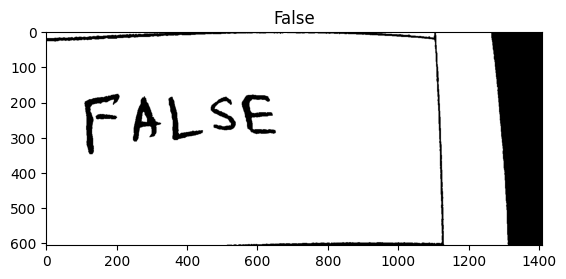

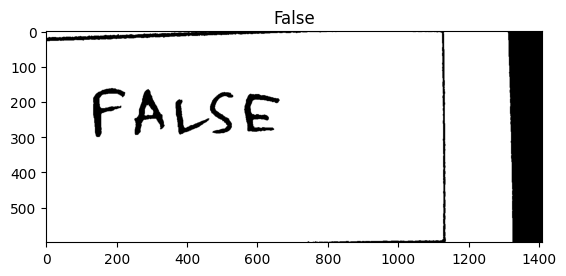

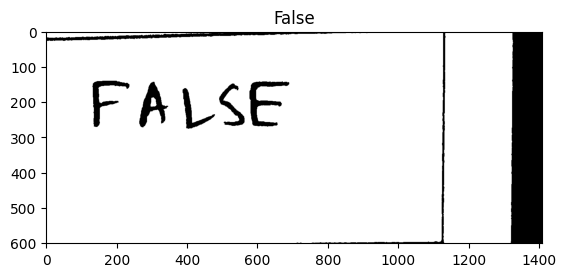

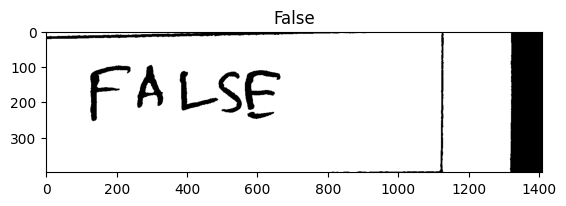

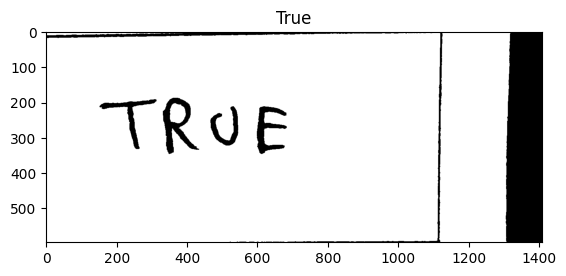

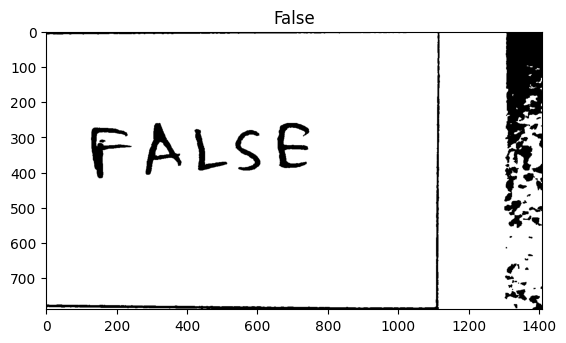

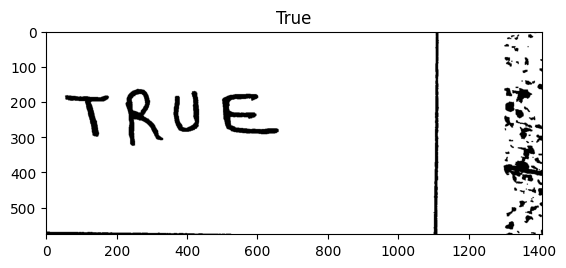

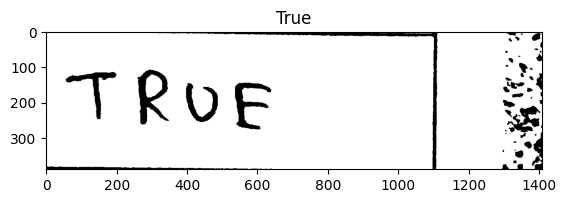

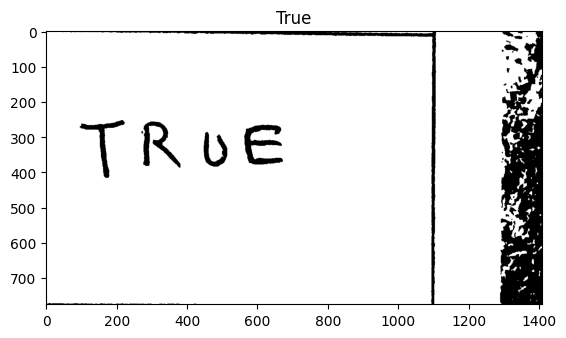

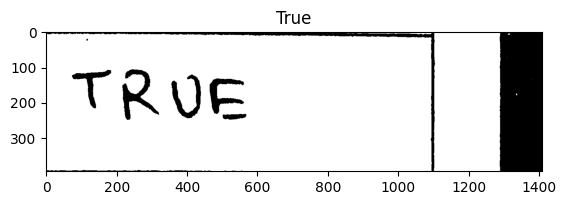

/content/drive/MyDrive/Sample_Data/20240328_150931.jpg
903 879 993 874
405 2052 546 2050
658 2429 782 2427
808 2995 911 2992
1089 3754 1179 3753
1111 4333 1204 4330
645 4732 741 4730
922 5508 1101 5502
1093 5890 1224 5885


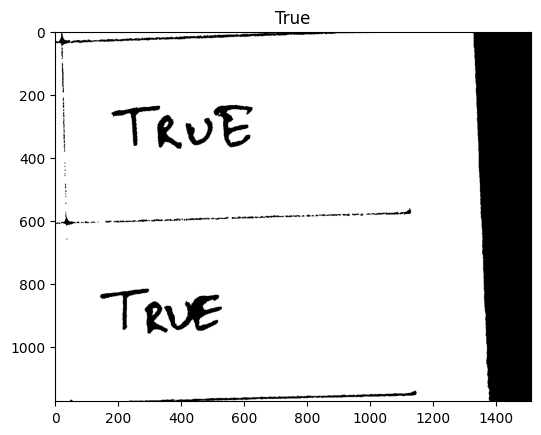

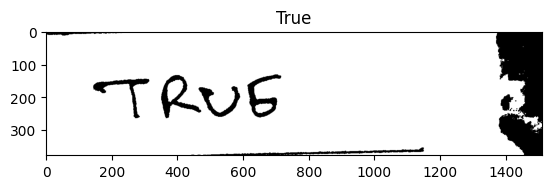

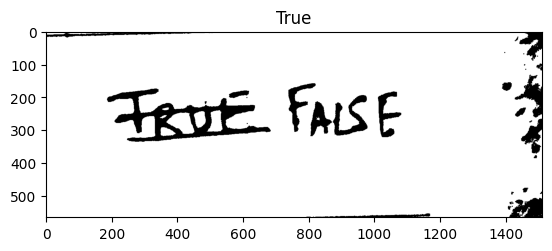

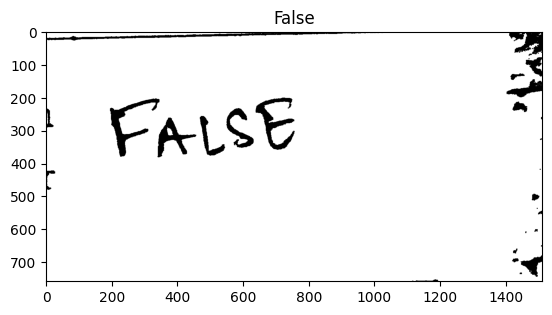

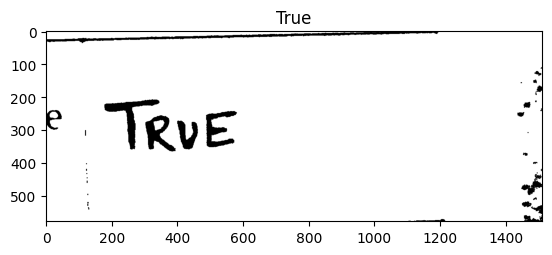

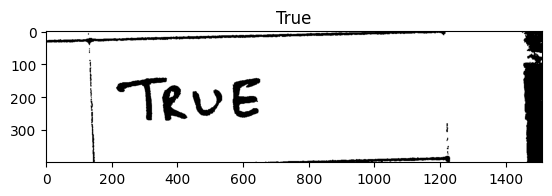

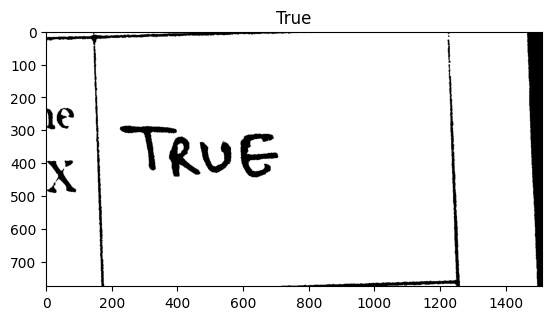

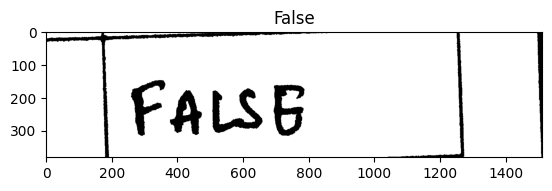

/content/drive/MyDrive/Sample_Data/20240328_153433.jpg
757 278 890 276
884 847 989 842
878 1427 1074 1420
1012 1992 1115 1988
987 2366 1115 2361
909 2933 1114 2926
1057 3683 1186 3679
896 4263 1029 4258
992 4647 1098 4643
1113 5417 1223 5413
1120 5810 1223 5806


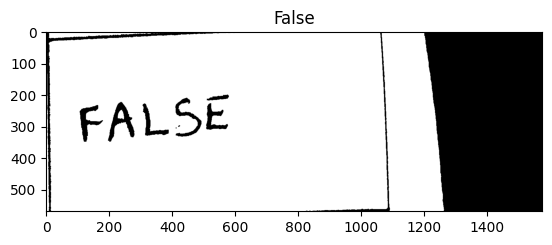

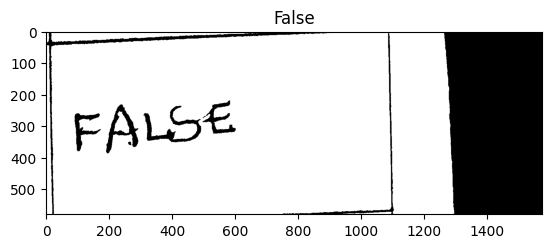

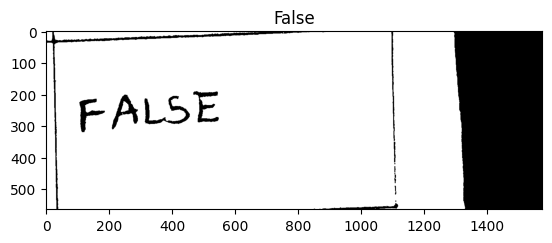

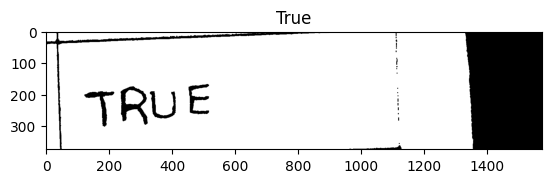

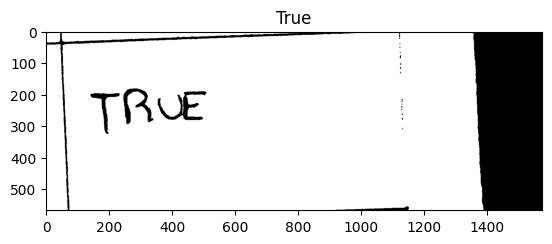

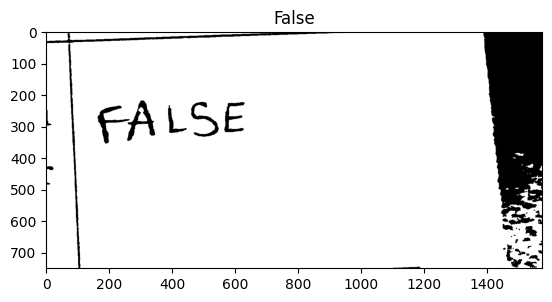

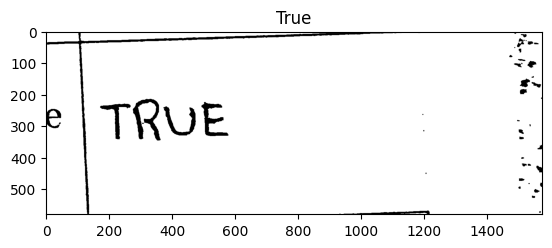

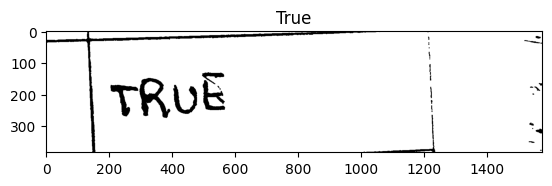

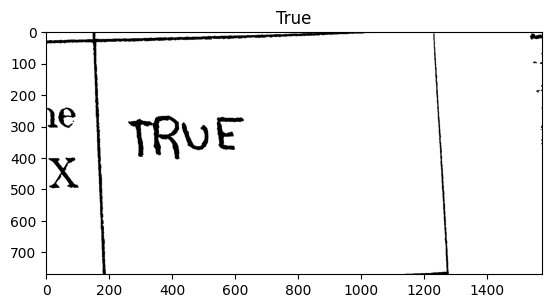

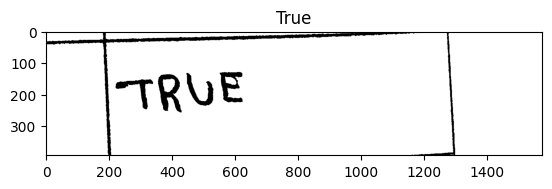

/content/drive/MyDrive/Sample_Data/20240328_153036.jpg
905 339 1006 346
710 869 894 876
505 1418 596 1418
729 1976 826 1976
700 2351 811 2350
821 2914 934 2914
1012 3670 1161 3668
1082 4243 1184 4242
1085 4631 1199 4629
774 5405 926 5405
737 5801 860 5801


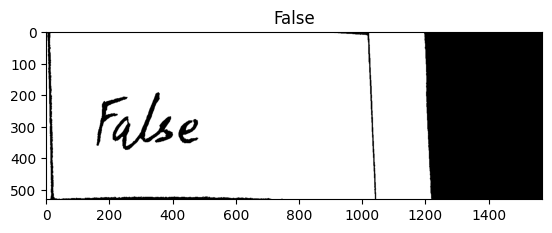

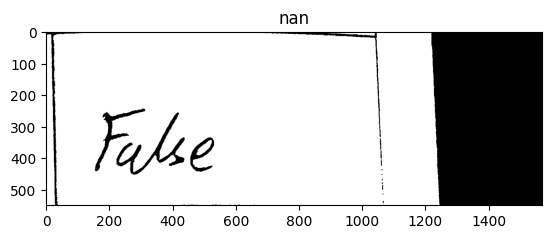

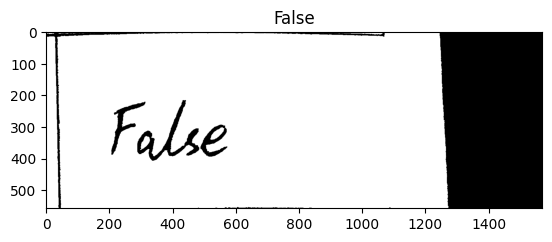

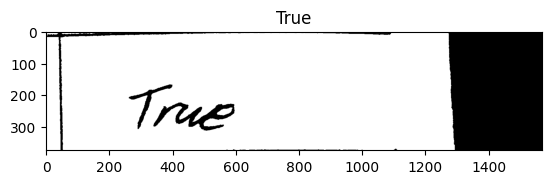

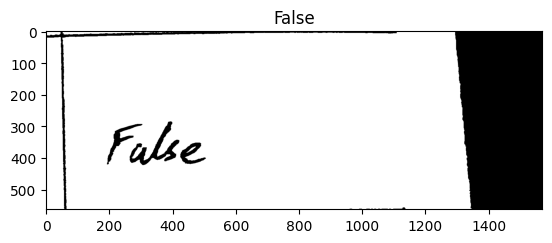

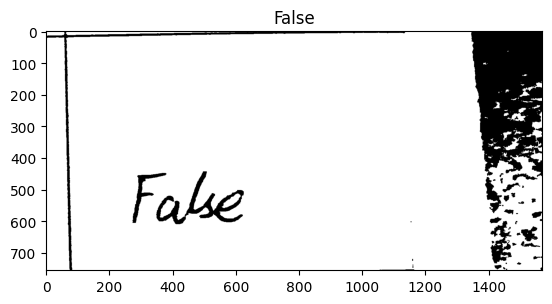

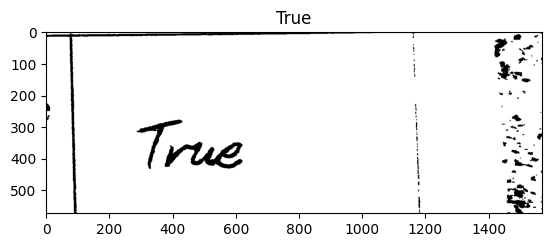

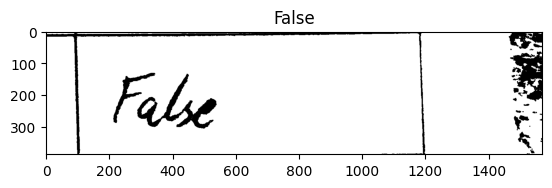

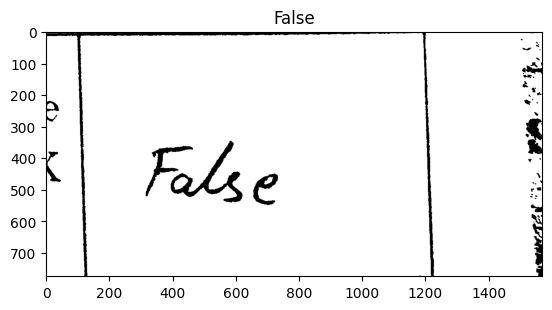

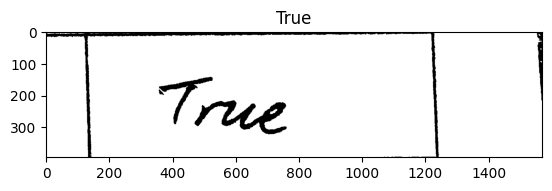

/content/drive/MyDrive/Sample_Data/20240328_150651.jpg
457 456 734 452
544 1054 693 1051
853 1642 974 1640
934 2228 1047 2227
780 2618 896 2616
535 3198 671 3195
861 3959 972 3958
928 4535 1032 4534
965 4919 1070 4917
736 5693 859 5691
875 6074 1025 6071


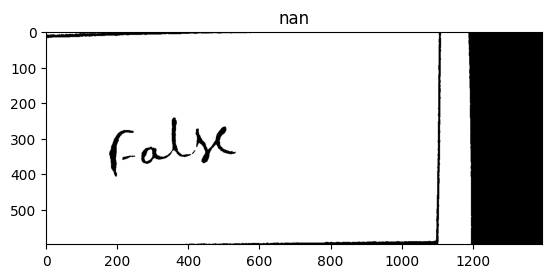

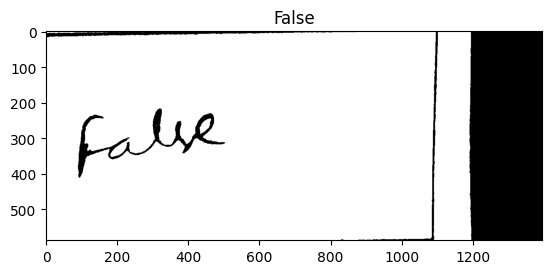

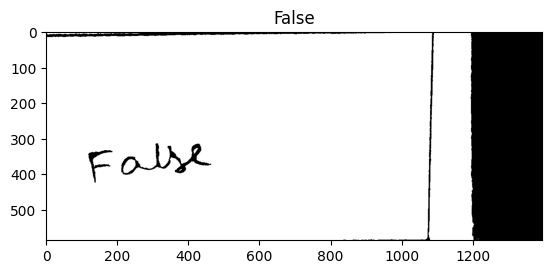

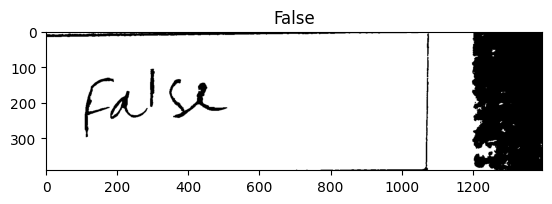

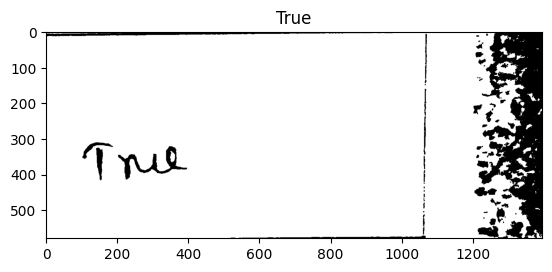

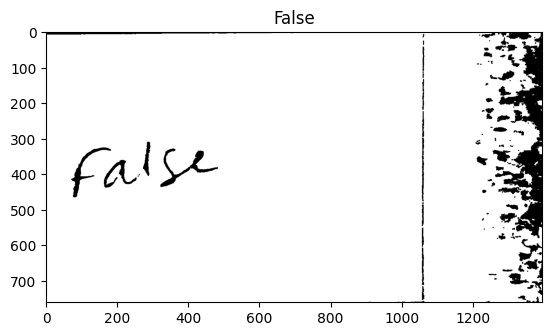

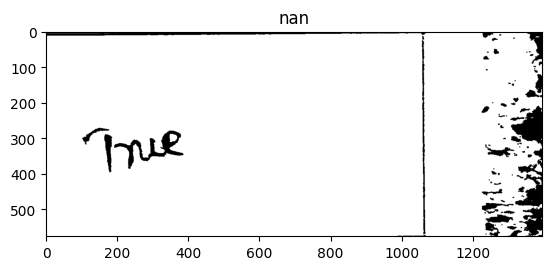

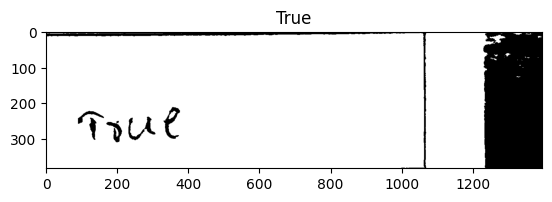

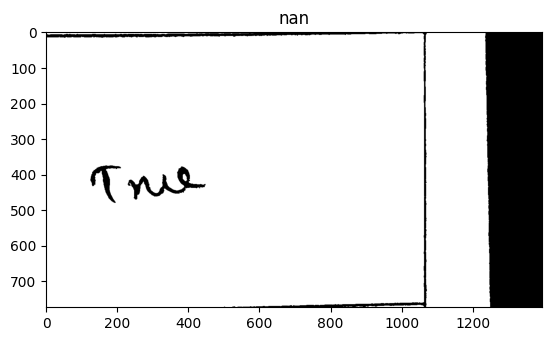

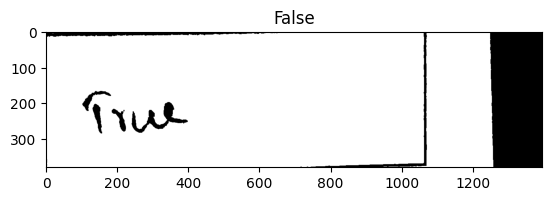

/content/drive/MyDrive/Sample_Data/20240328_155818.jpg
1052 370 1148 370
1027 994 1168 992
1012 1613 1126 1611
919 2222 1036 2218
910 2628 1153 2624
966 3232 1058 3231
1019 4031 1133 4031
933 4631 1024 4631
854 5033 1001 5033
942 5836 1121 5833
1023 6245 1118 6244


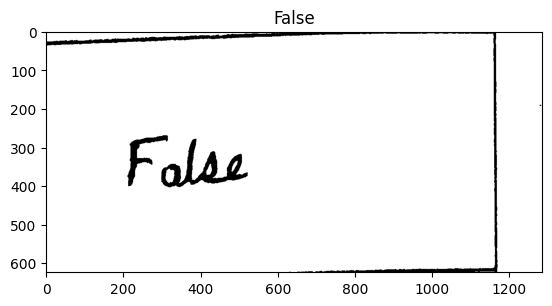

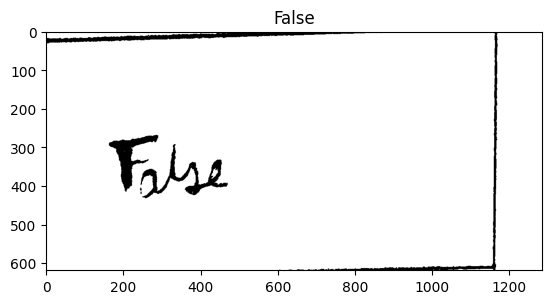

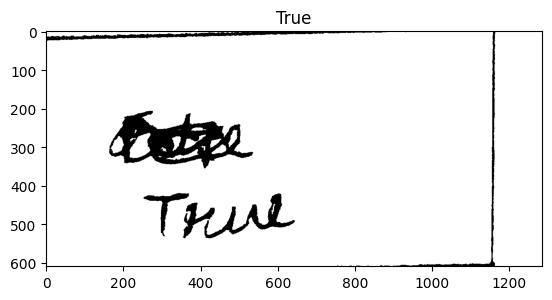

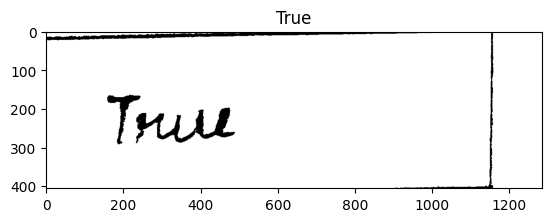

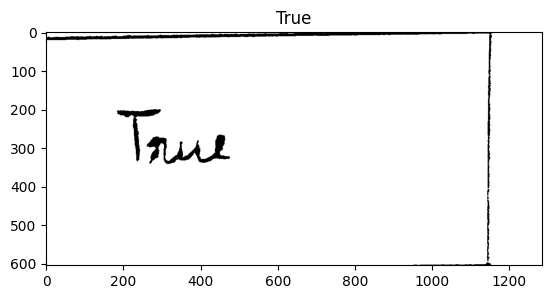

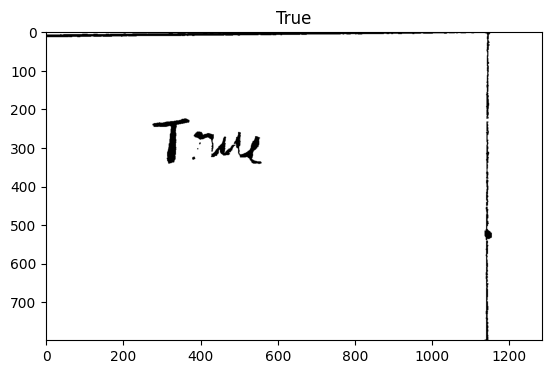

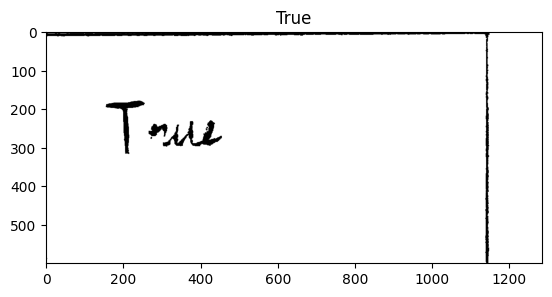

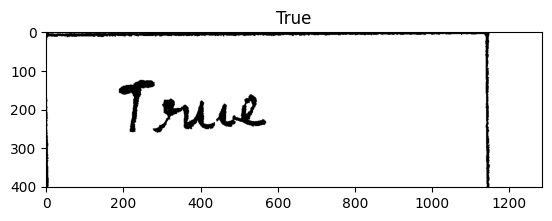

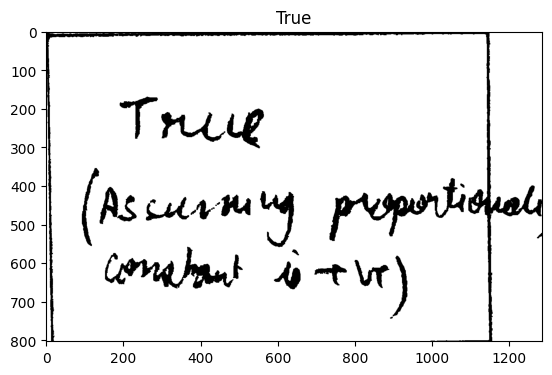

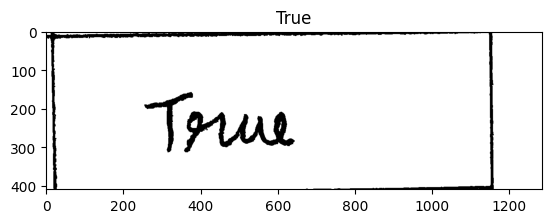

/content/drive/MyDrive/Sample_Data/20240328_145458.jpg
667 396 775 391
803 1003 947 1001
1000 1595 1143 1590
915 2190 1037 2187
898 2586 1025 2584
1040 3180 1136 3180
773 3962 865 3961
891 4562 991 4560
1047 4961 1156 4960
1103 5761 1194 5760
1099 6164 1203 6160


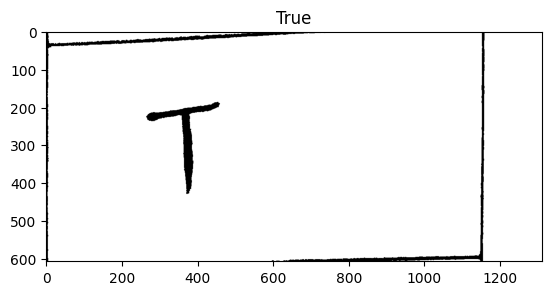

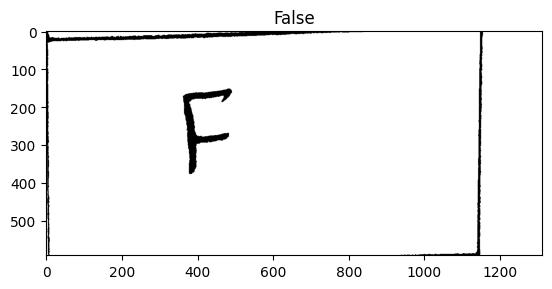

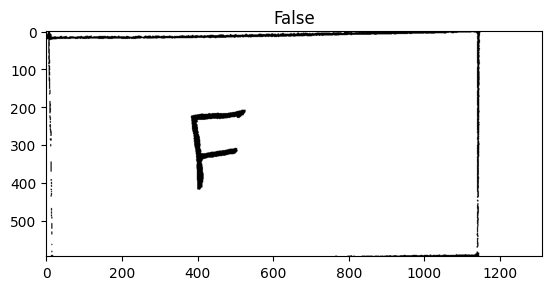

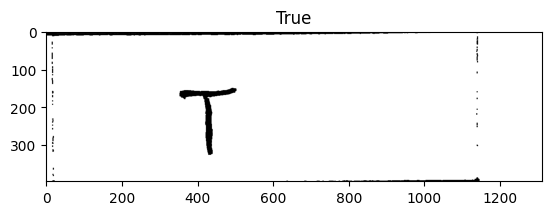

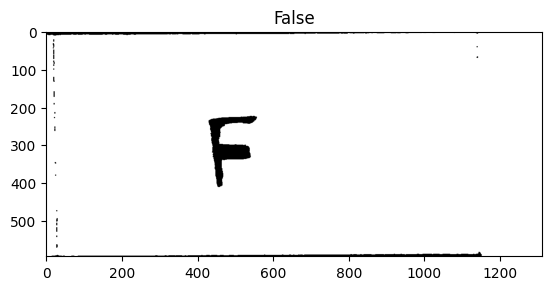

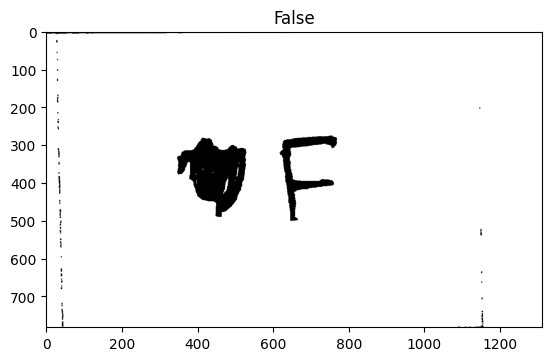

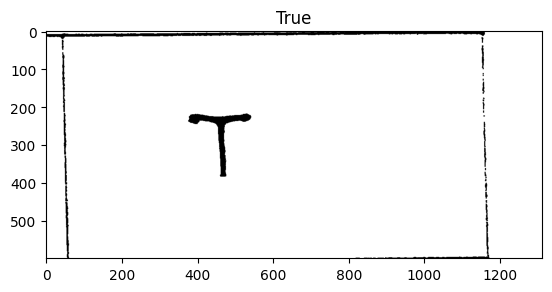

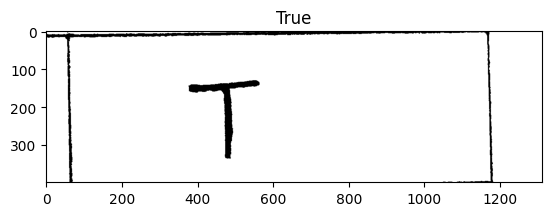

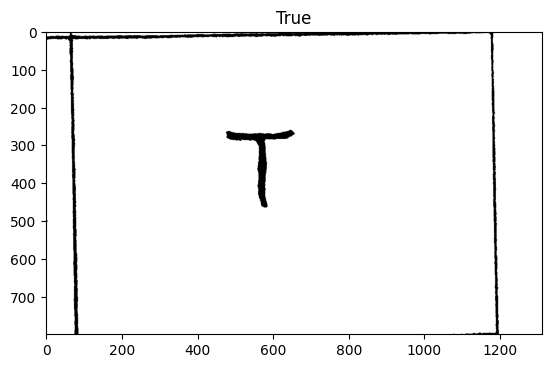

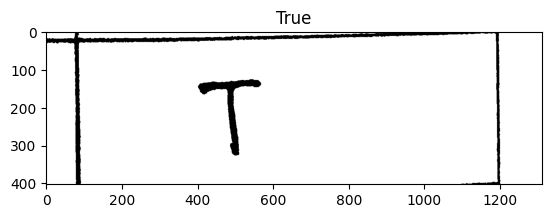

/content/drive/MyDrive/Sample_Data/20240328_151238.jpg
735 322 847 322
933 923 1034 920
1024 1522 1120 1519
551 2133 1008 2118
894 2517 1128 2509
1016 3099 1145 3095
1049 3881 1149 3879
869 4466 962 4465
742 4863 920 4860
816 6062 910 6060


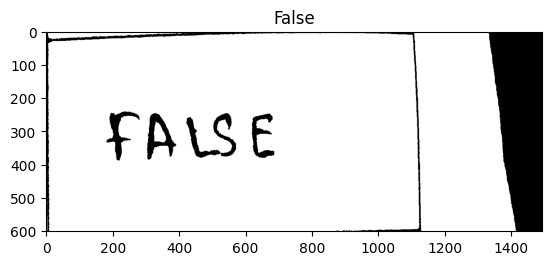

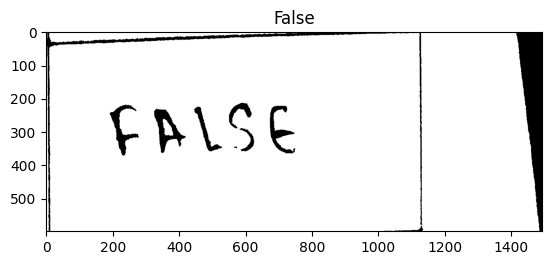

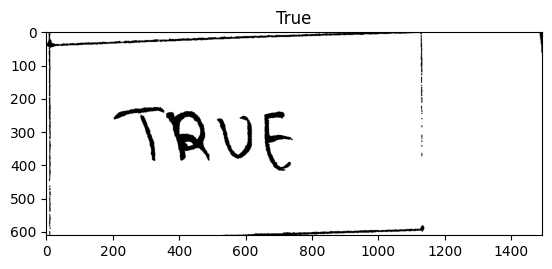

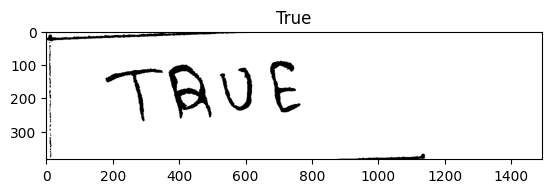

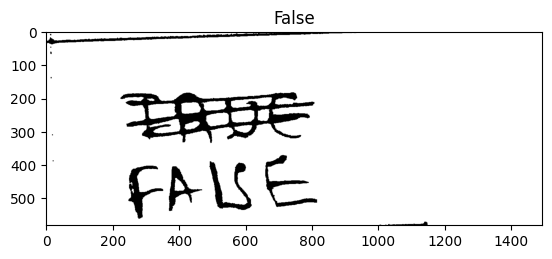

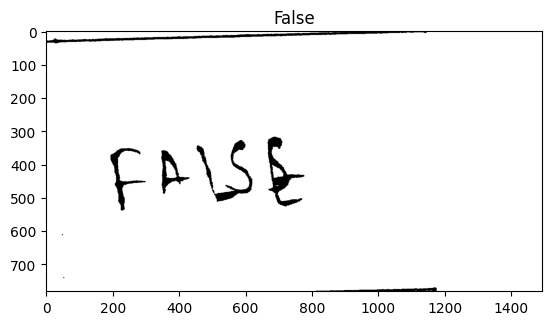

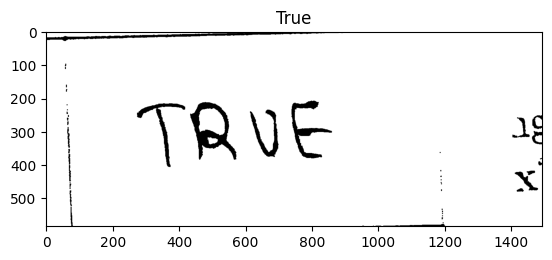

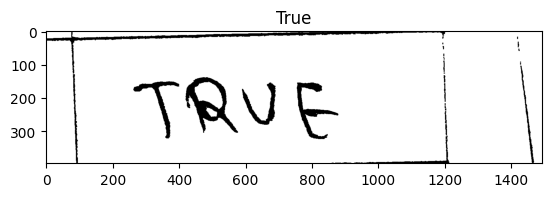

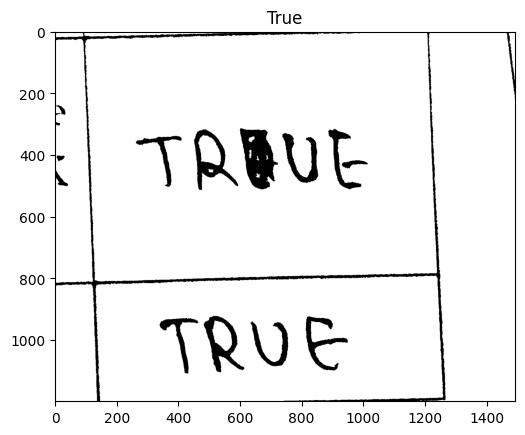

/content/drive/MyDrive/Sample_Data/20240328_145148.jpg
910 411 1018 409
818 1003 936 1001
1026 1598 1118 1597
983 2194 1096 2193
870 2594 1013 2591
985 3189 1098 3188
914 3986 1084 3984
706 4589 841 4589
777 4996 902 4994
1109 5803 1224 5801
1081 6217 1191 6215


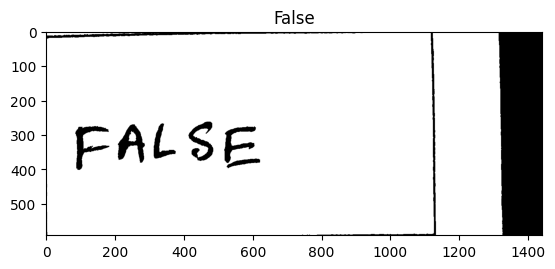

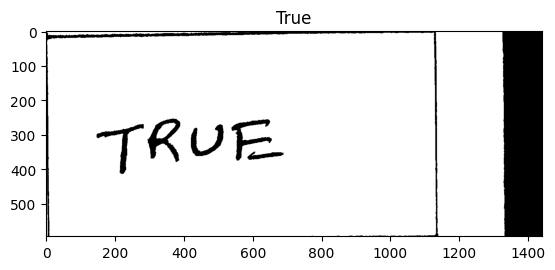

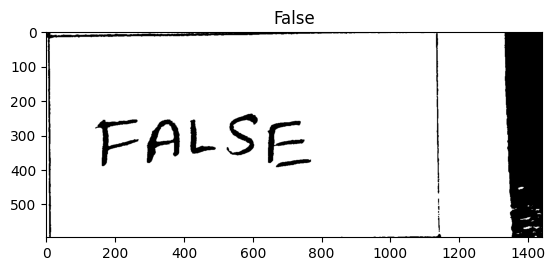

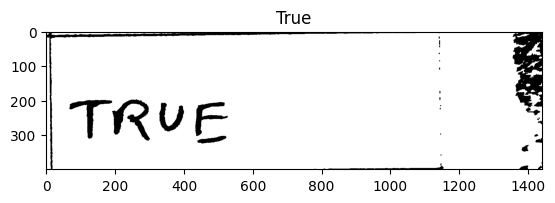

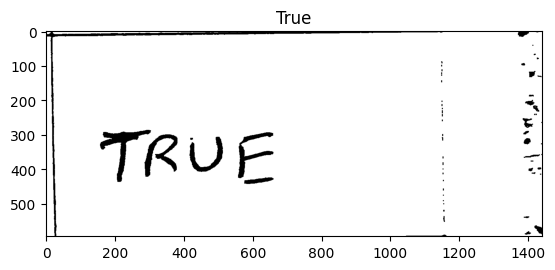

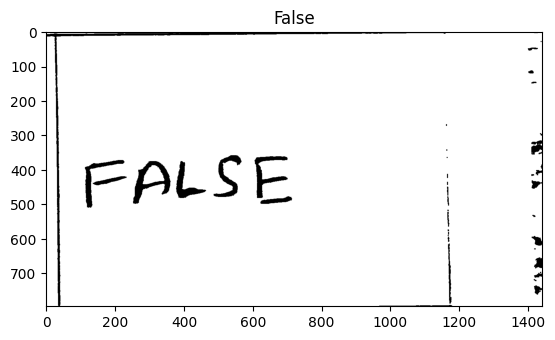

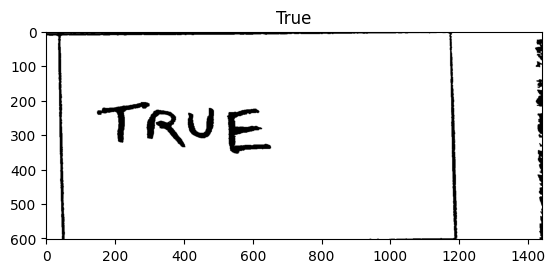

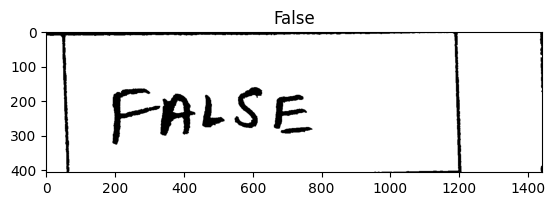

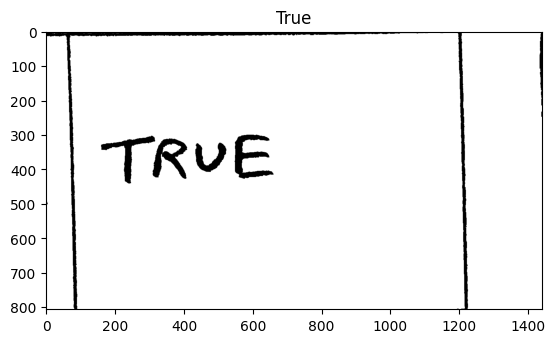

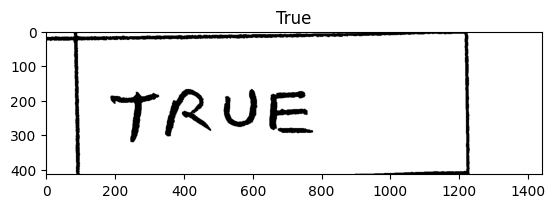

/content/drive/MyDrive/Sample_Data/20240328_155417.jpg
1033 5920 1156 5918
/content/drive/MyDrive/Sample_Data/20240328_153338.jpg
914 243 1011 238
910 863 1023 857
865 1480 963 1476
854 2091 971 2085
1110 2487 1206 2484
863 3097 970 3094
802 3899 1067 3890
882 4496 984 4493
1161 4892 1256 4889
1120 5689 1268 5683
918 6086 1010 6083


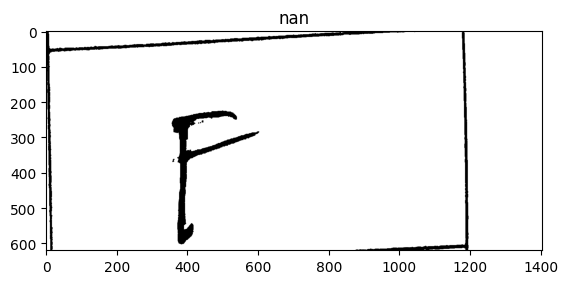

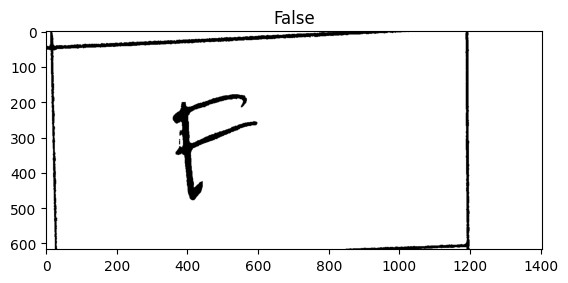

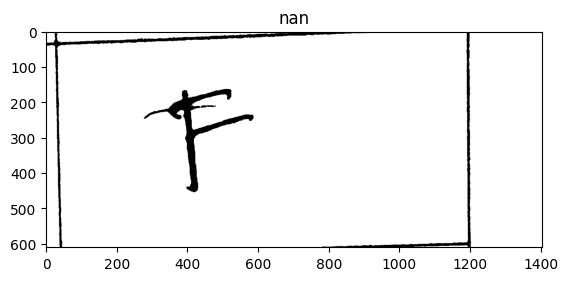

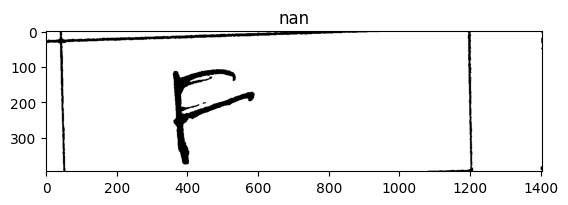

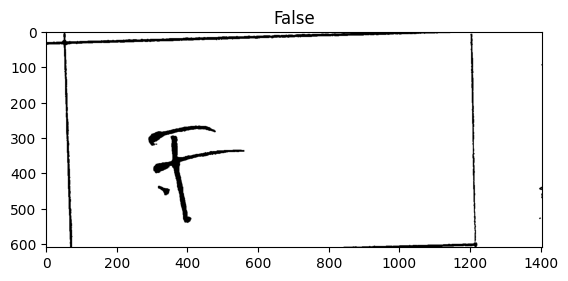

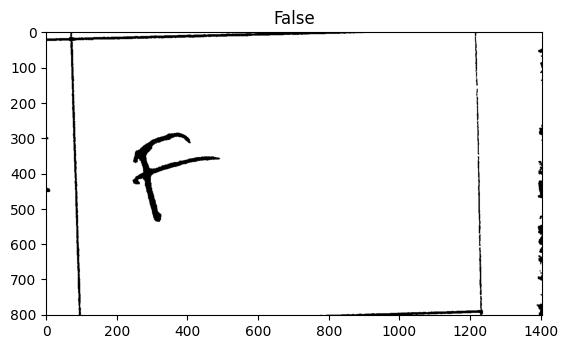

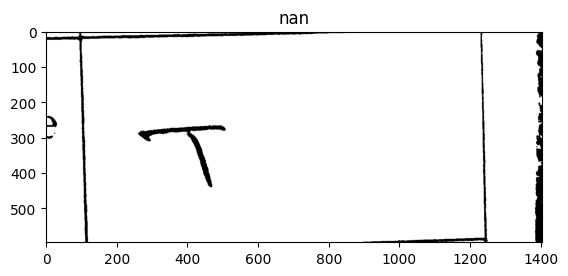

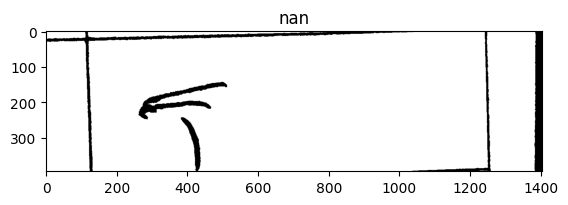

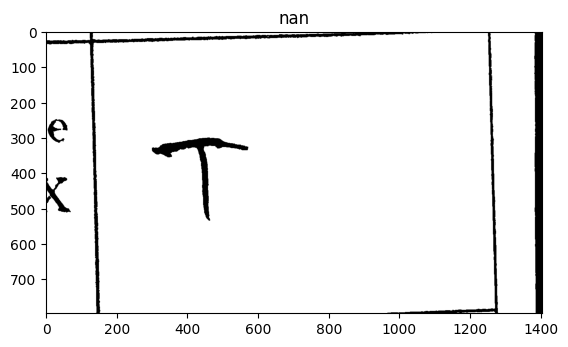

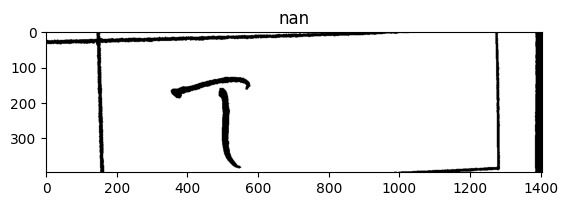

/content/drive/MyDrive/Sample_Data/20240328_153306.jpg
829 392 937 394
891 994 1067 994
784 1610 1092 1610
489 2212 604 2210
975 2616 1067 2614
419 4031 586 4031
516 4638 606 4639
462 5049 564 5049
833 5867 973 5867
475 6279 574 6279


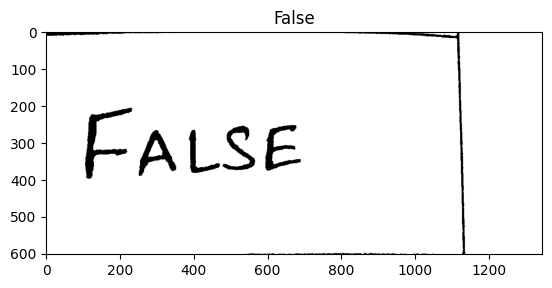

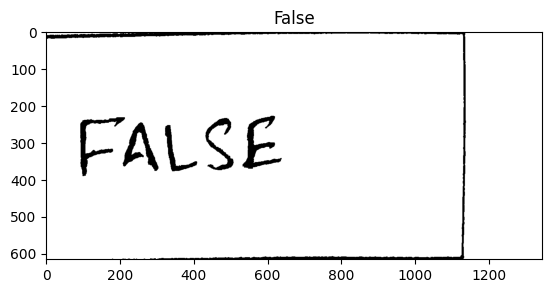

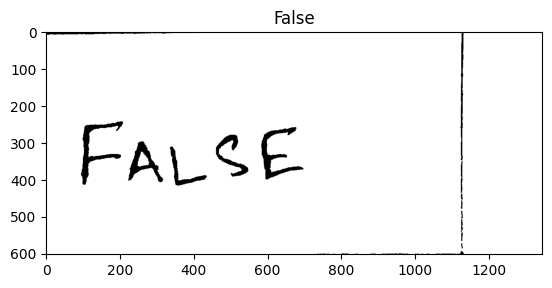

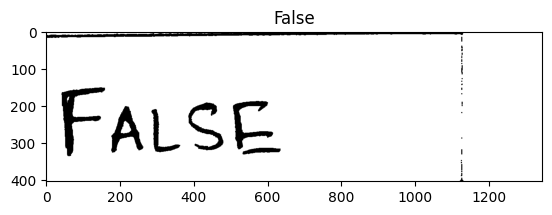

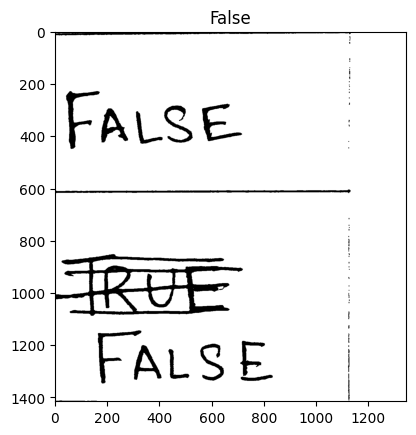

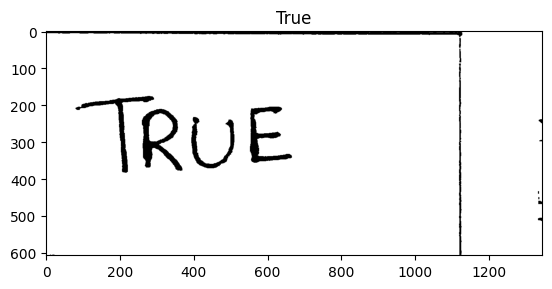

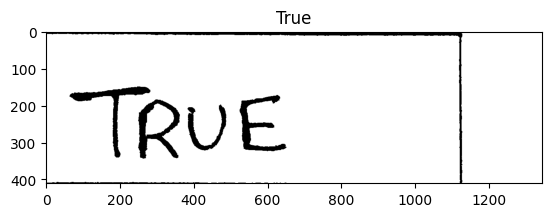

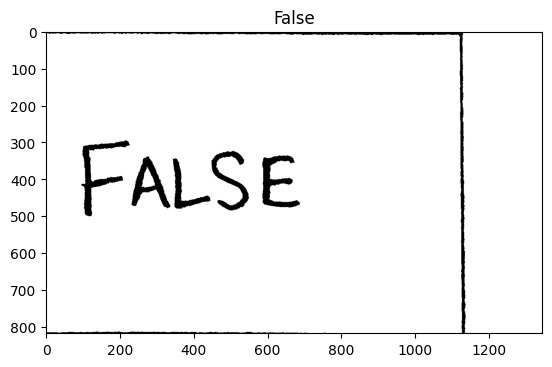

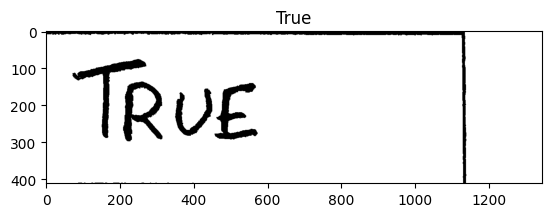

/content/drive/MyDrive/Sample_Data/20240328_152408.jpg
663 468 817 468
689 1068 863 1068
689 1646 789 1646
937 2231 1039 2231
930 2614 1037 2614
634 3202 811 3202
852 3981 992 3981
964 4566 1073 4565
814 4960 904 4958
960 5746 1096 5744
904 6138 1003 6138


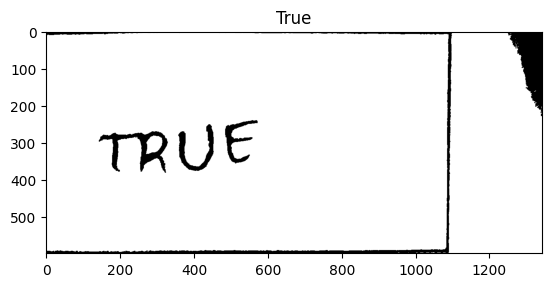

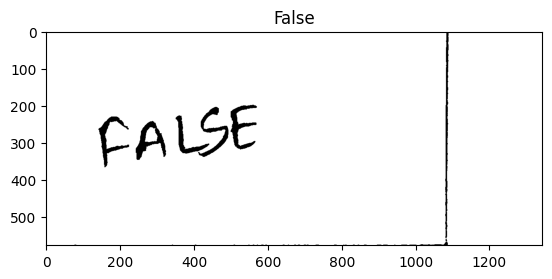

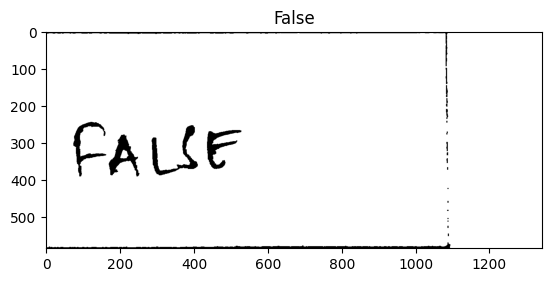

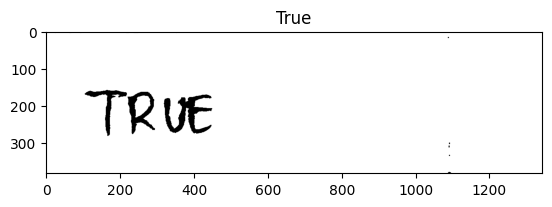

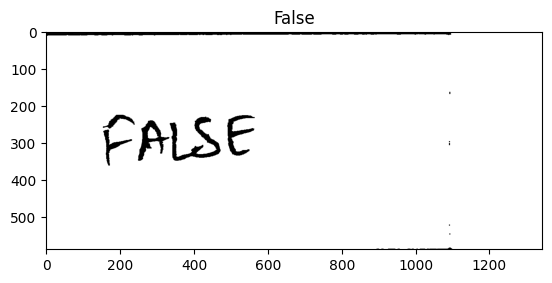

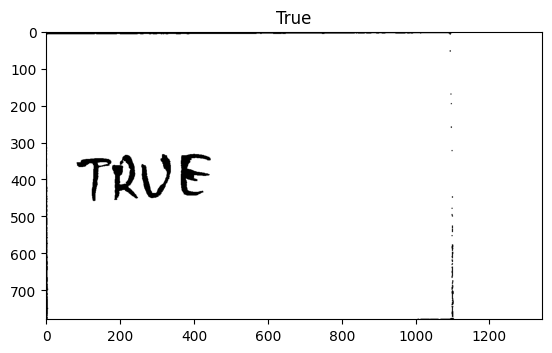

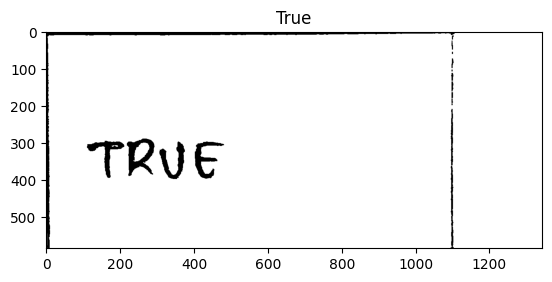

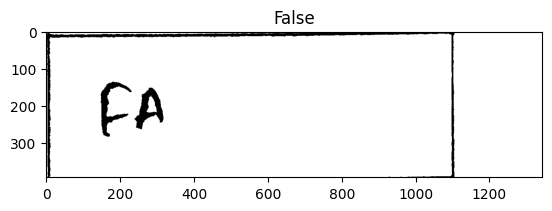

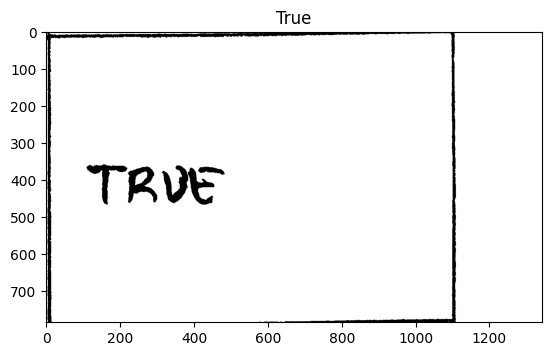

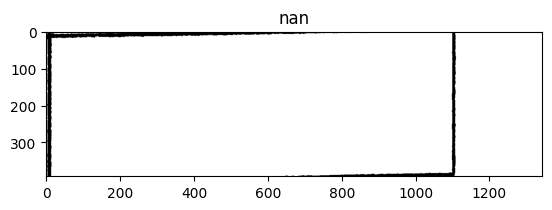

/content/drive/MyDrive/Sample_Data/20240328_160040.jpg
676 460 795 456
946 1105 1039 1101
874 1753 1009 1748
933 2386 1043 2383
967 2810 1095 2808
671 3426 785 3424
415 3815 543 3817
425 4238 525 4236
1011 4839 1105 4837
441 5255 621 5252
1070 6051 1186 6049
1076 6456 1189 6454


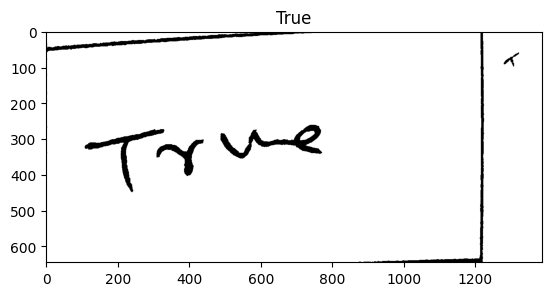

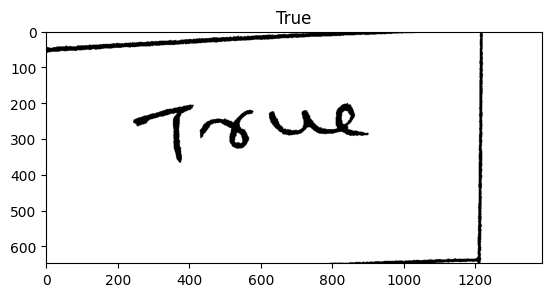

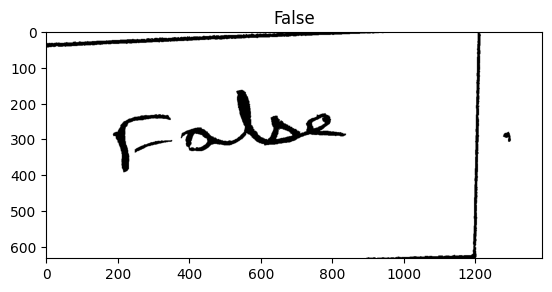

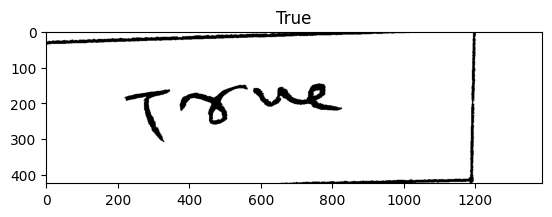

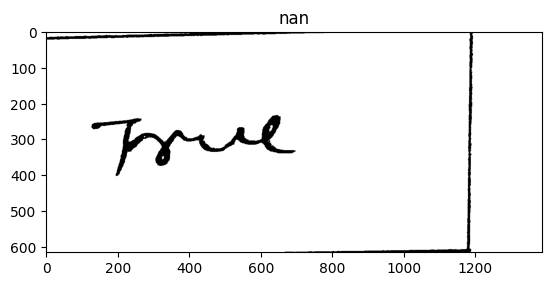

...

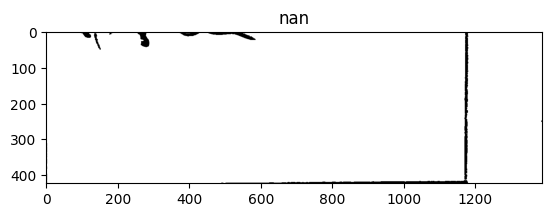

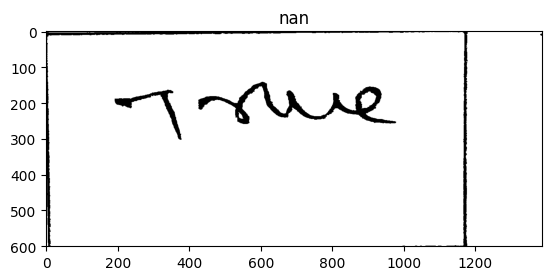

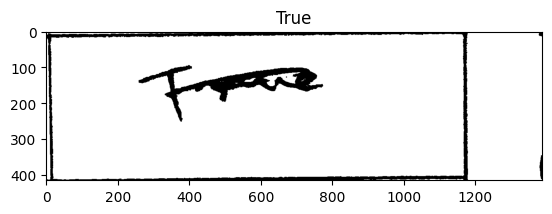

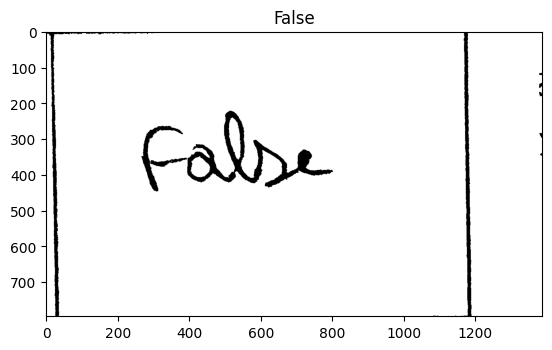

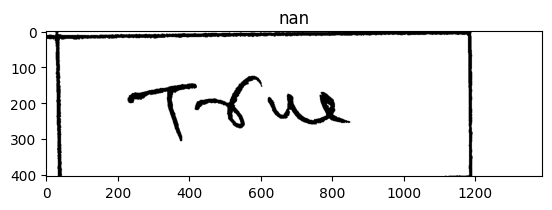

output38.jpg
767 1509 959 1506
1041 2101 1148 2099
644 2509 797 2507
887 3096 987 3094
897 3893 1055 3890
666 4484 777 4482
1060 4878 1191 4876
1062 5663 1172 5663
844 6066 949 6065


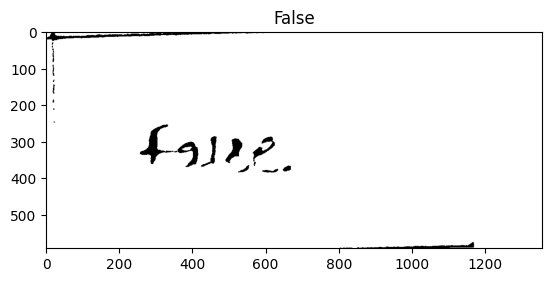

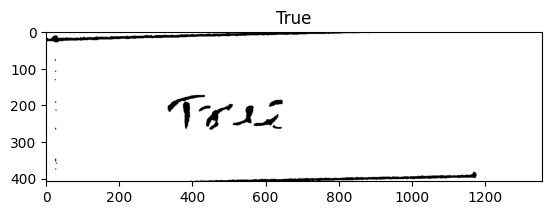

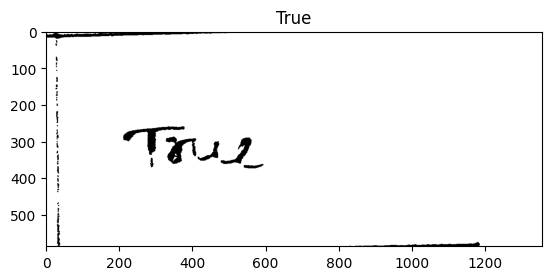

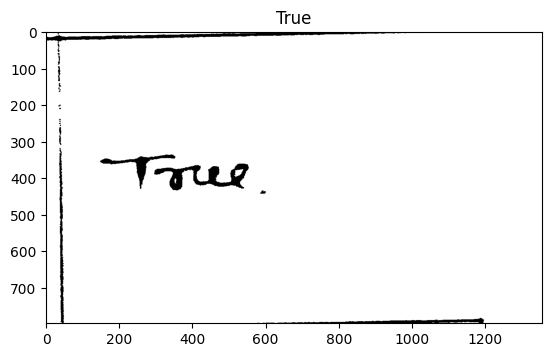

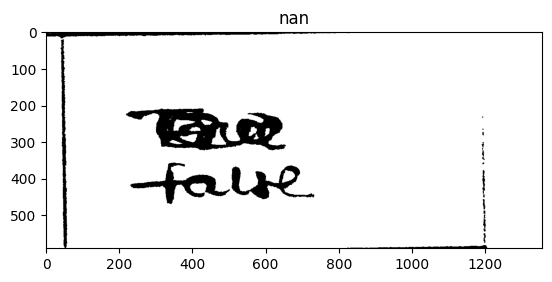

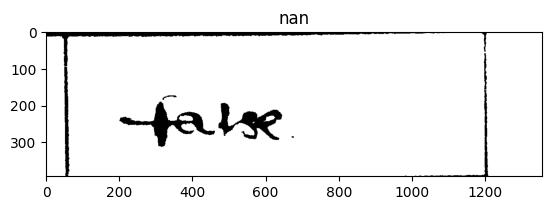

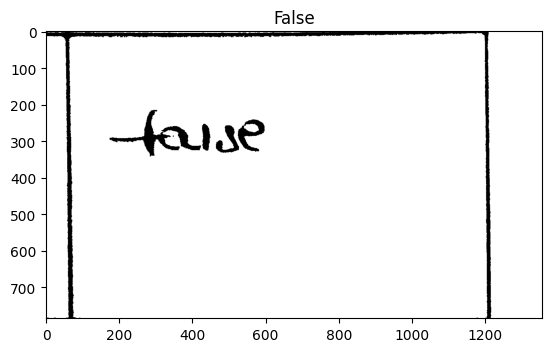

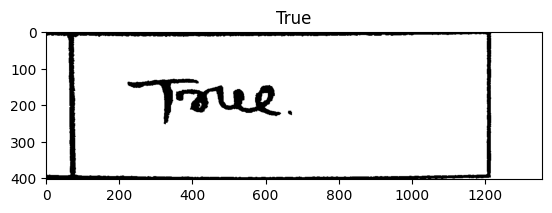

/content/drive/MyDrive/Sample_Data/20240328_153349.jpg
993 328 1086 326
587 950 779 947
630 1559 771 1557
1013 2166 1139 2166
917 2577 1040 2575
1070 3187 1199 3185
1123 3997 1216 3996
706 4615 851 4613
920 5021 1043 5017
822 5835 933 5831
1049 6238 1158 6235


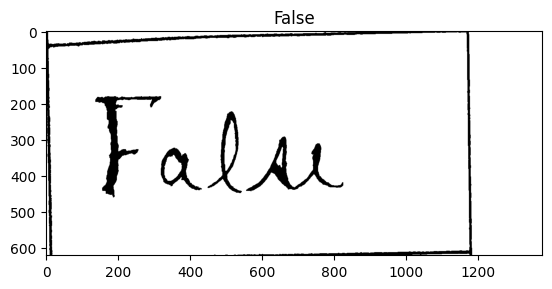

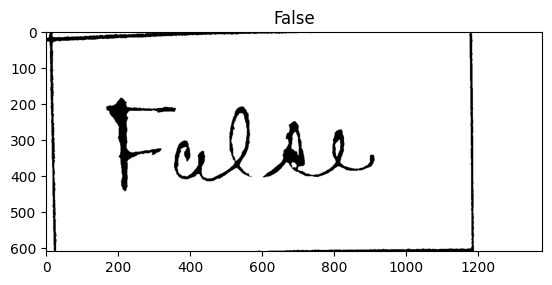

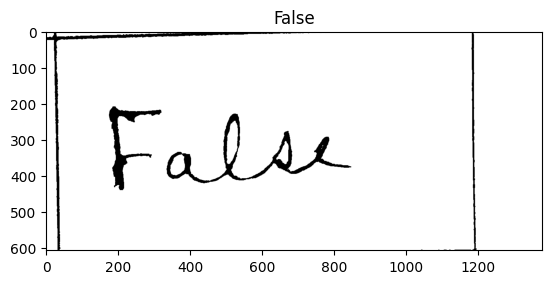

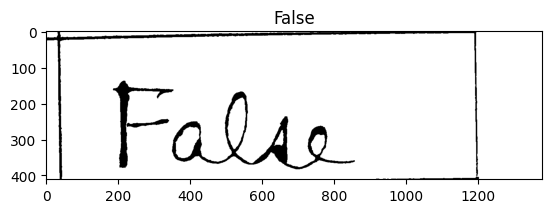

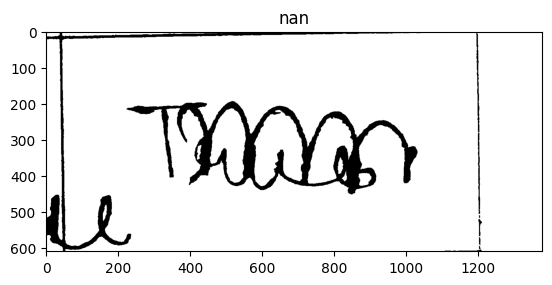

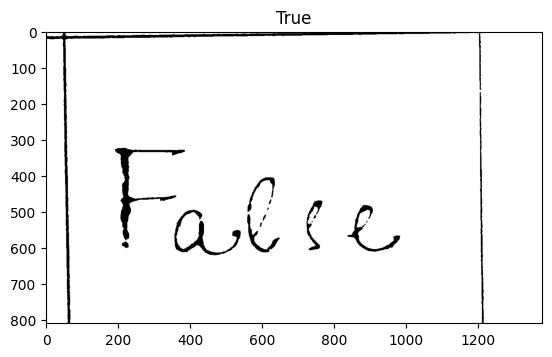

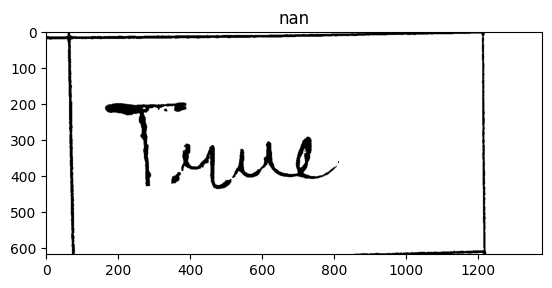

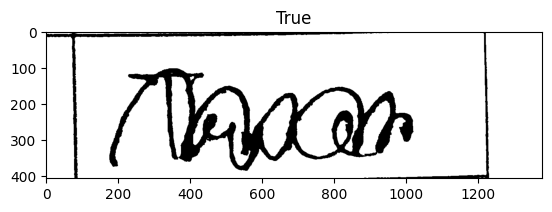

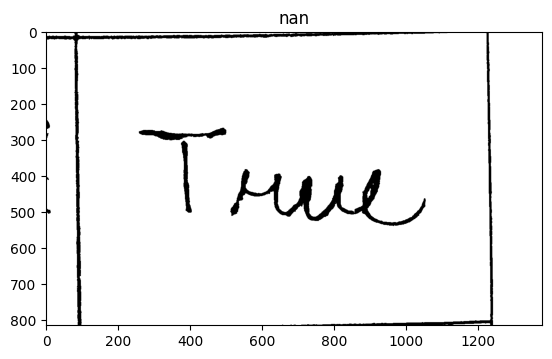

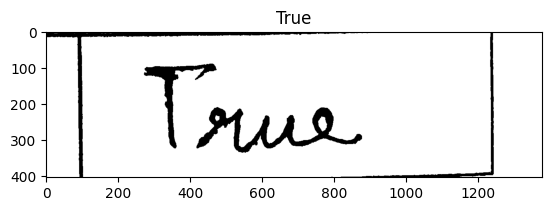

/content/drive/MyDrive/Sample_Data/20240328_153316.jpg
975 315 1065 311
874 942 1048 936
652 1574 783 1567
1007 2161 1136 2157
938 2568 1028 2567
951 3148 1096 3146
996 3921 1096 3921
512 4504 616 4502
788 4891 878 4891
958 5667 1069 5667
734 6061 830 6060


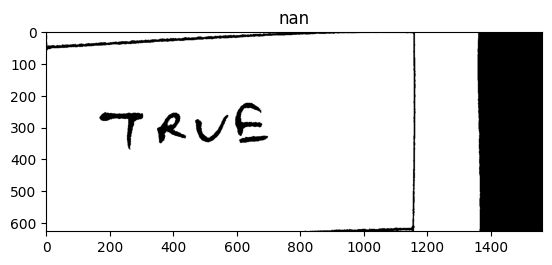

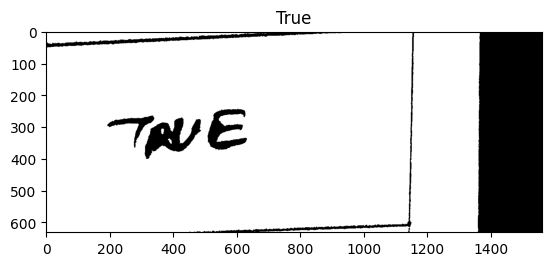

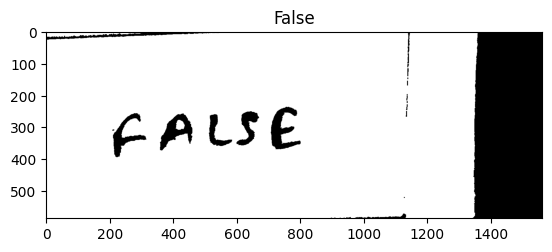

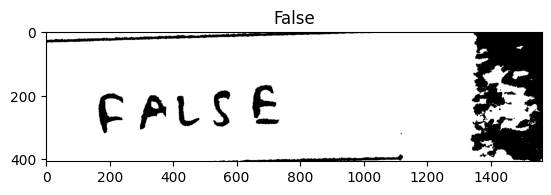

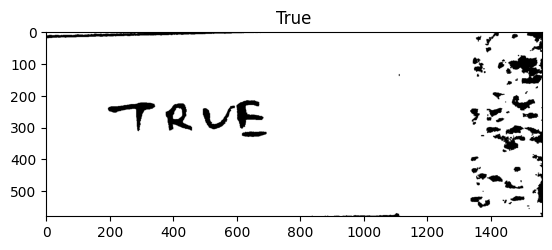

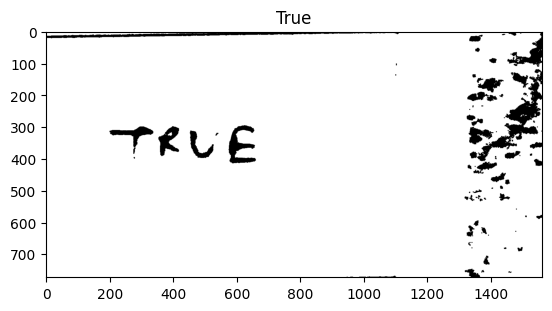

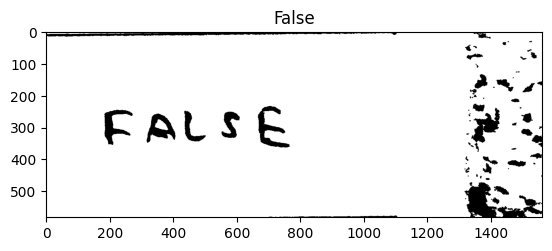

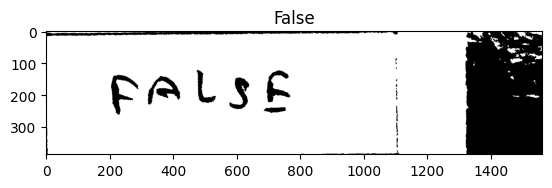

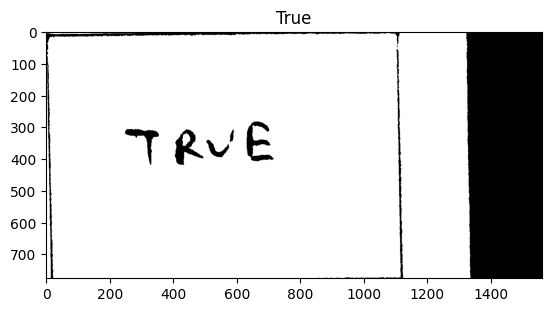

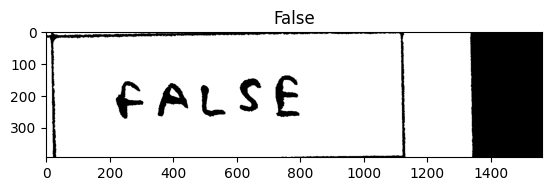

/content/drive/MyDrive/Sample_Data/20240328_145942.jpg
506 366 645 368
910 891 1038 891
963 1419 1054 1419
830 1954 936 1954
561 2314 741 2314
472 2855 590 2855
947 3585 1067 3585
1040 4138 1134 4138
895 4511 1005 4511
966 5257 1073 5255
860 5640 1091 5636


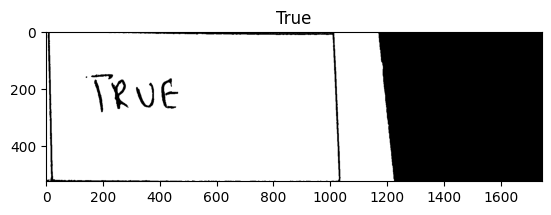

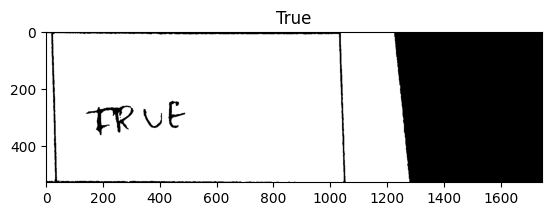

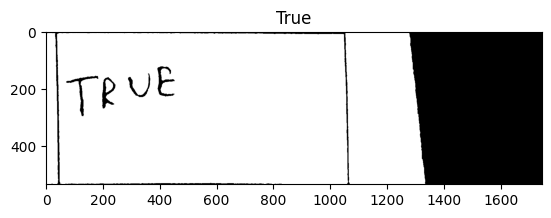

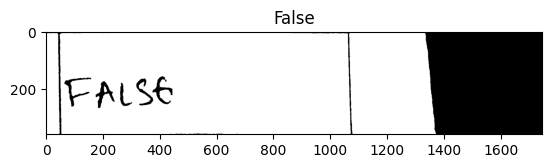

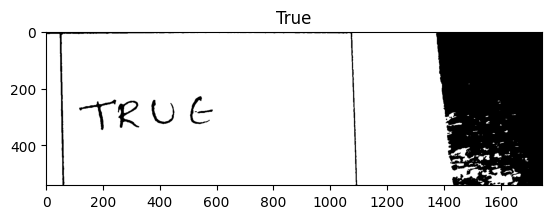

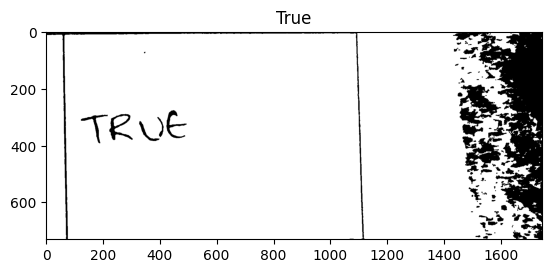

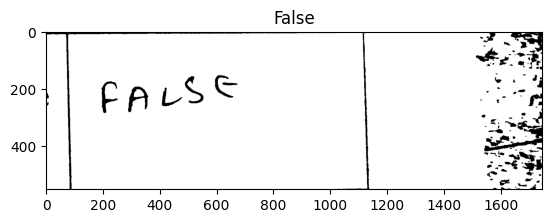

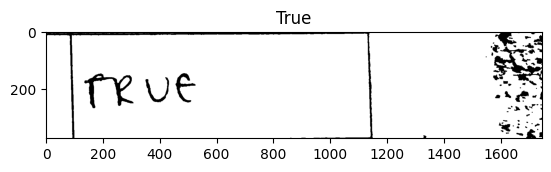

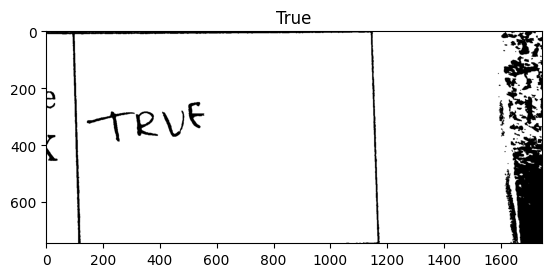

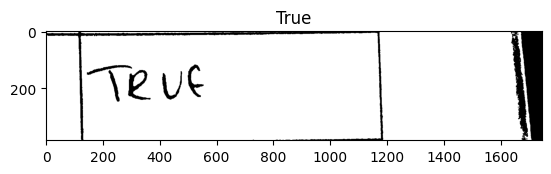

/content/drive/MyDrive/Sample_Data/20240328_150636.jpg
1075 361 1173 357
1000 1000 1100 998
1019 1614 1114 1613
765 2213 882 2211
992 2617 1087 2617
621 3202 755 3202
776 3973 871 3972
835 4555 925 4554
966 4942 1060 4941
698 5718 800 5716
909 6107 1002 6103


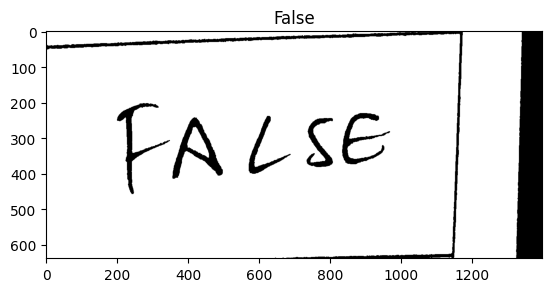

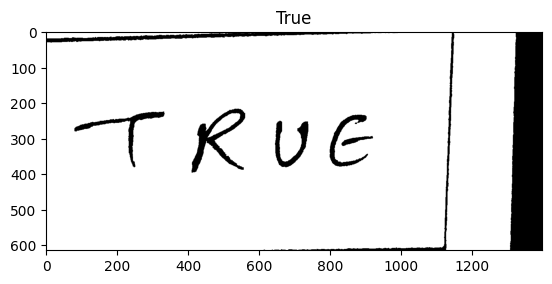

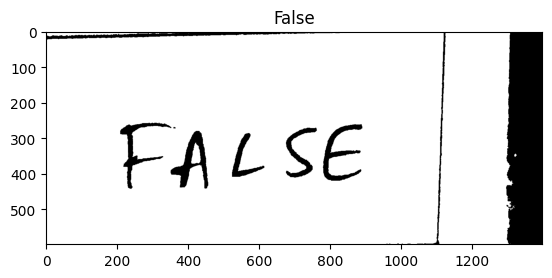

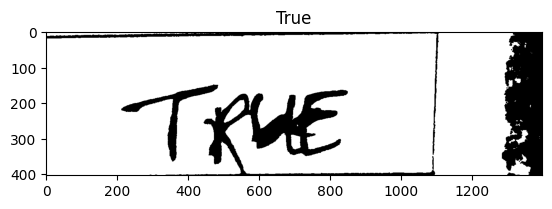

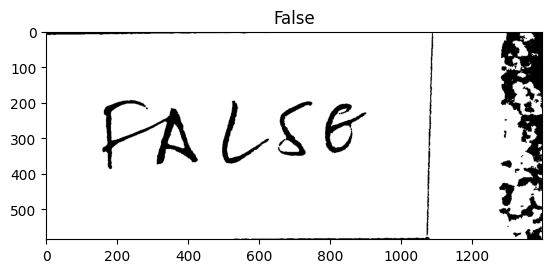

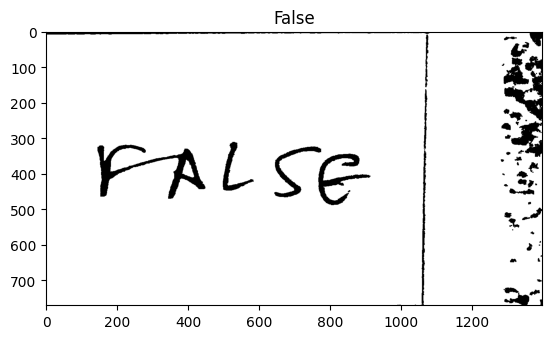

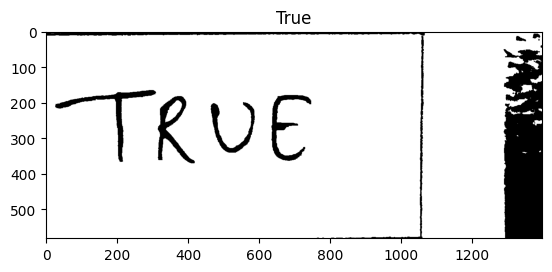

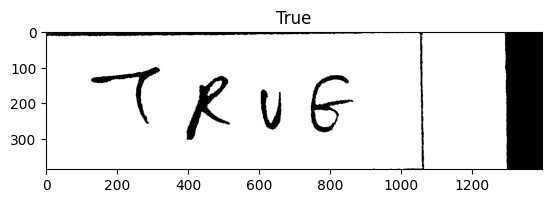

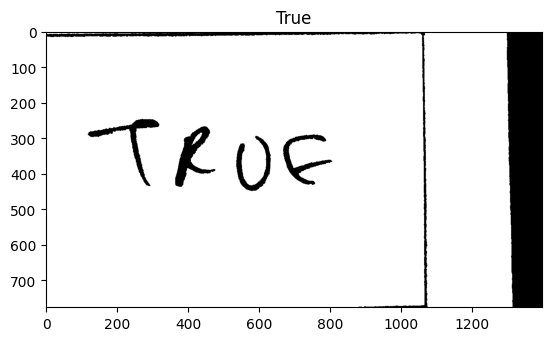

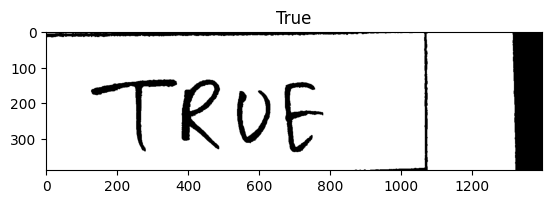

/content/drive/MyDrive/Sample_Data/20240328_154250.jpg
1012 416 1106 414
467 638 578 638
640 1014 764 1010
841 1601 978 1597
1013 2176 1149 2174
987 2567 1100 2565
1018 3152 1133 3150
710 3943 808 3940
1022 4531 1181 4526
950 4931 1041 4928
961 5724 1073 5720
1091 6110 1190 6105


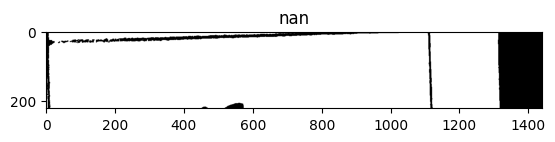

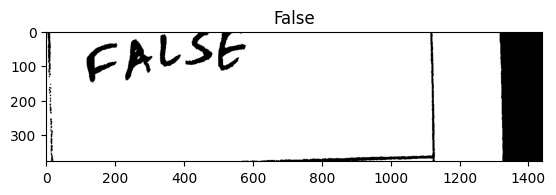

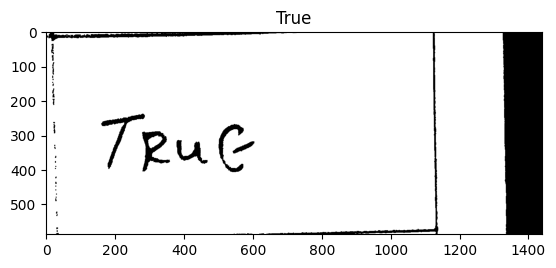

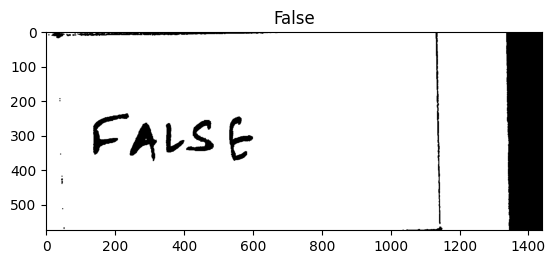

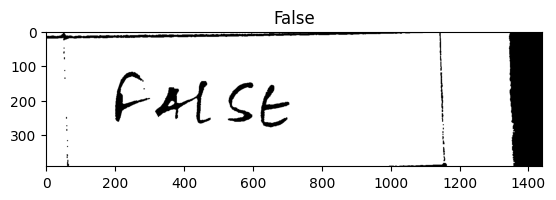

...

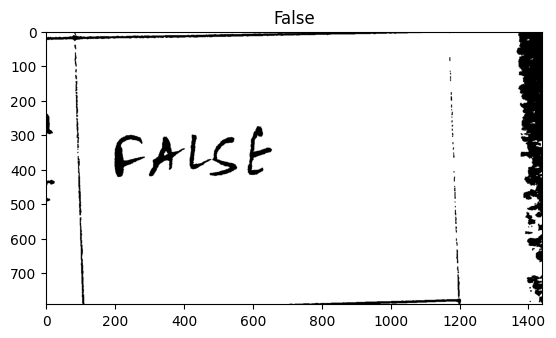

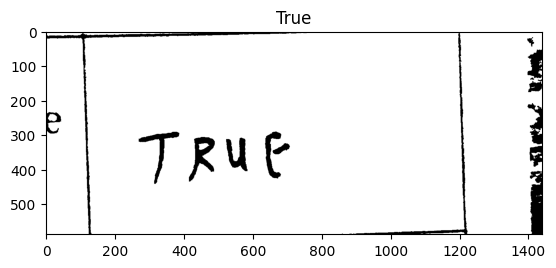

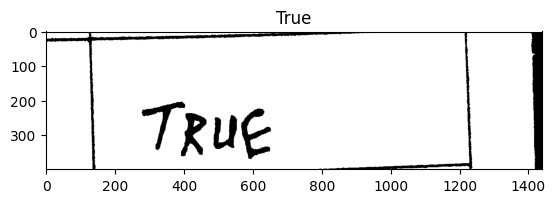

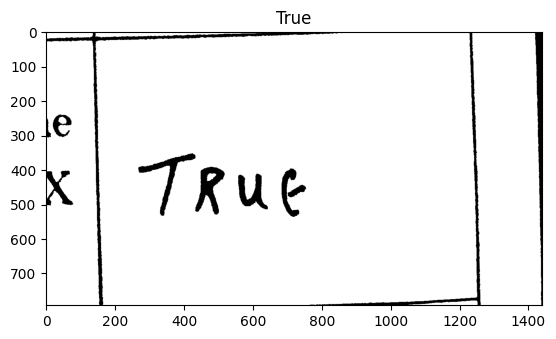

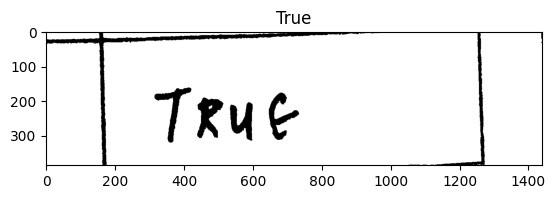

/content/drive/MyDrive/Sample_Data/20240328_150813.jpg
955 409 1047 408
827 1004 946 1000
980 1594 1093 1592
634 2178 738 2176
905 2566 1013 2566
684 3141 820 3141
537 3900 755 3900
471 4470 595 4470
705 4851 822 4851
634 5612 864 5612
747 5996 839 5995


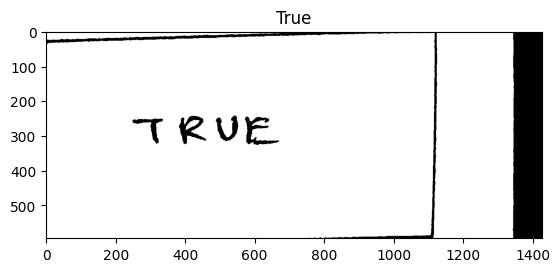

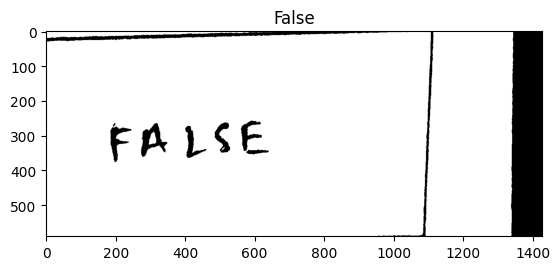

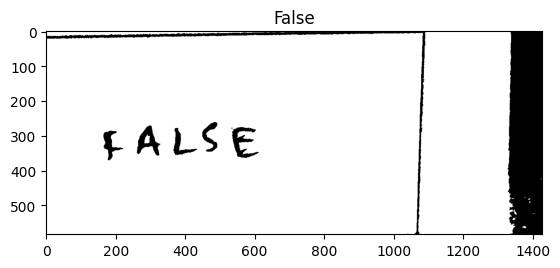

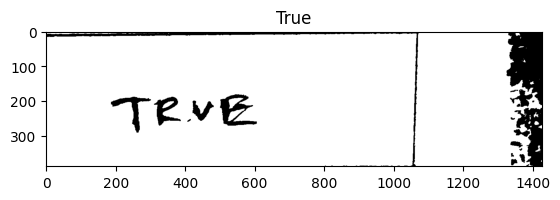

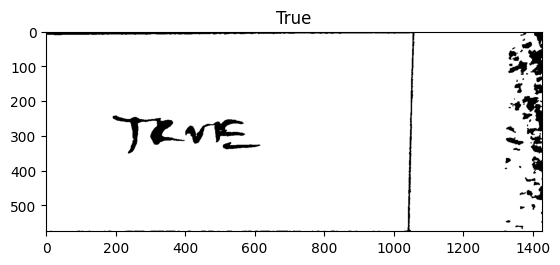

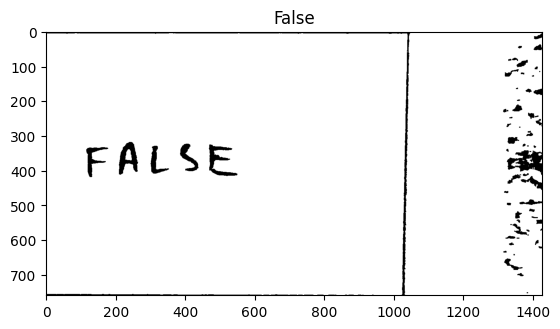

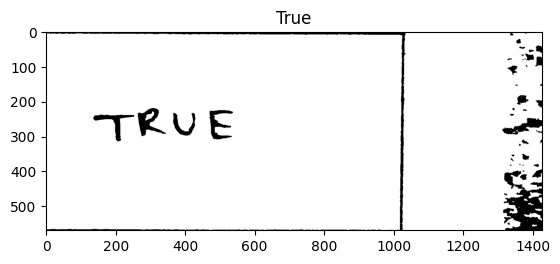

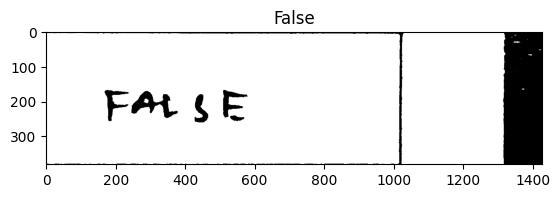

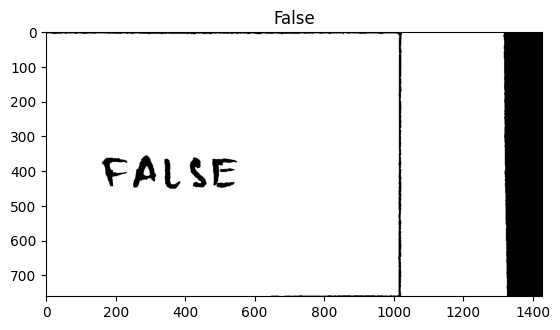

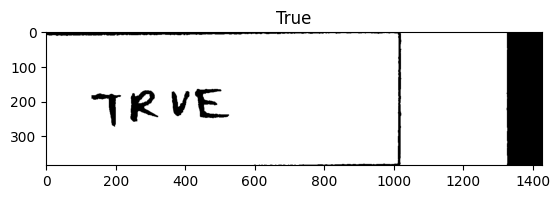

/content/drive/MyDrive/Sample_Data/20240328_155758.jpg
425 371 520 371
780 986 967 989
594 1604 761 1602
696 2208 794 2207
978 2604 1071 2603
778 3192 1047 3192
517 3962 862 3962
511 4538 611 4538
514 4926 650 4926
673 5704 790 5704
715 6095 850 6095


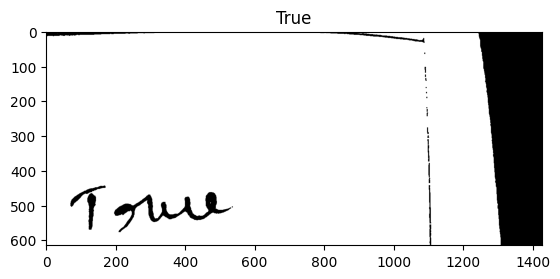

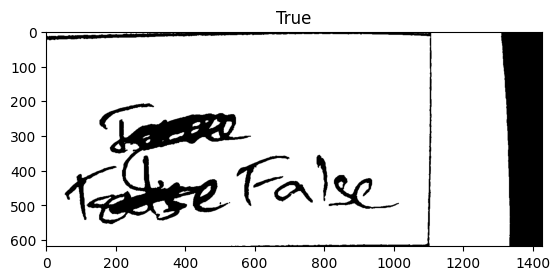

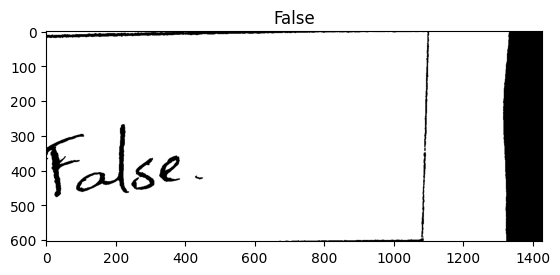

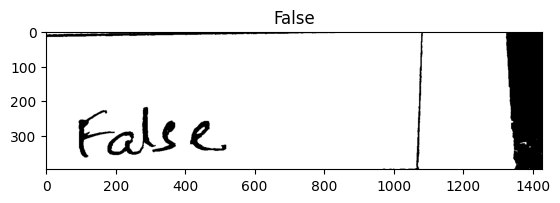

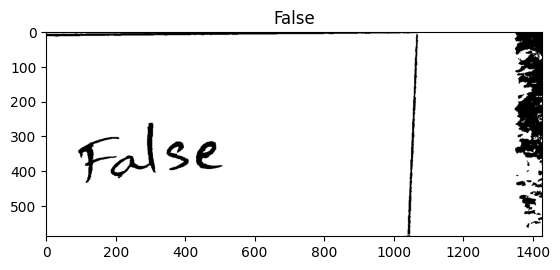

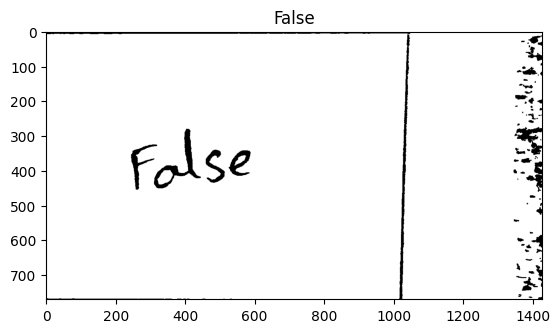

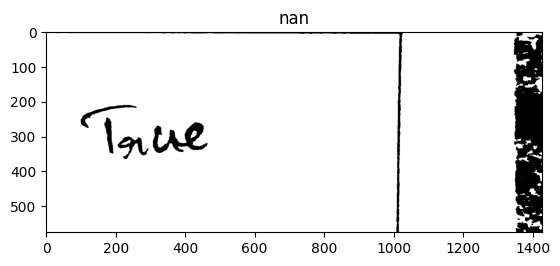

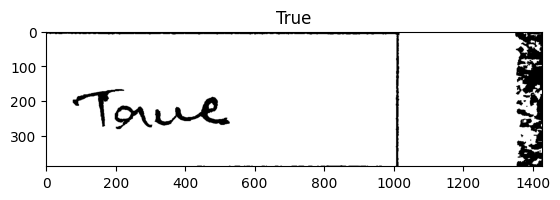

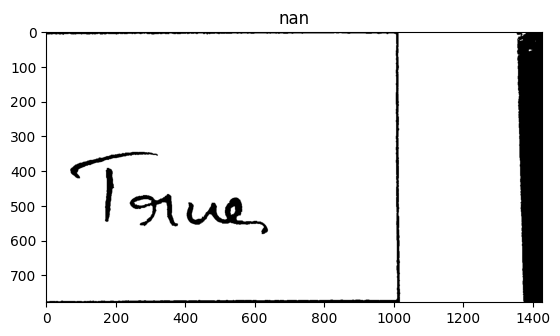

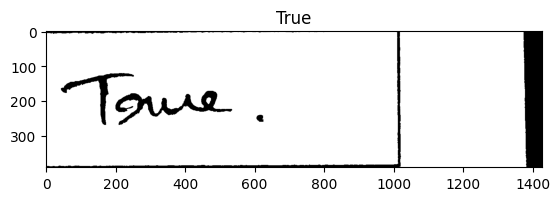

/content/drive/MyDrive/Sample_Data/20240328_151304.jpg
727 380 863 384
857 1006 1076 1002
1013 1644 1145 1642
908 2282 1022 2280
975 2703 1088 2702
855 3335 1025 3333
513 4168 717 4168
837 4792 1036 4792
1080 5210 1196 5210
1032 6048 1170 6046
846 6472 947 6470


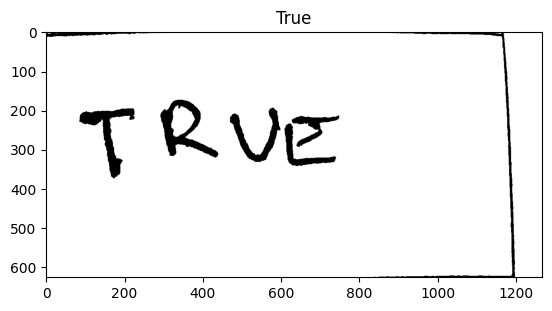

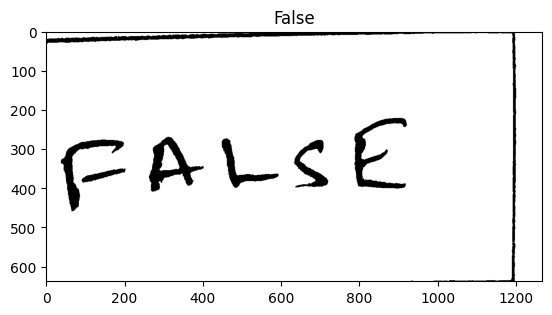

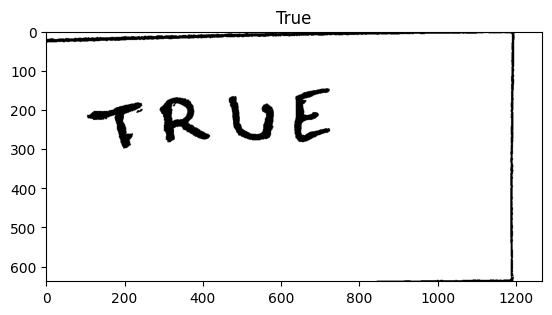

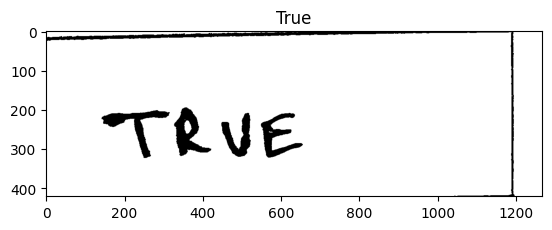

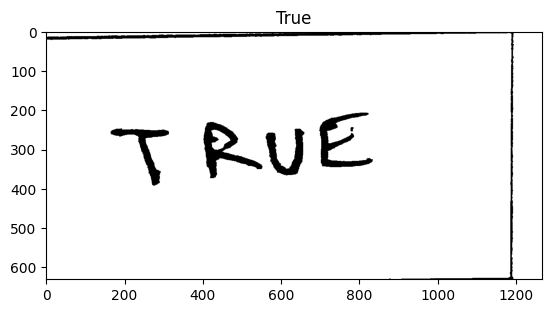

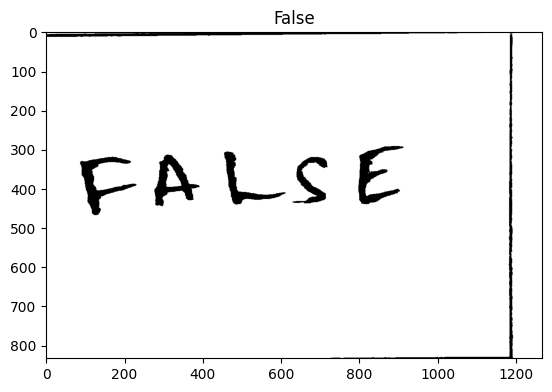

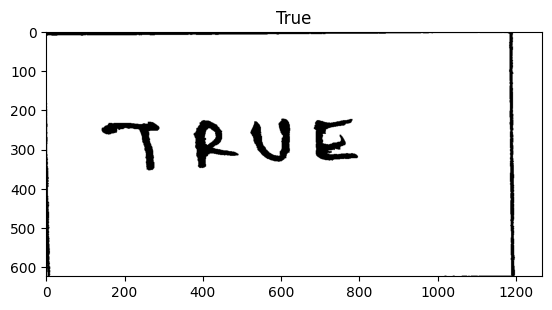

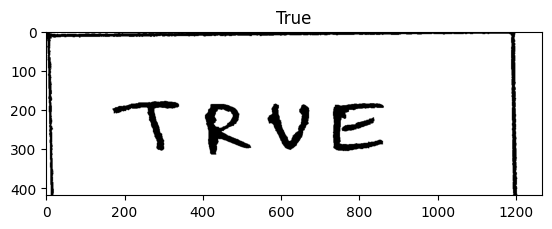

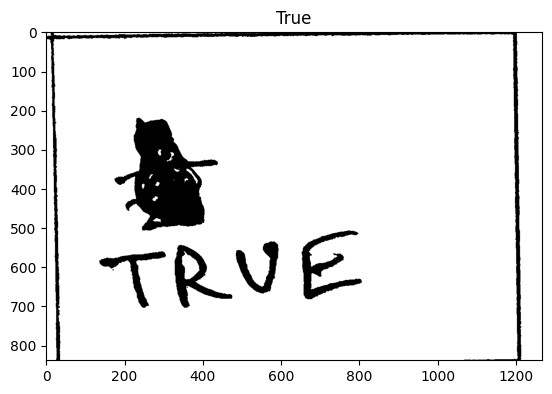

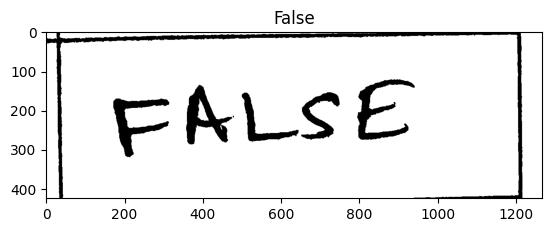

/content/drive/MyDrive/Sample_Data/20240328_154321.jpg
770 322 869 315
1043 935 1168 928
923 1562 1179 1549
928 2174 1045 2170
1001 2564 1132 2560
1064 3161 1167 3157
1021 3942 1156 3938
1011 4527 1110 4524
699 4927 830 4923
1049 5688 1181 5683
856 6079 949 6075


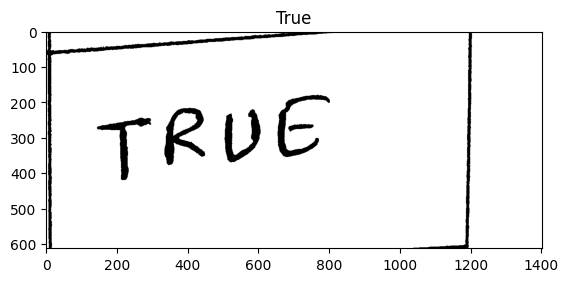

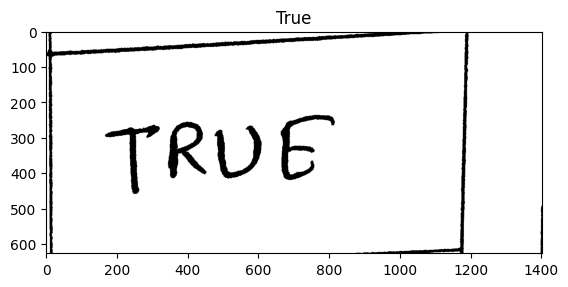

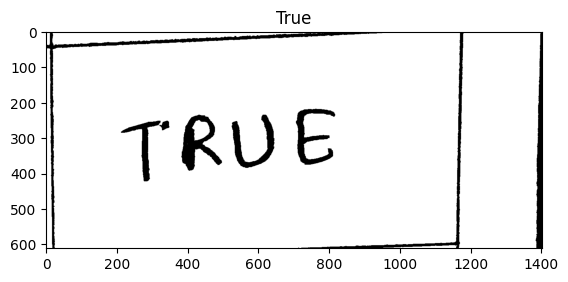

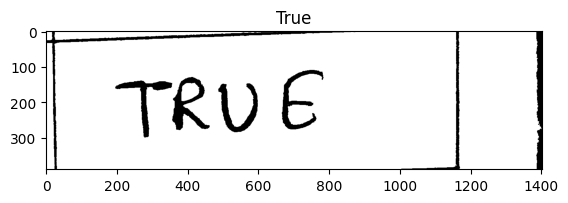

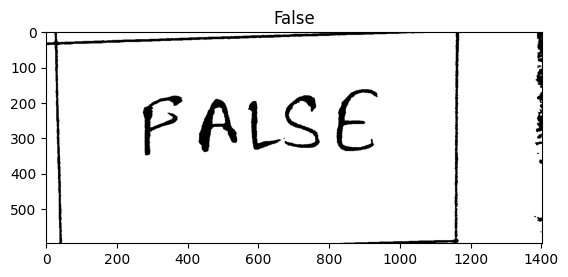

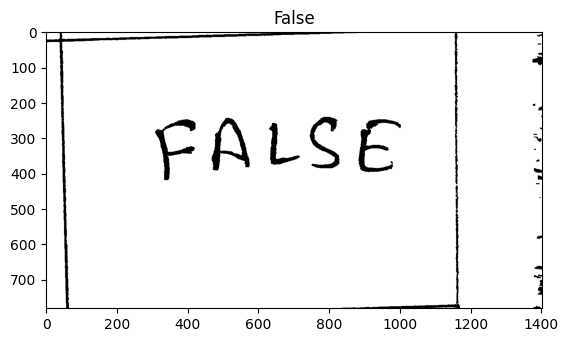

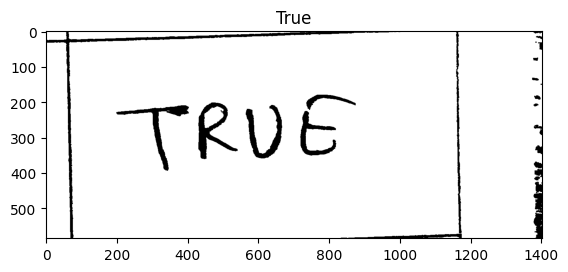

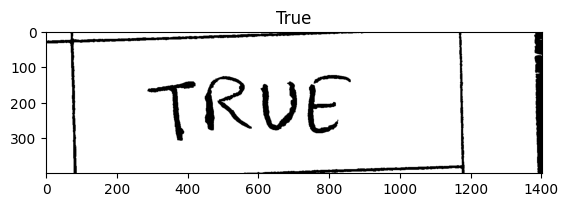

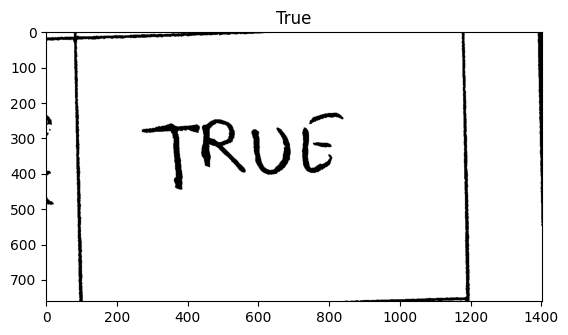

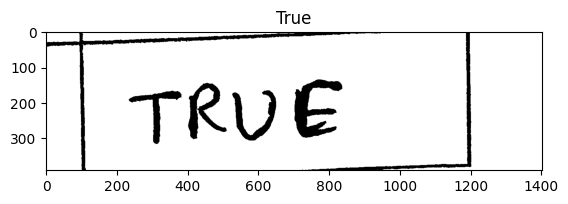

In [55]:
answers=[]
for path in arr:
    print(path)
    images,texts=get_cropped_images(path)
    answers.append(texts)

In [107]:
import pandas as pd
df=pd.DataFrame(answers)
df.to_csv("dataframe.csv")

In [66]:
li=list(df.iloc[43])
li.pop(0)
li.append("nan")

df.iloc[43]=li
df

,0,1,2,3,4,5,6,7,8,9,10
0,True,True,True,True,True,False,True,True,False,True,None
1,True,True,True,True,True,False,True,True,False,True,None
2,True,True,False,True,True,True,True,True,False,True,None
3,True,True,True,nan,False,False,False,True,True,False,None
4,True,True,False,False,True,nan,True,nan,True,True,None
5,None,None,None,None,None,None,None,None,None,None,None
6,True,True,True,True,True,True,True,True,True,True,None
7,True,True,False,True,True,False,nan,nan,nan,nan,None
8,nan,True,nan,True,True,True,nan,False,nan,None,None
9,False,True,False,False,True,False,True,True,True,True,None


In [67]:
df.drop(10,axis=1,inplace=True)
df

,0,1,2,3,4,5,6,7,8,9
0,True,True,True,True,True,False,True,True,False,True
1,True,True,True,True,True,False,True,True,False,True
2,True,True,False,True,True,True,True,True,False,True
3,True,True,True,nan,False,False,False,True,True,False
4,True,True,False,False,True,nan,True,nan,True,True
5,None,None,None,None,None,None,None,None,None,None
6,True,True,True,True,True,True,True,True,True,True
7,True,True,False,True,True,False,nan,nan,nan,nan
8,nan,True,nan,True,True,True,nan,False,nan,None
9,False,True,False,False,True,False,True,True,True,True


In [70]:
marks=pd.read_excel("/Marks.xlsx")
answer=pd.read_csv("/ModelAnswer (1).csv")
marks

,Filename,Total Marks
0,20240328_150223.jpg,3
1,20240328_160040.jpg,3
2,20240328_145219.jpg,4
3,20240328_145942.jpg,4
4,20240328_151046.jpg,4
5,20240328_151122.jpg,4
6,20240328_151342.jpg,4
7,20240328_150813.jpg,5
8,20240328_155246.jpg,5
9,20240328_153522.jpg,6


In [71]:
correct=answer['Correct Answer']
correct

0    False
1    False
2    False
3    False
4    False
5    False
6     True
7     True
8     True
9     True
Name: Correct Answer, dtype: bool

In [72]:
df.replace(np.nan,"nan",inplace=True)
df

,0,1,2,3,4,5,6,7,8,9
0,True,True,True,True,True,False,True,True,False,True
1,True,True,True,True,True,False,True,True,False,True
2,True,True,False,True,True,True,True,True,False,True
3,True,True,True,nan,False,False,False,True,True,False
4,True,True,False,False,True,nan,True,nan,True,True
5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
6,True,True,True,True,True,True,True,True,True,True
7,True,True,False,True,True,False,nan,nan,nan,nan
8,nan,True,nan,True,True,True,nan,False,nan,nan
9,False,True,False,False,True,False,True,True,True,True


In [73]:
def cal_marks(a1,a2):
    ans=0
    for i in range(len(a1)):

        if(a1[i]!="nan"):
            temp=eval(a1[i])
        else:
            temp=a1[i]
        if(temp==a2[i]):
            ans+=1
    return ans
marks1=[]
for i in range(len(df)):
    marks1.append(cal_marks(df.iloc[i],correct))
df['marks']=marks1
df

,0,1,2,3,4,5,6,7,8,9,marks
0,True,True,True,True,True,False,True,True,False,True,4
1,True,True,True,True,True,False,True,True,False,True,4
2,True,True,False,True,True,True,True,True,False,True,4
3,True,True,True,nan,False,False,False,True,True,False,4
4,True,True,False,False,True,nan,True,nan,True,True,5
5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0
6,True,True,True,True,True,True,True,True,True,True,4
7,True,True,False,True,True,False,nan,nan,nan,nan,2
8,nan,True,nan,True,True,True,nan,False,nan,nan,0
9,False,True,False,False,True,False,True,True,True,True,8


In [76]:
names=[i.split('/')[-1] for i in arr]
names

['20240328_145219.jpg',
 '20240328_152349.jpg',
 '20240328_151046.jpg',
 '20240328_155745.jpg',
 '20240328_153456.jpg',
 '20240328_153252.jpg',
 '20240328_151122.jpg',
 '20240328_153522.jpg',
 '20240328_150204.jpg',
 '20240328_152515.jpg',
 '20240328_154601.jpg',
 '20240328_150414.jpg',
 '20240328_153807.jpg',
 '20240328_151020.jpg',
 '20240328_155246.jpg',
 '20240328_151342.jpg',
 '20240328_154830.jpg',
 '20240328_145719.jpg',
 '20240328_153543.jpg',
 '20240328_154610.jpg',
 '20240328_151033.jpg',
 '20240328_145247.jpg',
 '20240328_152325.jpg',
 '20240328_152314.jpg',
 '20240328_155852.jpg',
 '20240328_150931.jpg',
 '20240328_153433.jpg',
 '20240328_153036.jpg',
 '20240328_150651.jpg',
 '20240328_155818.jpg',
 '20240328_145458.jpg',
 '20240328_151238.jpg',
 '20240328_145148.jpg',
 '20240328_155417.jpg',
 '20240328_153338.jpg',
 '20240328_153306.jpg',
 '20240328_152408.jpg',
 '20240328_160040.jpg',
 '20240328_150223.jpg',
 '20240328_153349.jpg',
 '20240328_153316.jpg',
 '20240328_14594

In [ ]:
marks[marks['Filename']=='20240328_150636.jpg']['Total Marks'].values[0]

8

In [94]:
real_marks=[marks[marks['Filename']==i]['Total Marks'].values[0] for i in names]
np.array(real_marks).mean()
real_marks

[4,
 4,
 4,
 6,
 7,
 9,
 4,
 6,
 5,
 8,
 7,
 10,
 8,
 5,
 5,
 4,
 7,
 6,
 9,
 7,
 4,
 5,
 10,
 7,
 9,
 6,
 8,
 7,
 9,
 6,
 8,
 8,
 6,
 7,
 10,
 9,
 5,
 3,
 3,
 9,
 3,
 4,
 8,
 8,
 5,
 9,
 5,
 6]

In [97]:
df

,0,1,2,3,4,5,6,7,8,9,marks
0,True,True,True,True,True,False,True,True,False,True,4.0
1,True,True,True,True,True,False,True,True,False,True,4.0
2,True,True,False,True,True,True,True,True,False,True,4.0
3,True,True,True,nan,False,False,False,True,True,False,4.0
4,True,True,False,False,True,nan,True,nan,True,True,5.0
5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,6.5
6,True,True,True,True,True,True,True,True,True,True,4.0
7,True,True,False,True,True,False,nan,nan,nan,nan,2.0
8,nan,True,nan,True,True,True,nan,False,nan,nan,6.5
9,False,True,False,False,True,False,True,True,True,True,8.0


In [105]:
pred_marks=df['marks']

for i in range(len(pred_marks)):
  if(pred_marks[i]==0):
    pred_marks[i]=int(6)
pred_marks=pred_marks.astype(int)



In [106]:
from sklearn.metrics import accuracy_score,mean_absolute_error
print(f"accuracy : {accuracy_score(real_marks,pred_marks)}")
print(f"mae : {mean_absolute_error(real_marks,pred_marks)}")

accuracy : 0.5416666666666666
mae : 1.0416666666666667
